# EEG Classification and Clustering

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1. Load Data:

In [ ]:
import scipy.io
import numpy as np

mat = scipy.io.loadmat('/content/drive/MyDrive/BCICIV_calib_ds1a.mat')

### 1.1. Extract Variables from ".mat" File:

In [ ]:
EEG = mat['cnt']
EEG = 0.1 * EEG.astype(np.float64)

if 'mrk' in mat:
    mrk = mat['mrk']
    window_pos = mrk['pos'][0][0].flatten()
    window_label = mrk['y'][0][0].flatten()
else:
    window_pos = None
    window_label = None

nfo = mat['nfo']
fs = nfo['fs'][0][0].item()
channel_name = [str(label[0]) for label in nfo['clab'][0][0].flatten()]
classes = [str(cls[0]) for cls in nfo['classes'][0][0].flatten()]
xpos = nfo['xpos'][0][0].flatten()
ypos = nfo['ypos'][0][0].flatten()

### 1.2. Some Info About Dataset:

In [ ]:
print("Continuous EEG signals (cnt):", EEG.shape)
if window_pos is not None and window_label is not None:
    print("Positions of cues (pos):", window_pos)
    print("Target classes (y):", window_label)
print("Sampling rate (fs):", fs)
print("Channel labels (clab):", channel_name)
print("Motor imagery classes:", classes)
print("X-positions of electrodes (xpos):", xpos)
print("Y-positions of electrodes (ypos):", ypos)

Continuous EEG signals (cnt): (190594, 59)
Positions of cues (pos): [  2091   2891   3691   4491   5291   6091   6891   7692   8492   9292
  10092  10892  11692  12492  13292  16294  17094  17894  18694  19494
  20294  21094  21894  22694  23494  24294  25094  25894  26694  27494
  30495  31295  32095  32895  33695  34495  35295  36095  36895  37695
  38495  39295  40095  40895  41695  44696  45496  46296  47096  47896
  48696  49496  50296  51096  51896  52696  53496  54296  55096  55896
  58895  59695  60495  61295  62095  62895  63695  64495  65295  66095
  66895  67695  68495  69295  70095  73094  73894  74694  75495  76295
  77095  77895  78695  79495  80295  81095  81895  82695  83495  84295
  87294  88094  88894  89694  90494  91294  92094  92894  93694  94494
  97385  98185  98985  99785 100585 101385 102185 102985 103785 104585
 105385 106185 106985 107785 108585 111584 112384 113184 113984 114784
 115584 116384 117184 117984 118785 119585 120385 121185 121985 122785
 125787 1

### 1.3. Plot Electrode Positions:

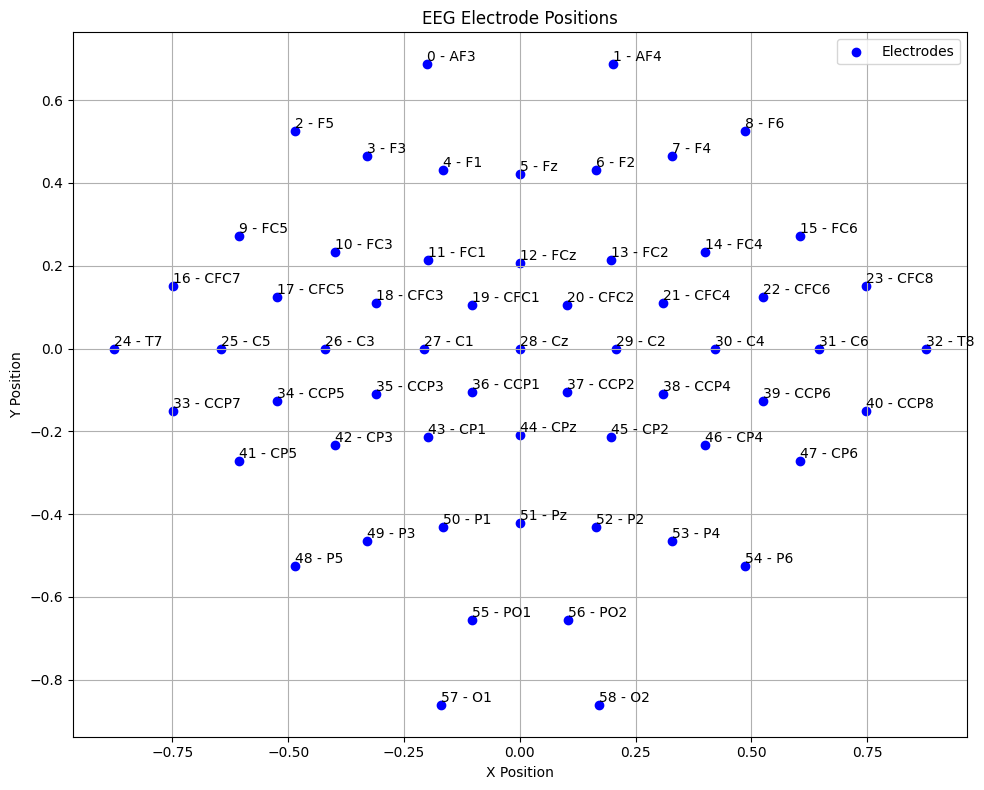

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8))
plt.scatter(xpos, ypos, marker='o', color='b', label='Electrodes')

for index, (x, y, name) in  enumerate(zip(xpos, ypos, channel_name)):
    plt.text(x, y, f'{index} - {name}', fontsize=10, ha='left', va='bottom')

plt.title('EEG Electrode Positions')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

## 2. Bandpass Filter:

### 2.1. Bandpass Fillter Functions:

In [ ]:
from scipy.signal import butter, filtfilt

def butter_bandpass(lowcut, highcut, fs, order=3):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return b, a

def bandpass_filter(data, lowcut, highcut, fs, order=3):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = filtfilt(b, a, data, axis=0)
    return y

### 2.2. Apply Filters:

In [ ]:
mu_band = (8, 12)
beta_band = (13, 30)

EEG_mu = bandpass_filter(EEG, mu_band[0], mu_band[1], fs)
EEG_beta = bandpass_filter(EEG, beta_band[0], beta_band[1], fs)

EEG_mu_beta = bandpass_filter(EEG, mu_band[0], beta_band[1], fs)

print("Original EEG signals (EEG):", EEG.shape)
print("Mu band EEG signals (EEG_mu):", EEG_mu.shape)
print("Beta band EEG signals (EEG_beta):", EEG_beta.shape)
print("mu+beta EEG signals (EEG_mu_beta):", EEG_mu_beta.shape)

Original EEG signals (EEG): (190594, 59)
Mu band EEG signals (EEG_mu): (190594, 59)
Beta band EEG signals (EEG_beta): (190594, 59)
mu+beta EEG signals (EEG_mu_beta): (190594, 59)


### 2.3. Plot Filter Effect:

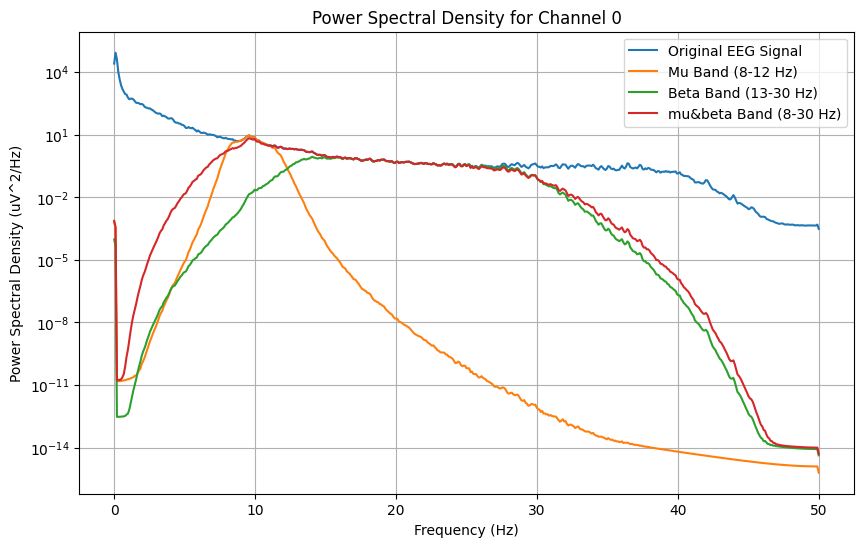

In [ ]:
import matplotlib.pyplot as plt
from scipy.signal import welch

def plot_psd(data, fs, title, channel_index):
    f, Pxx = welch(data[:, channel_index], fs, nperseg=1024)
    plt.semilogy(f, Pxx)

channel_to_plot = 0

plt.figure(figsize=(10, 6))

plot_psd(EEG, fs, 'Original EEG Signal', channel_to_plot)
plot_psd(EEG_mu, fs, 'Mu Band (8-12 Hz)', channel_to_plot)
plot_psd(EEG_beta, fs, 'Beta Band (13-30 Hz)', channel_to_plot)
plot_psd(EEG_mu_beta, fs, 'EEG_mu_beta Band (8-30 Hz)', channel_to_plot)

plt.title(f'Power Spectral Density for Channel {channel_to_plot}')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density (uV^2/Hz)')
plt.legend(['Original EEG Signal', 'Mu Band (8-12 Hz)', 'Beta Band (13-30 Hz)','mu&beta Band (8-30 Hz)'])
plt.grid()
plt.show()

## 3. Spatial Filter:

### 3.1. CAR:

In [ ]:
def apply_car_filter(data):
    mean_signal = np.mean(data, axis=1, keepdims=True)
    car_filtered = data - mean_signal
    return car_filtered

EEG_mu_car = apply_car_filter(EEG_mu)
EEG_beta_car = apply_car_filter(EEG_beta)
EEG_mu_beta_car = apply_car_filter(EEG_mu_beta)

print("CAR-filtered Mu band EEG signals (EEG_mu_car):", EEG_mu_car.shape)
print("CAR-filtered Beta band EEG signals (EEG_beta_car):", EEG_beta_car.shape)
print("CAR-filtered mu+Beta band EEG signals (EEG_mu_beta_car):", EEG_mu_beta_car.shape)

CAR-filtered Mu band EEG signals (EEG_mu_car): (190594, 59)
CAR-filtered Beta band EEG signals (EEG_beta_car): (190594, 59)
CAR-filtered mu+Beta band EEG signals (EEG_mu_beta_car): (190594, 59)


### 3.2. Laplacian Filter:

The implementation of the Laplacian in EEG filtering on the voltage at each electrode is to subtract the weighted voltages from the surrounding electrodes from the voltage recording at current electrode, where the weight is electrode distance dependent.

In [ ]:

def apply_laplacian_filter(data, electrode_locations, radius=0.25):
    filtered_data = np.zeros_like(data)
    n_channels = data.shape[0]
    n_samples = data.shape[1]

    for i in range(n_channels):
        channel_data = data[i]
        channel_location = electrode_locations[i]
        distance = np.linalg.norm(electrode_locations - channel_location, axis=1)
        neighbors = np.nonzero(distance <= radius)
        filtered_data[i] = channel_data - np.mean(channel_data[neighbors])
    return filtered_data

electrode_locations = np.column_stack((xpos, ypos))

EEG_mu_laplacian = apply_laplacian_filter(EEG_mu.T, electrode_locations)
EEG_beta_laplacian = apply_laplacian_filter(EEG_beta.T, electrode_locations)
EEG_mu_beta_laplacian = apply_laplacian_filter(EEG_mu_beta.T, electrode_locations)

EEG_mu_laplacian = EEG_mu_laplacian.T
EEG_beta_laplacian = EEG_beta_laplacian.T
EEG_mu_beta_laplacian = EEG_mu_beta_laplacian.T

print("Laplacian-filtered Mu band EEG signals (EEG_mu_laplacian):", EEG_mu_laplacian.shape)
print("Laplacian-filtered Beta band EEG signals (EEG_beta_laplacian):", EEG_beta_laplacian.shape)
print("Laplacian-filtered mu&Beta band EEG signals (EEG_mu_beta_laplacian):", EEG_mu_beta_laplacian.shape)

Laplacian-filtered Mu band EEG signals (EEG_mu_laplacian): (190594, 59)
Laplacian-filtered Beta band EEG signals (EEG_beta_laplacian): (190594, 59)
Laplacian-filtered mu&Beta band EEG signals (EEG_mu_beta_laplacian): (190594, 59)


## 4. Data Illustration:

### 4.1. Functions for Plotting Signals:

In [ ]:
import matplotlib.pyplot as plt

def plot_signals(original, filtered, title, filter_name, channel_index):
    plt.figure(figsize=(15, 6))
    plt.plot(original[:, channel_index], label=f'{title} before filter', alpha=0.7)
    plt.plot(filtered[:, channel_index], label=f'{title} {filter_name}-filtered', alpha=0.7)
    plt.title(f'{filter_name} filter - Channel {channel_index}')
    plt.xlabel('Time (samples)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid()
    plt.show()

def amplitude_plot(EEG1, EEG2, EEG3):

  plt.figure(figsize=(20, 10))
  channels_to_plot = [0, 19, 28]

  for i, ch in enumerate(channels_to_plot):
      plt.subplot(len(channels_to_plot), 3, 3*i + 1)
      plt.plot(EEG1[:800, ch])
      plt.title(f'Original EEG Data - Channel {channel_name[ch]}')
      plt.xlabel('Time')
      plt.ylabel('Amplitude')

      plt.subplot(len(channels_to_plot), 3, 3*i + 2)
      plt.plot(EEG2[:800, ch])
      plt.title(f'CAR Filtered EEG Data - Channel {channel_name[ch]}')
      plt.xlabel('Time')
      plt.ylabel('Amplitude')

      plt.subplot(len(channels_to_plot), 3, 3*i + 3)
      plt.plot(EEG3[:800, ch])
      plt.title(f'Laplacian Filtered EEG Data - Channel {channel_name[ch]}')
      plt.xlabel('Time')
      plt.ylabel('Amplitude')

  plt.tight_layout()
  plt.show()

def amplitude_scatter_plot(EEG1, EEG2, EEG3):

    time_point = 800
    plt.figure(figsize=(20, 6))

    plt.subplot(1, 3, 1)
    sc1 = plt.scatter(xpos, ypos, c=EEG1[time_point, :], cmap='viridis', marker='o')
    plt.title('EEG Data Before Laplacian Filter')
    plt.xlabel('X Position')
    plt.ylabel('Y Position')
    plt.grid(True)

    plt.subplot(1, 3, 2)
    sc2 = plt.scatter(xpos, ypos, c=EEG2[time_point, :], cmap='viridis', marker='o')
    plt.title('EEG Data After CAR Filter')
    plt.xlabel('X Position')
    plt.ylabel('Y Position')
    plt.grid(True)

    plt.subplot(1, 3, 3)
    sc3 = plt.scatter(xpos, ypos, c=EEG3[time_point, :], cmap='viridis', marker='o')
    plt.title('EEG Data After Laplacian Filter')
    plt.xlabel('X Position')
    plt.ylabel('Y Position')
    plt.grid(True)

    cbar = plt.colorbar(sc3, label='Amplitude')
    cbar.set_label('Amplitude')

    plt.tight_layout()
    plt.show()

### 4.2. Functions for Applying t-SNE

In [ ]:
!pip install --extra-index-url=https://pypi.nvidia.com cuml-cu12==24.4.*

In [ ]:
from cuml.manifold import TSNE
import matplotlib.pyplot as plt

def apply_tsne(data, n_components=2, perplexity=10, n_iter=1000):
    tsne = TSNE(n_components=n_components, perplexity=perplexity, n_iter=n_iter, random_state=42)
    data_flattened = data.reshape(data.shape[0], -1)
    return tsne.fit_transform(data_flattened)

def plot_tsne(tsne1, tsne2, tsne3, title):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))

    ax1.scatter(tsne1[:, 0], tsne1[:, 1], alpha=0.5, c='b', label='EEG')
    ax1.set_title('EEG')
    ax1.set_xlabel('t-SNE 1')
    ax1.set_ylabel('t-SNE 2')
    ax1.legend()

    ax2.scatter(tsne2[:, 0], tsne2[:, 1], alpha=0.5, c='r', label='CAR EEG')
    ax2.set_title('CAR EEG')
    ax2.set_xlabel('t-SNE 1')
    ax2.set_ylabel('t-SNE 2')
    ax2.legend()

    ax3.scatter(tsne3[:, 0], tsne3[:, 1], alpha=0.5, c='c', label='Laplacian EEG')
    ax3.set_title('Laplacian EEG')
    ax3.set_xlabel('t-SNE 1')
    ax3.set_ylabel('t-SNE 2')
    ax3.legend()

    fig.suptitle(title)
    plt.tight_layout()
    plt.show()

def plot_tsne_seperated(tsne_data, title):
    plt.figure(figsize=(8, 6))
    plt.scatter(tsne_data[:, 0], tsne_data[:, 1], alpha=0.5)
    plt.title(title)
    plt.xlabel('t-SNE 1')
    plt.ylabel('t-SNE 2')
    plt.show()

### 4.3. Plot Signals:

#### 4.3.1 plot filter effects:

* MU+Beta Band:

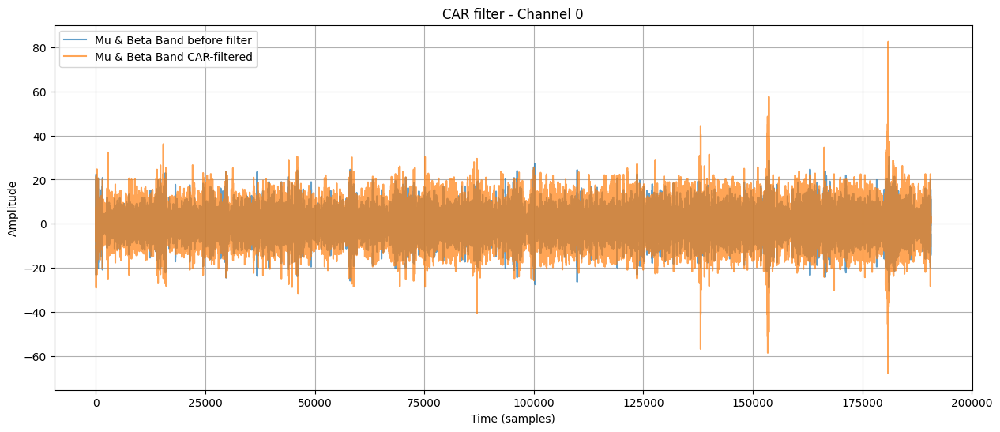

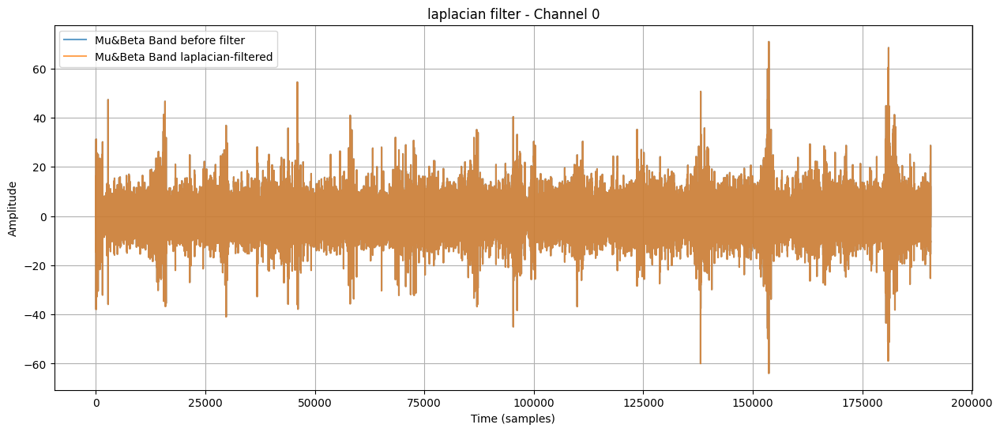

In [ ]:
channel_to_plot = 0

plot_signals(EEG_mu, EEG_mu_beta_car, 'Mu & Beta Band', 'CAR', channel_to_plot)
plot_signals(EEG_mu_beta, EEG_mu_beta_laplacian,'Mu&Beta Band', 'laplacian', channel_to_plot)

#### 4.3.2 plot different channels:

* MU+Beta Band:

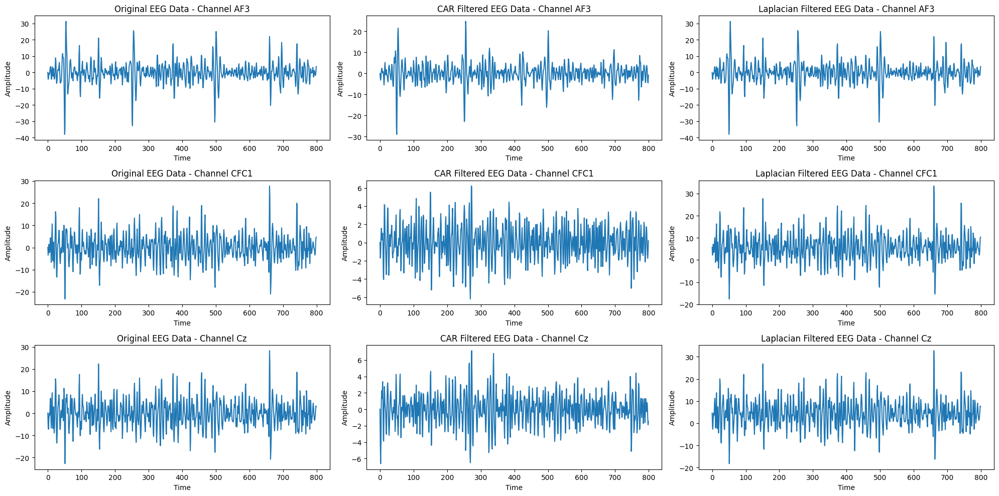

In [ ]:
amplitude_plot(EEG_mu_beta, EEG_mu_beta_car, EEG_mu_beta_laplacian)

* MU Band:

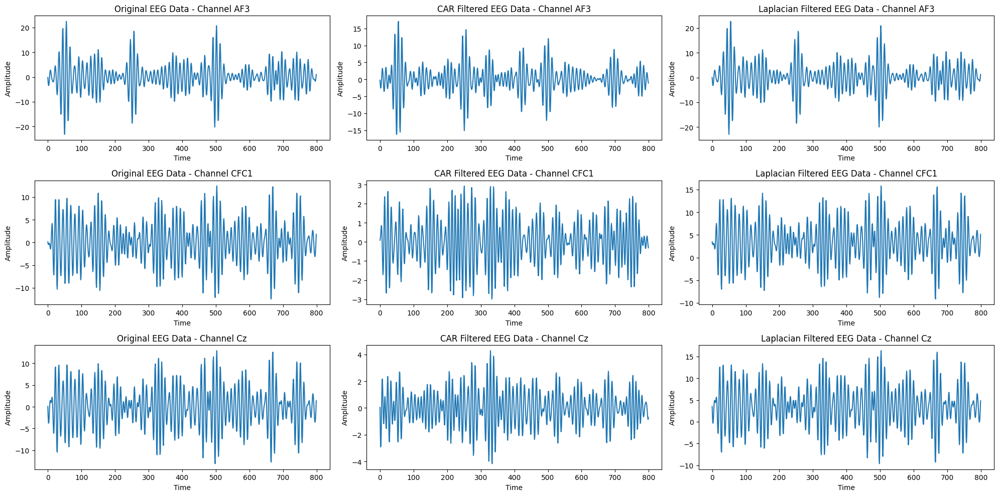

In [ ]:
amplitude_plot(EEG_mu, EEG_mu_car, EEG_mu_laplacian)

* Beta Band:

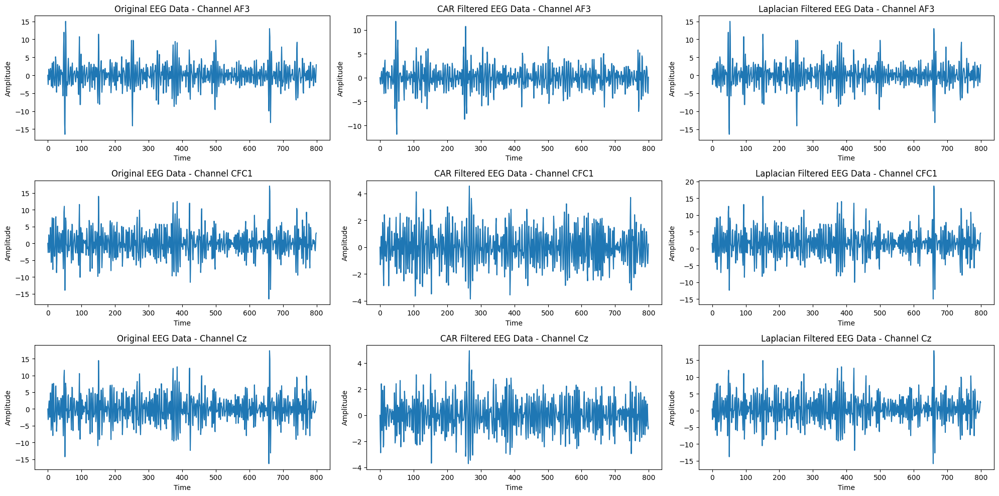

In [ ]:
amplitude_plot(EEG_beta, EEG_beta_car, EEG_beta_laplacian)

#### 4.3.3 scatter plot electrodes:

* MU+Beta Band:

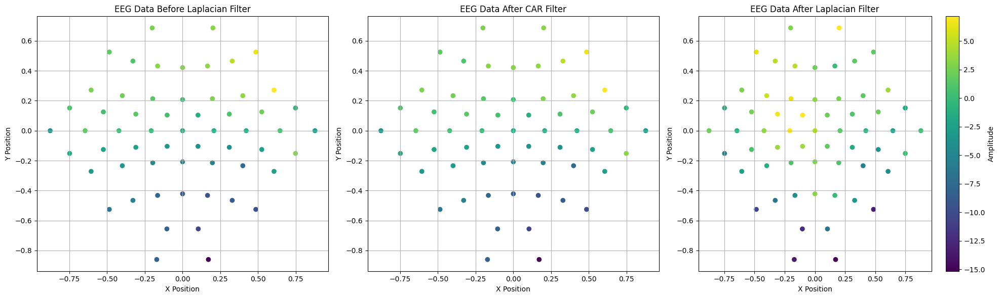

In [ ]:
amplitude_scatter_plot(EEG_mu_beta, EEG_mu_beta_car, EEG_mu_beta_laplacian)

* MU BAnd:

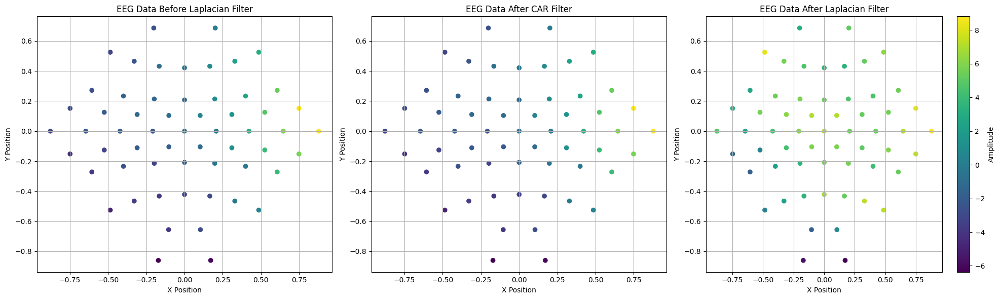

In [ ]:
amplitude_scatter_plot(EEG_mu, EEG_mu_car, EEG_mu_laplacian)

* Beta Band

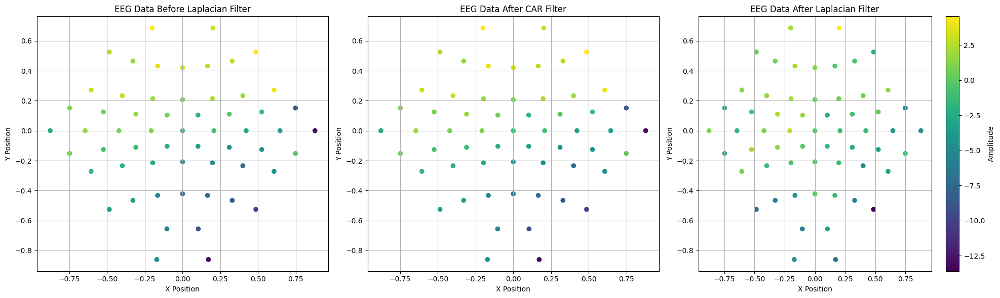

In [ ]:
amplitude_scatter_plot(EEG_beta, EEG_beta_car, EEG_beta_laplacian)

### 4.4 Apply and Plot t-SNE:

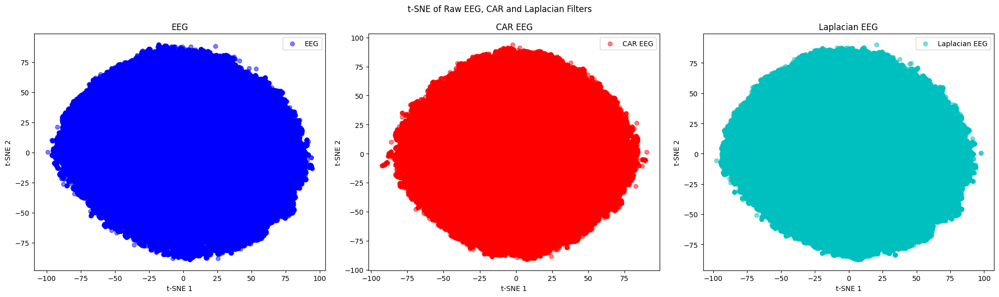

In [ ]:
tsne_mu_beta = apply_tsne(EEG_mu_beta)
tsne_mu_beta_car = apply_tsne(EEG_mu_beta_car)
tsne_mu_beta_laplacian = apply_tsne(EEG_mu_beta_laplacian)

plot_tsne(tsne_mu_beta, tsne_mu_beta_car, tsne_mu_beta_laplacian, 't-SNE of Raw EEG, CAR and Laplacian Filters')

## 5. Fearture Extraction:


### 5.1. Data Prepration:

#### 5.1.1. Choosing Data:

we can simply use data from the filter that covers both bands (EEG_mu_beta).

Moreover, we should choose which spatial filter we are working with.

The following part involves using car-filtered data for the whole band.

#### 5.1.2. 3D Reshape and Transpose:

In [ ]:
window_size = 800

EEG_3D_mu_beta = np.array([EEG_mu_beta[start:start + window_size, :] for start in window_pos])
EEG_3D_mu_beta_T = EEG_3D_mu_beta.transpose(0,2,1)

EEG_3D_mu_beta_car = np.array([EEG_mu_beta_car[start:start + window_size, :] for start in window_pos])
EEG_3D_mu_beta_car_T = EEG_3D_mu_beta_car.transpose(0,2,1)

EEG_3D_mu_beta_laplacian = np.array([EEG_mu_beta_laplacian[start:start + window_size, :] for start in window_pos])
EEG_3D_mu_beta_laplacian_T = EEG_3D_mu_beta_laplacian.transpose(0,2,1)

print(EEG_mu_beta_car.shape)
print(EEG_3D_mu_beta_car.shape)
print(EEG_3D_mu_beta_car_T.shape)

(190594, 59)
(200, 800, 59)
(200, 59, 800)


#### 5.1.3. Train & Test split:

In [ ]:
from sklearn.model_selection import train_test_split

EEG_3D_mu_beta_T_train, EEG_3D_mu_beta_T_test, y_mu_beta_train, y_mu_beta_test = train_test_split(EEG_3D_mu_beta_T, window_label, test_size=0.25, stratify=window_label, random_state=30)
print(EEG_3D_mu_beta_T_train.shape)

EEG_3D_mu_beta_car_T_train, EEG_3D_mu_beta_car_T_test, y_mu_beta_car_train, y_mu_beta_car_test = train_test_split(EEG_3D_mu_beta_car_T, window_label, test_size=0.25, stratify=window_label, random_state=30)
print(EEG_3D_mu_beta_car_T_train.shape)

EEG_3D_mu_beta_laplacian_T_train, EEG_3D_mu_beta_laplacian_T_test, y_mu_beta_laplacian_train, y_mu_beta_laplacian_test = train_test_split(EEG_3D_mu_beta_laplacian_T, window_label, test_size=0.25, stratify=window_label, random_state=30)
print(EEG_3D_mu_beta_laplacian_T_train.shape)

(150, 59, 800)
(150, 59, 800)
(150, 59, 800)


### 5.2. Install mne:

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
pip install mne

### 5.3. CSP:


#### Apply CSP:

In [ ]:
from mne.decoding import CSP

csp58 = CSP(n_components=58, reg='ledoit_wolf', log=True, cov_est='epoch')

EEG_3D_mu_beta_T_train_csp58 = csp58.fit_transform(EEG_3D_mu_beta_T_train, y_mu_beta_train)
EEG_3D_mu_beta_T_test_csp58 = csp58.transform(EEG_3D_mu_beta_T_test)

Computing rank from data with rank=None
    Using tolerance 2.3e+02 (2.2e-16 eps * 59 dim * 1.8e+16  max singular value)
    Estimated rank (data): 59
    data: rank 59 computed from 59 data channels with 0 projectors
Reducing data rank from 59 -> 59
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance usi

In [ ]:
csp58 = CSP(n_components=58, reg='ledoit_wolf', log=True, cov_est='epoch')

EEG_3D_mu_beta_car_T_train_csp58 = csp58.fit_transform(EEG_3D_mu_beta_car_T_train, y_mu_beta_car_train)
EEG_3D_mu_beta_car_T_test_csp58 = csp58.transform(EEG_3D_mu_beta_car_T_test)

Computing rank from data with rank=None
    Using tolerance 1.3e+02 (2.2e-16 eps * 59 dim * 1e+16  max singular value)
    Estimated rank (data): 58
    data: rank 58 computed from 59 data channels with 0 projectors
    Setting small data eigenvalues to zero (without PCA)
Reducing data rank from 59 -> 58
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance usi

In [ ]:
csp58 = CSP(n_components=58, reg='ledoit_wolf', log=True, cov_est='epoch')

EEG_3D_mu_beta_laplacian_T_train_csp58 = csp58.fit_transform(EEG_3D_mu_beta_laplacian_T_train, y_mu_beta_laplacian_train)
EEG_3D_mu_beta_laplacian_T_test_csp58 = csp58.transform(EEG_3D_mu_beta_laplacian_T_test)

Computing rank from data with rank=None
    Using tolerance 2.3e+02 (2.2e-16 eps * 59 dim * 1.8e+16  max singular value)
    Estimated rank (data): 59
    data: rank 59 computed from 59 data channels with 0 projectors
Reducing data rank from 59 -> 59
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance usi

In [ ]:
csp2_T = CSP(n_components=2, reg='ledoit_wolf', log=True, cov_est='epoch')

EEG_3D_mu_beta_car_csp2 = csp2_T.fit_transform(EEG_3D_mu_beta_car, window_label)

Computing rank from data with rank=None
    Using tolerance 6e+02 (2.2e-16 eps * 800 dim * 3.4e+15  max singular value)
    Estimated rank (data): 792
    data: rank 792 computed from 800 data channels with 0 projectors
    Setting small data eigenvalues to zero (without PCA)
Reducing data rank from 800 -> 792
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covarian

In [ ]:
csp2 = CSP(n_components=2, reg='ledoit_wolf', log=True, cov_est='epoch')

EEG_3D_mu_beta_car_T_csp2 = csp2.fit_transform(EEG_3D_mu_beta_car_T, window_label)

Computing rank from data with rank=None
    Using tolerance 1.5e+02 (2.2e-16 eps * 59 dim * 1.2e+16  max singular value)
    Estimated rank (data): 58
    data: rank 58 computed from 59 data channels with 0 projectors
    Setting small data eigenvalues to zero (without PCA)
Reducing data rank from 59 -> 58
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance u

#### Concatenate Results:

In [ ]:
EEG_3D_mu_beta_T_csp58 = np.concatenate((EEG_3D_mu_beta_T_train_csp58, EEG_3D_mu_beta_T_test_csp58), axis=0)
train_test_labels = np.concatenate((y_mu_beta_train, y_mu_beta_test), axis=0)
print("EEG CSP feature Shape",EEG_3D_mu_beta_T_csp58.shape)

EEG CSP feature Shape (200, 58)


In [ ]:
EEG_3D_mu_beta_car_T_csp58 = np.concatenate((EEG_3D_mu_beta_car_T_train_csp58, EEG_3D_mu_beta_car_T_test_csp58), axis=0)
car_train_test_labels = np.concatenate((y_mu_beta_car_train, y_mu_beta_car_test), axis=0)
print("EEG CSP feature Shape",EEG_3D_mu_beta_car_T_csp58.shape)

EEG CSP feature Shape (200, 58)


In [ ]:
EEG_3D_mu_beta_laplacian_T_csp58 = np.concatenate((EEG_3D_mu_beta_laplacian_T_train_csp58, EEG_3D_mu_beta_laplacian_T_test_csp58), axis=0)
laplacian_train_test_labels = np.concatenate((y_mu_beta_laplacian_train, y_mu_beta_laplacian_test), axis=0)
print("EEG CSP feature Shape",EEG_3D_mu_beta_laplacian_T_csp58.shape)

EEG CSP feature Shape (200, 58)


#### Plot CSP:

##### plot 2 first components of CSP

In [ ]:
import matplotlib.pyplot as plt
def plot_csp(csp_features, labels , title ):
  plt.figure(figsize=(8, 6))
  n_components = EEG_3D_mu_beta_car_T_csp58.shape[1]

  if n_components == 1:
      plt.scatter(csp_features[:, 0], np.zeros_like(csp_features[:, 0]), c=labels, cmap='viridis', edgecolor='k')
      plt.xlabel('CSP Component 1')
      plt.yticks([])
  else:
      plt.scatter(csp_features[:, 0], csp_features[:, 1], c=labels, cmap='viridis', edgecolor='k')
      plt.xlabel('CSP Component 1')
      plt.ylabel('CSP Component 2')

  plt.title('CSP Features ' + title)
  plt.colorbar(label='Class Label')
  plt.show()

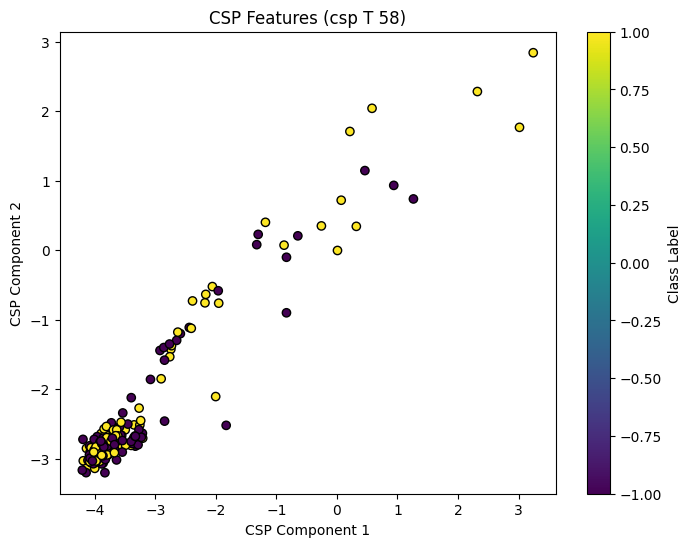

In [ ]:
plot_csp(EEG_3D_mu_beta_car_T_csp58 ,train_test_labels, "(csp T 58)")

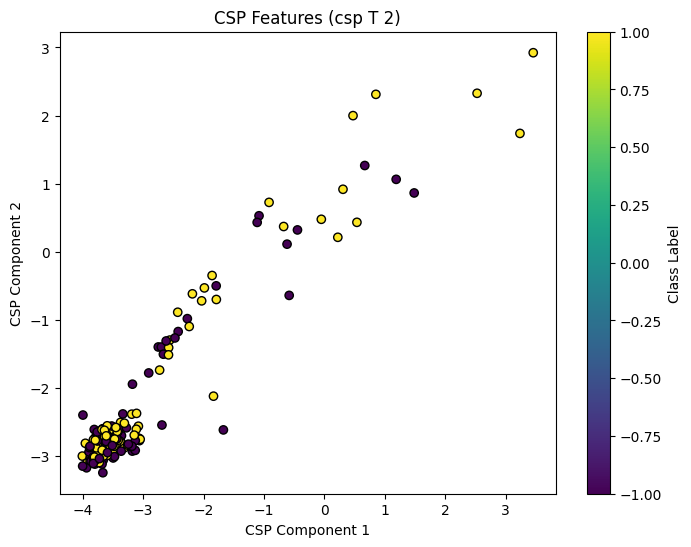

In [ ]:
plot_csp(EEG_3D_mu_beta_car_T_csp2 ,window_label, "(csp T 2)")

##### plot 2 first components of CSP without Transposition:

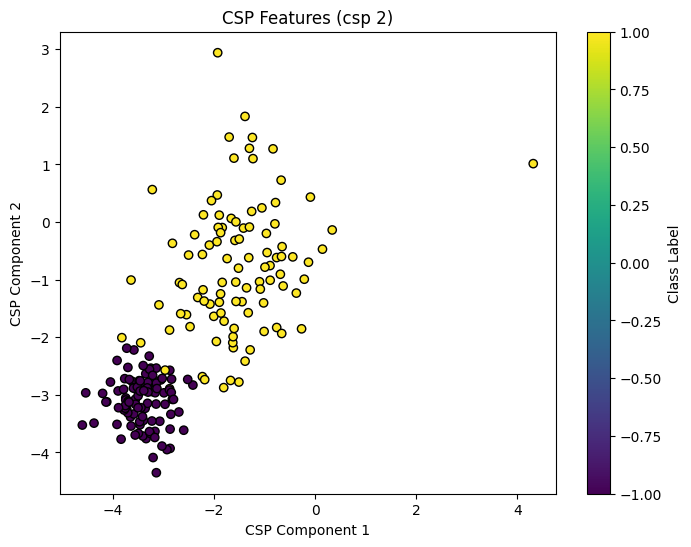

In [ ]:
plot_csp(EEG_3D_mu_beta_car_csp2 ,window_label, "(csp 2)")

##### plot using PCA

In [ ]:
from sklearn.decomposition import PCA

def plot_csp_using_pca(EEG, labels, text):

  pca = PCA(n_components=2)
  reduced_features = pca.fit_transform(EEG)

  plt.figure(figsize=(8, 6))
  scatter = plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=labels, cmap='viridis', alpha=0.7)
  plt.title('PCA of CSP Features'+ text)
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  plt.colorbar(scatter, label='Label')
  plt.show()


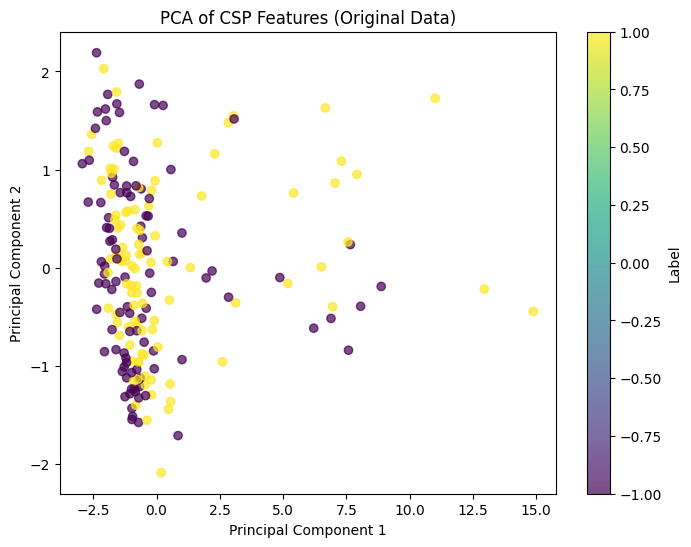

In [ ]:
plot_csp_using_pca(EEG_3D_mu_beta_T_csp58, train_test_labels, " (Original Data)")

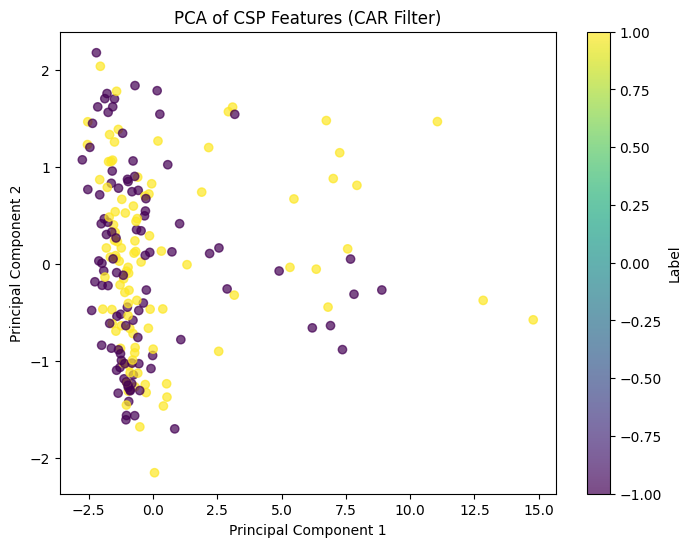

In [ ]:
plot_csp_using_pca(EEG_3D_mu_beta_car_T_csp58, car_train_test_labels, " (CAR Filter)")

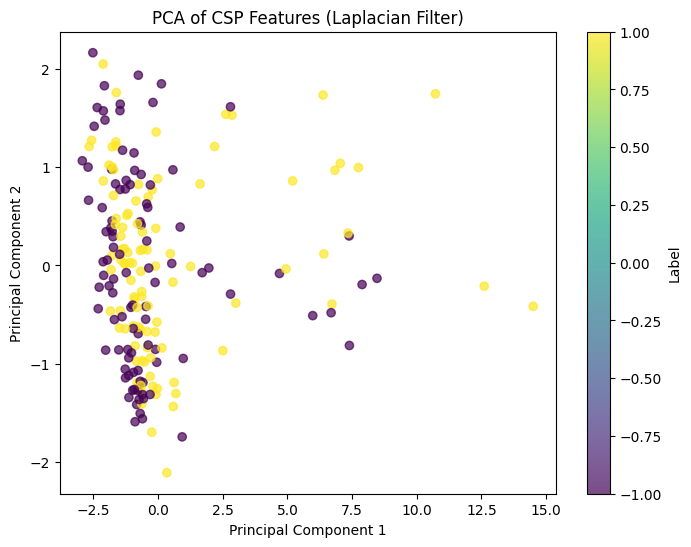

In [ ]:
plot_csp_using_pca(EEG_3D_mu_beta_laplacian_T_csp58, laplacian_train_test_labels, " (Laplacian Filter)")

As we can see projection of original data, CAR and Laplacian filter are very similar.

##### plot using TSNE

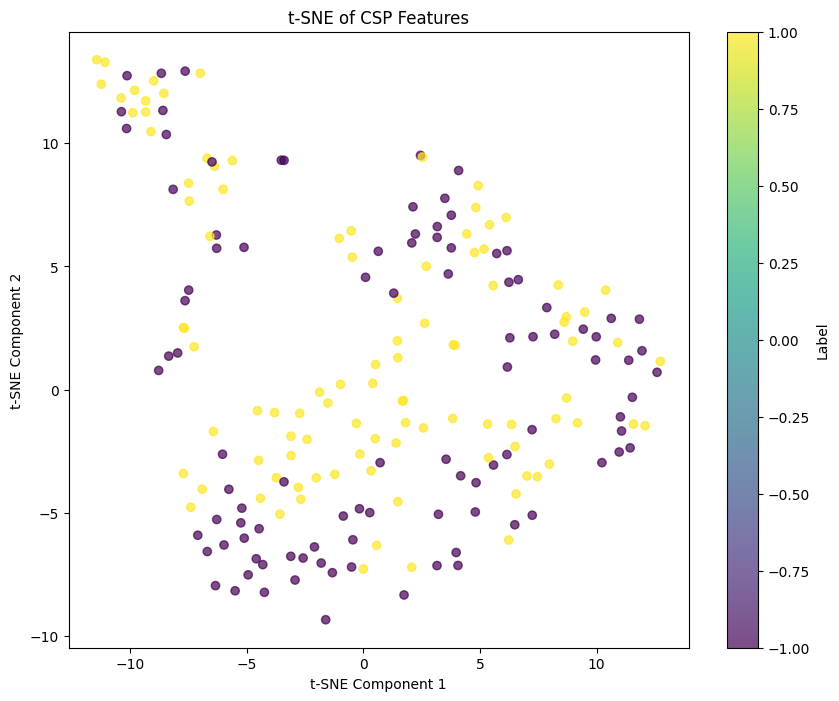

In [ ]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
reduced_features_tsne = tsne.fit_transform(EEG_3D_mu_beta_car_T_csp58)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(reduced_features_tsne[:, 0], reduced_features_tsne[:, 1], c=train_test_labels, cmap='viridis', alpha=0.7)
plt.title('t-SNE of CSP Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(scatter, label='Label')
plt.show()


### 5.4. PCA:

#### 5.4.1. PCA after CSP:

#####Find Best n-component:

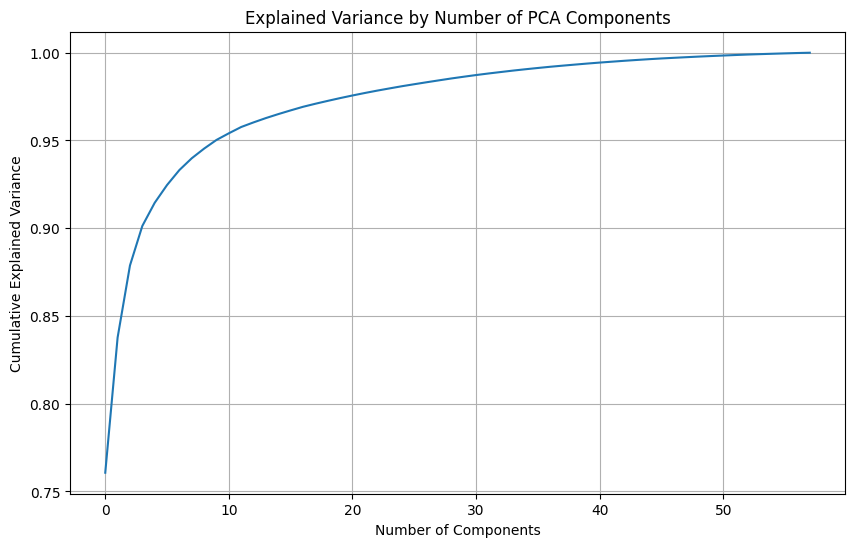

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(EEG_3D_mu_beta_car_T_train_csp58)

plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Number of PCA Components')
plt.grid(True)
plt.show()


In [ ]:
desired_variance = 0.95
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
n_components = np.argmax(cumulative_variance >= desired_variance) + 1
print(f'Number of components to explain {desired_variance*100}% variance: {n_components}')


Number of components to explain 95.0% variance: 10


##### Apply PCA:

In [ ]:
pca = PCA(n_components=10)
EEG_3D_mu_beta_car_T_train_csp58_pca10 = pca.fit_transform(EEG_3D_mu_beta_car_T_train_csp58)
EEG_3D_mu_beta_car_T_test_csp58_pca10 =  pca.transform(EEG_3D_mu_beta_car_T_test_csp58)
print("train set shape:",EEG_3D_mu_beta_car_T_train_csp58_pca10.shape)
print("test set shape:",EEG_3D_mu_beta_car_T_test_csp58_pca10.shape)

train set shape: (150, 10)
test set shape: (50, 10)


#### 5.4.2 PCA on orginal data:

##### Find Best n-component:

(200, 47200)


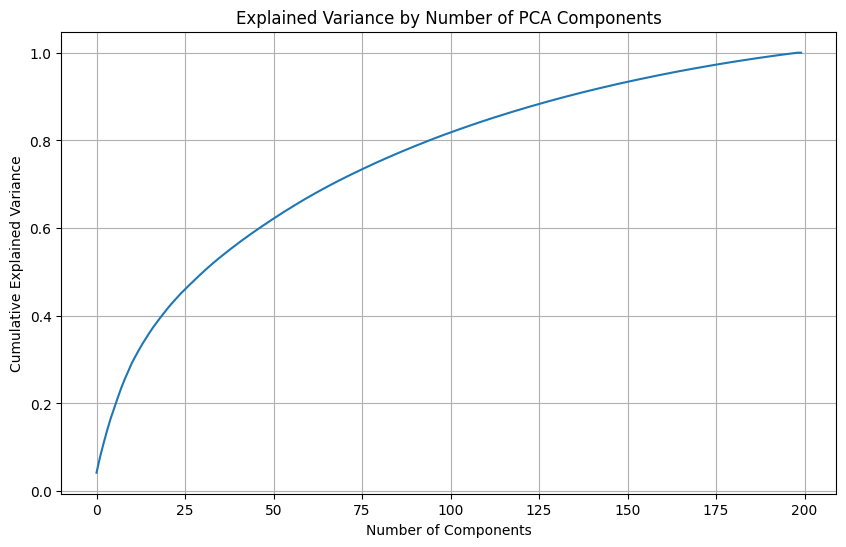

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

n_trials, n_channels , n_samples= EEG_3D_mu_beta_car.shape
EEG_3D_mu_beta_car_reshaped = EEG_3D_mu_beta_car.reshape(n_trials, -1)
print(EEG_3D_mu_beta_car_reshaped.shape)

pca = PCA()
pca.fit(EEG_3D_mu_beta_car_reshaped)

plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Number of PCA Components')
plt.grid(True)
plt.show()


In [ ]:
desired_variance = 0.95
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
n_components = np.argmax(cumulative_variance >= desired_variance) + 1
print(f'Number of components to explain {desired_variance*100}% variance: {n_components}')


Number of components to explain 95.0% variance: 161


##### Apply PCA:

best n-compnent

In [ ]:
n_trials, n_channels , n_samples= EEG_3D_mu_beta_car.shape
EEG_3D_mu_beta_car_reshaped = EEG_3D_mu_beta_car.reshape(n_trials, -1)
print(EEG_3D_mu_beta_car_reshaped.shape)

n_components = 160

pca = PCA(n_components=n_components)
EEG_3D_mu_beta_car_pca160 = pca.fit_transform(EEG_3D_mu_beta_car_reshaped)

print(EEG_3D_mu_beta_car_pca160.shape)

(200, 47200)
(200, 160)


n-component = 2

In [ ]:
n_components = min(EEG_3D_mu_beta_car_reshaped.shape[1], 2)

pca = PCA(n_components=n_components)
EEG_3D_mu_beta_car_pca2 = pca.fit_transform(EEG_3D_mu_beta_car_reshaped)

print(EEG_3D_mu_beta_car_pca2.shape)

(200, 2)


#### 5.4.3Plot PCA:


In [ ]:
import numpy as np
from sklearn.decomposition import PCA
def plot_pca(pca_features, labels, title) :
  plt.figure(figsize=(8, 6))

  if n_components == 1:
      plt.scatter(pca_features[:, 0], np.zeros_like(pca_features[:, 0]), c=labels, cmap='viridis', edgecolor='k')
      plt.xlabel('Principal Component 1')
      plt.yticks([])
  else:
      plt.scatter(pca_features[:, 0], pca_features[:, 1], c=labels, cmap='viridis', edgecolor='k')
      plt.xlabel('Principal Component 1')
      plt.ylabel('Principal Component 2')

  plt.title(title)
  plt.colorbar(label='Class Label')
  plt.show()

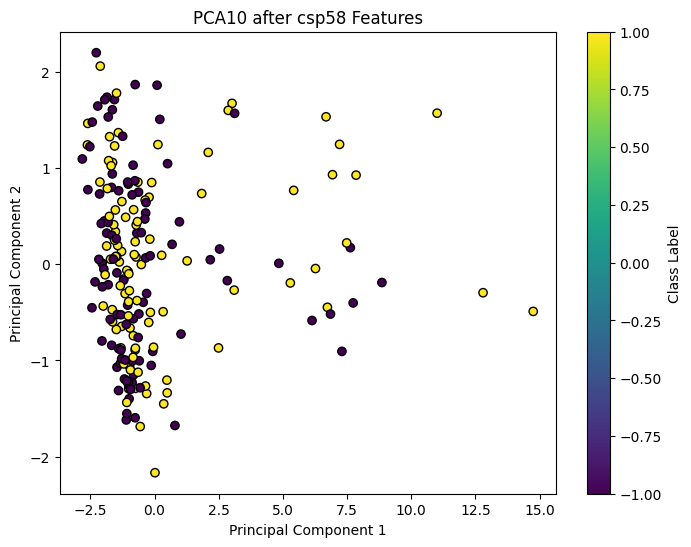

In [ ]:
EEG_3D_mu_beta_car_T_train_test_csp58_pca10 = np.concatenate((EEG_3D_mu_beta_car_T_train_csp58_pca10, EEG_3D_mu_beta_car_T_test_csp58_pca10), axis=0)
car_train_test_labels = np.concatenate((y_mu_beta_car_train, y_mu_beta_car_test), axis=0)
plot_pca(EEG_3D_mu_beta_car_T_train_test_csp58_pca10,car_train_test_labels,'PCA10 after csp58 Features')

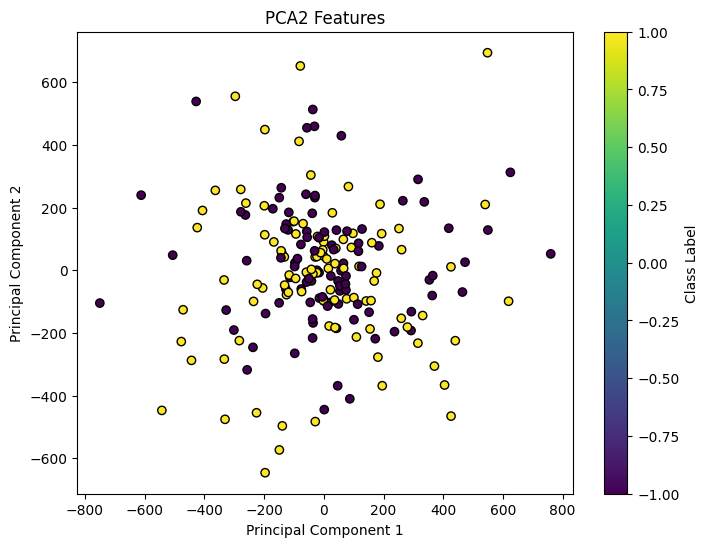

In [ ]:

plot_pca(EEG_3D_mu_beta_car_pca2,window_label,'PCA2 Features')

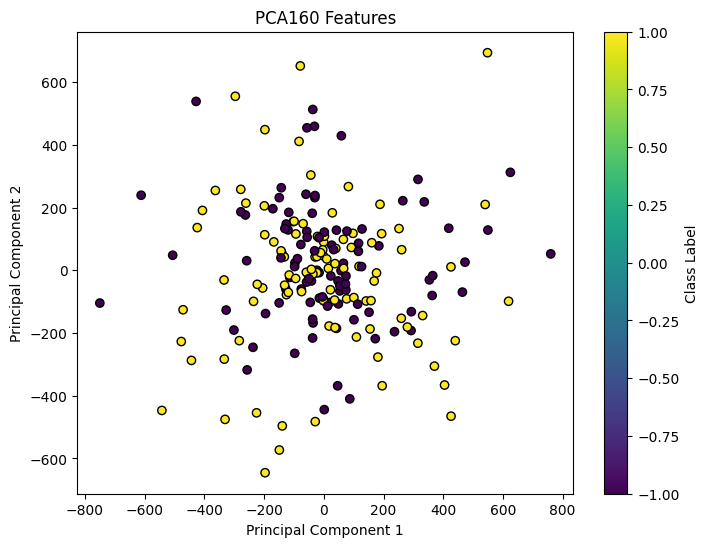

In [ ]:
plot_pca(EEG_3D_mu_beta_car_pca160,window_label,'PCA160 Features')

### 5.5. LDA:

#### 5.5.1. LDA after CSP:

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

n_classes = len(np.unique(window_label))
n_features = EEG_3D_mu_beta_car_T_train_csp58.shape[1]
n_components = min(n_features, n_classes - 1)
lda = LDA(n_components=n_components)
EEG_3D_mu_beta_car_T_train_csp58_lda = lda.fit_transform(EEG_3D_mu_beta_car_T_train_csp58, y_mu_beta_car_train)
EEG_3D_mu_beta_car_T_test_csp58_lda = lda.transform(EEG_3D_mu_beta_car_T_test_csp58)
print(EEG_3D_mu_beta_car_T_train_csp58_lda.shape)

(150, 1)


#### 5.5.2. LDA on original data:

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

n_trials, n_samples, n_channels = EEG_3D_mu_beta_car.shape
EEG_3D_mu_beta_car_reshaped = EEG_3D_mu_beta_car.reshape(n_trials, -1)
n_classes = len(np.unique(window_label))
n_features = EEG_3D_mu_beta_car_reshaped.shape[1]
n_components = min(n_features, n_classes - 1)
lda = LDA(n_components=n_components)
EEG_3D_mu_beta_car_lda = lda.fit_transform(EEG_3D_mu_beta_car_reshaped, window_label)

print(EEG_3D_mu_beta_car_lda.shape)

(200, 1)


#### 5.5.3. Plot LDA:

In [ ]:
def plot_lda(pca_features, labels, title):
  plt.figure(figsize=(8, 6))

  if n_components == 1:
      plt.scatter(pca_features[:, 0], np.zeros_like(pca_features[:, 0]), c=labels, cmap='viridis', edgecolor='k')
      plt.xlabel('Linear Discriminant 1')
      plt.yticks([])
  else:
      plt.scatter(lda_features[:, 0], pca_features[:, 1], c=labels, cmap='viridis', edgecolor='k')
      plt.xlabel('Linear Discriminant 1')
      plt.ylabel('Linear Discriminant 2')

  plt.title('LDA Features'+ title)
  plt.colorbar(label='Class Label')
  plt.show()

In [ ]:
EEG_3D_mu_beta_car_T_csp58_lda = np.concatenate((EEG_3D_mu_beta_car_T_train_csp58_lda, EEG_3D_mu_beta_car_T_test_csp58_lda), axis=0)
car_train_test_labels = np.concatenate((y_mu_beta_car_train, y_mu_beta_car_test), axis=0)
print("EEG LDA feature Shape",EEG_3D_mu_beta_car_T_csp58_lda.shape)


EEG LDA feature Shape (200, 1)


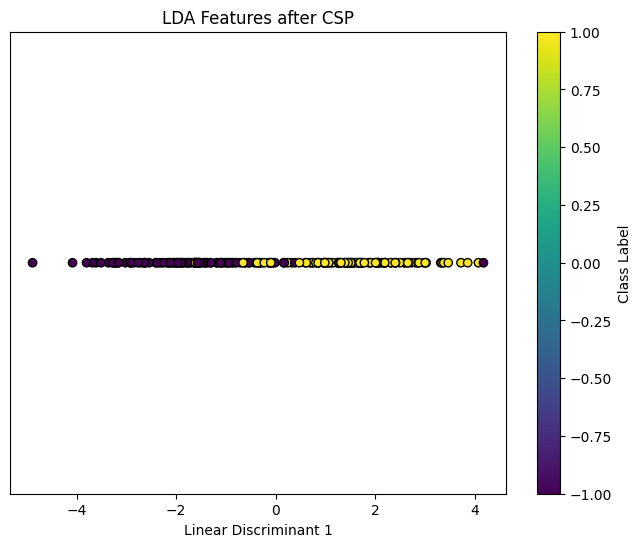

In [ ]:
plot_lda(EEG_3D_mu_beta_car_T_csp58_lda,car_train_test_labels,' after CSP')

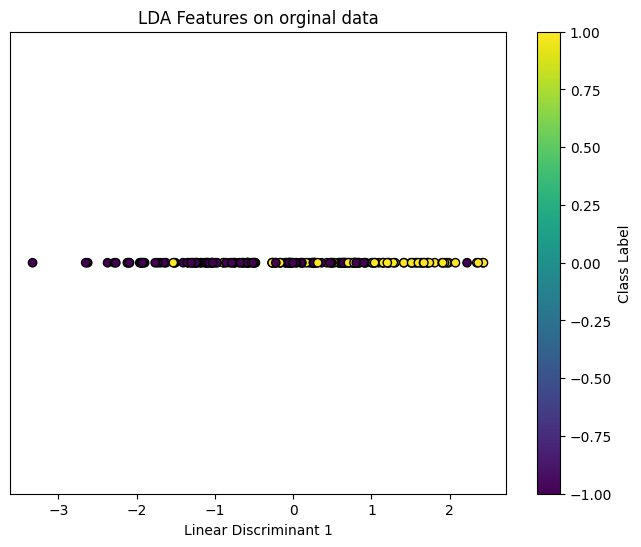

In [ ]:
plot_lda(EEG_3D_mu_beta_car_lda,window_label,' on orginal data')

## 6. Classification:

### 6.1. Split train/test Data:

we splited data in feature extraction to prevent revealing information from test data in We split the data during feature extraction to prevent the disclosure of information from the test data in the features.

### 6.2. Apply 8 Classifiers:

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

def classification(X_train, y_train, X_test, y_test):
  models = {
      'Logistic Regression': LogisticRegression(),
      'Decision Tree': DecisionTreeClassifier(),
      'Random Forest': RandomForestClassifier(),
      'SVM': SVC(),
      'KNN': KNeighborsClassifier(),
      'Gradient Boosting': GradientBoostingClassifier(),
      'AdaBoost': AdaBoostClassifier(),
      'Naive Bayes': GaussianNB(),
      'MLP Neural Network': MLPClassifier()
  }

  results = {}
  for name, model in models.items():
      print()
      print(f"\033[38;5;208m{name}\033[0m")
      model.fit(X_train, y_train)
      y_pred = model.predict(X_test)
      accuracy = accuracy_score(y_test, y_pred)
      results[name] = accuracy
      print(f"\033[32mAccuracy: {accuracy:.2f}\033[0m")
      print(classification_report(y_test, y_pred))
      confusion = confusion_matrix(y_test, y_pred)
      tn, fp, fn, tp = confusion.ravel()
      specificity = tp / (tp + fn)
      print(f"\033[95mSpecificity: {specificity:.2f}\033[0m")

      plt.figure(figsize=(4, 3))
      sns.heatmap(confusion, annot=True, fmt="d", cmap="Blues", cbar=False)
      plt.xlabel("Predicted")
      plt.ylabel("Actual")
      plt.title("Confusion Matrix")
      plt.show()

      fpr, tpr, thresholds = roc_curve(y_test, y_pred)
      roc_auc = roc_auc_score(y_test, y_pred)

      plt.figure(figsize=(4, 3))
      plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
      plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
      plt.xlim([0.0, 1.0])
      plt.ylim([0.0, 1.05])
      plt.xlabel('False Positive Rate')
      plt.ylabel('True Positive Rate')
      plt.title('Receiver Operating Characteristic')
      plt.legend(loc="lower right")
      plt.show()
      plt.close()


Logistic Regression
Accuracy: 0.82
              precision    recall  f1-score   support

          -1       0.75      0.96      0.84        25
           1       0.94      0.68      0.79        25

    accuracy                           0.82        50
   macro avg       0.85      0.82      0.82        50
weighted avg       0.85      0.82      0.82        50

Specificity: 0.68


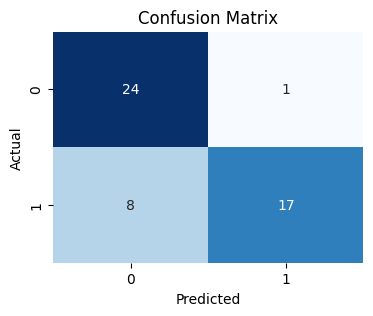

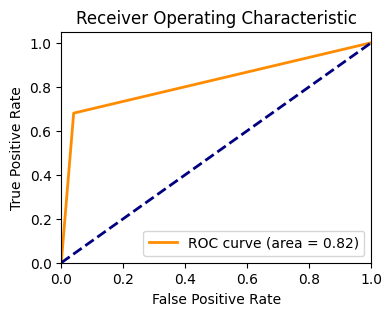


Decision Tree
Accuracy: 0.72
              precision    recall  f1-score   support

          -1       0.68      0.84      0.75        25
           1       0.79      0.60      0.68        25

    accuracy                           0.72        50
   macro avg       0.73      0.72      0.72        50
weighted avg       0.73      0.72      0.72        50

Specificity: 0.60


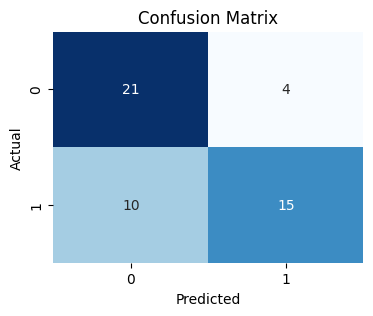

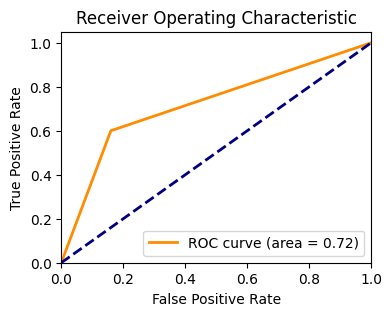


Random Forest
Accuracy: 0.80
              precision    recall  f1-score   support

          -1       0.71      1.00      0.83        25
           1       1.00      0.60      0.75        25

    accuracy                           0.80        50
   macro avg       0.86      0.80      0.79        50
weighted avg       0.86      0.80      0.79        50

Specificity: 0.60


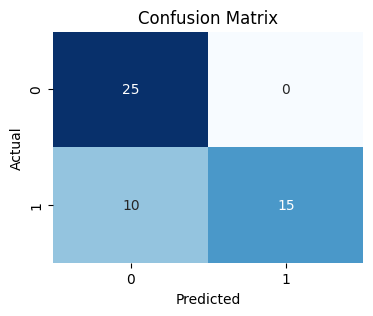

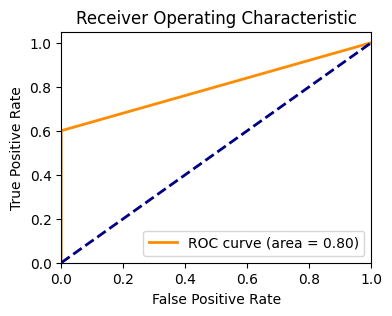


SVM
Accuracy: 0.84
              precision    recall  f1-score   support

          -1       0.79      0.92      0.85        25
           1       0.90      0.76      0.83        25

    accuracy                           0.84        50
   macro avg       0.85      0.84      0.84        50
weighted avg       0.85      0.84      0.84        50

Specificity: 0.76


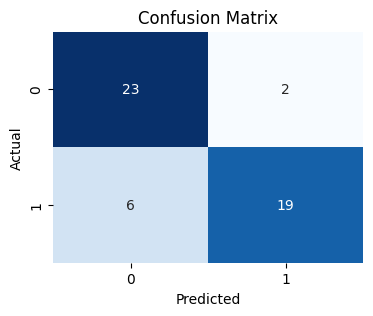

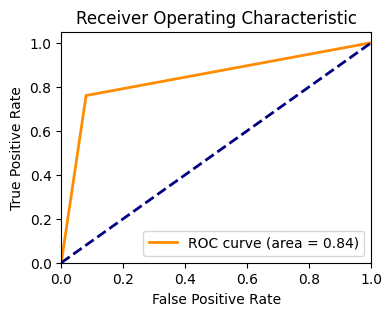


KNN
Accuracy: 0.68
              precision    recall  f1-score   support

          -1       0.64      0.84      0.72        25
           1       0.76      0.52      0.62        25

    accuracy                           0.68        50
   macro avg       0.70      0.68      0.67        50
weighted avg       0.70      0.68      0.67        50

Specificity: 0.52


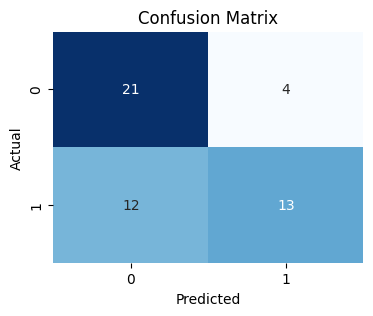

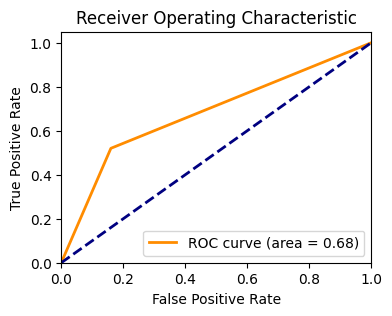


Gradient Boosting
Accuracy: 0.82
              precision    recall  f1-score   support

          -1       0.75      0.96      0.84        25
           1       0.94      0.68      0.79        25

    accuracy                           0.82        50
   macro avg       0.85      0.82      0.82        50
weighted avg       0.85      0.82      0.82        50

Specificity: 0.68


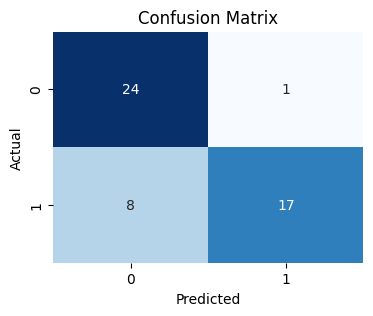

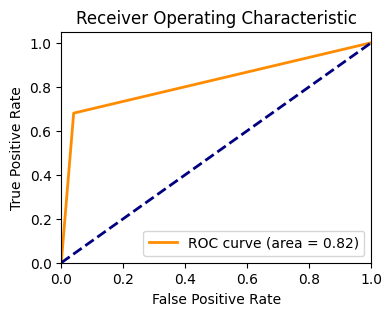


AdaBoost
Accuracy: 0.78
              precision    recall  f1-score   support

          -1       0.71      0.96      0.81        25
           1       0.94      0.60      0.73        25

    accuracy                           0.78        50
   macro avg       0.82      0.78      0.77        50
weighted avg       0.82      0.78      0.77        50

Specificity: 0.60


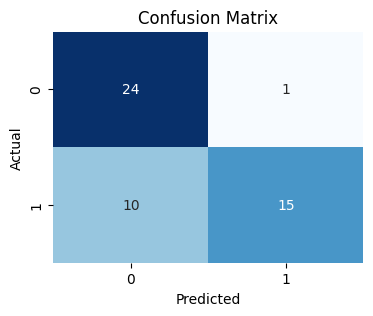

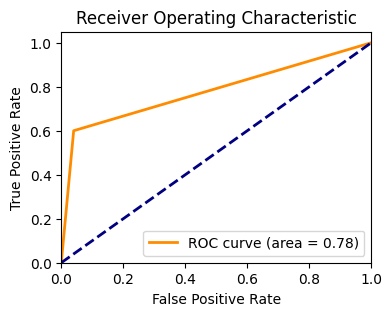


Naive Bayes
Accuracy: 0.80
              precision    recall  f1-score   support

          -1       0.73      0.96      0.83        25
           1       0.94      0.64      0.76        25

    accuracy                           0.80        50
   macro avg       0.83      0.80      0.79        50
weighted avg       0.83      0.80      0.79        50

Specificity: 0.64


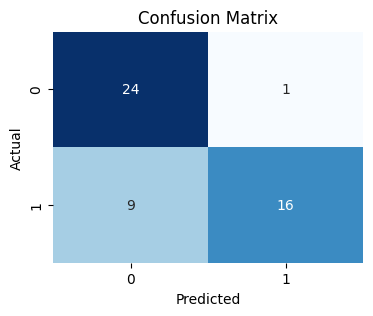

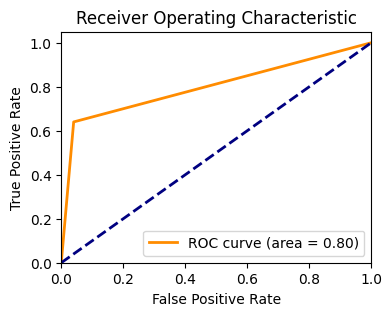


MLP Neural Network
Accuracy: 0.90
              precision    recall  f1-score   support

          -1       0.83      1.00      0.91        25
           1       1.00      0.80      0.89        25

    accuracy                           0.90        50
   macro avg       0.92      0.90      0.90        50
weighted avg       0.92      0.90      0.90        50

Specificity: 0.80


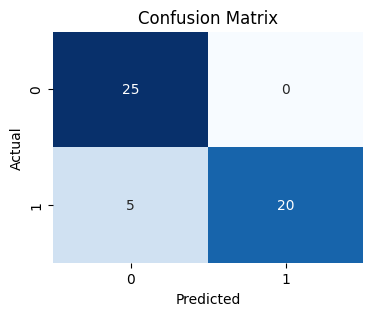

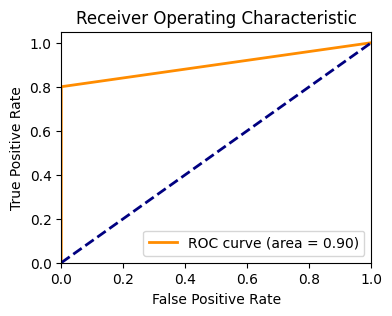

In [ ]:
classification(EEG_3D_mu_beta_car_T_train_csp58_pca10, y_mu_beta_car_train, EEG_3D_mu_beta_car_T_test_csp58_pca10, y_mu_beta_car_test)


Logistic Regression
Accuracy: 0.74
              precision    recall  f1-score   support

          -1       0.70      0.84      0.76        25
           1       0.80      0.64      0.71        25

    accuracy                           0.74        50
   macro avg       0.75      0.74      0.74        50
weighted avg       0.75      0.74      0.74        50

Specificity: 0.64


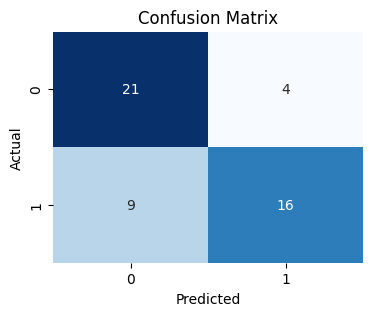

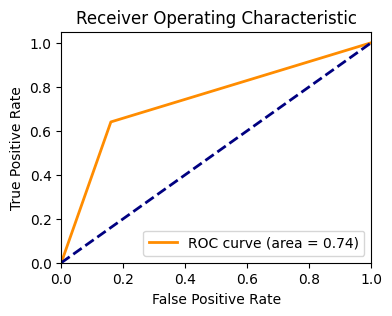


Decision Tree
Accuracy: 0.72
              precision    recall  f1-score   support

          -1       0.68      0.84      0.75        25
           1       0.79      0.60      0.68        25

    accuracy                           0.72        50
   macro avg       0.73      0.72      0.72        50
weighted avg       0.73      0.72      0.72        50

Specificity: 0.60


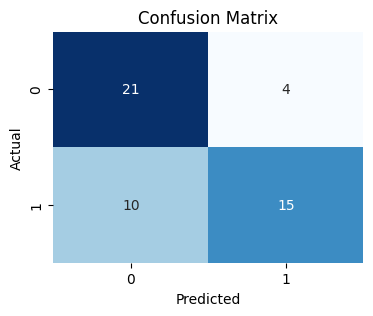

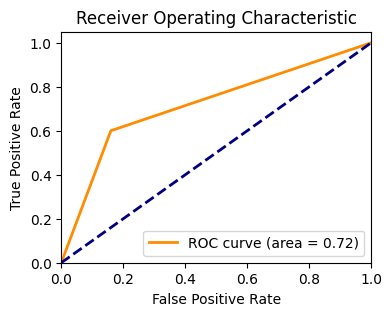


Random Forest
Accuracy: 0.72
              precision    recall  f1-score   support

          -1       0.68      0.84      0.75        25
           1       0.79      0.60      0.68        25

    accuracy                           0.72        50
   macro avg       0.73      0.72      0.72        50
weighted avg       0.73      0.72      0.72        50

Specificity: 0.60


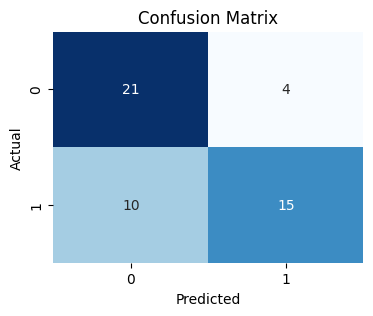

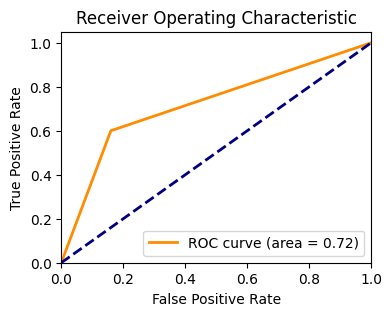


SVM
Accuracy: 0.74
              precision    recall  f1-score   support

          -1       0.70      0.84      0.76        25
           1       0.80      0.64      0.71        25

    accuracy                           0.74        50
   macro avg       0.75      0.74      0.74        50
weighted avg       0.75      0.74      0.74        50

Specificity: 0.64


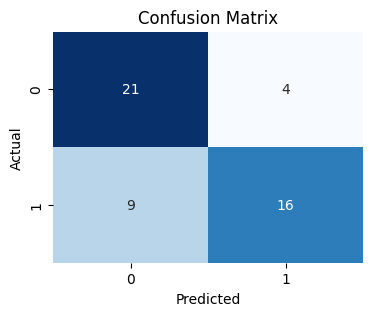

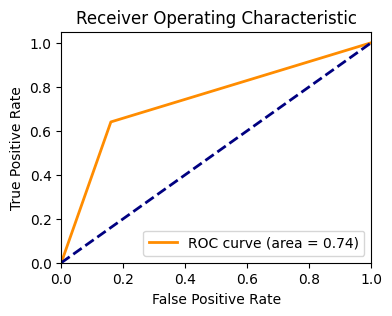


KNN
Accuracy: 0.78
              precision    recall  f1-score   support

          -1       0.72      0.92      0.81        25
           1       0.89      0.64      0.74        25

    accuracy                           0.78        50
   macro avg       0.80      0.78      0.78        50
weighted avg       0.80      0.78      0.78        50

Specificity: 0.64


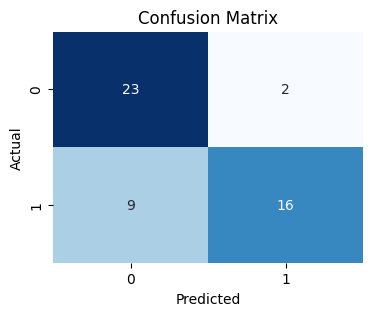

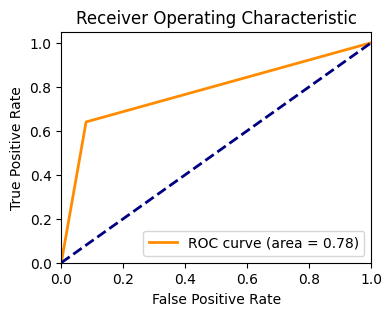


Gradient Boosting
Accuracy: 0.72
              precision    recall  f1-score   support

          -1       0.68      0.84      0.75        25
           1       0.79      0.60      0.68        25

    accuracy                           0.72        50
   macro avg       0.73      0.72      0.72        50
weighted avg       0.73      0.72      0.72        50

Specificity: 0.60


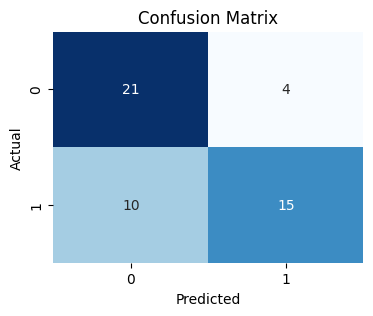

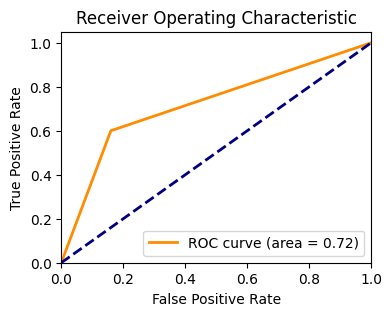


AdaBoost
Accuracy: 0.72
              precision    recall  f1-score   support

          -1       0.68      0.84      0.75        25
           1       0.79      0.60      0.68        25

    accuracy                           0.72        50
   macro avg       0.73      0.72      0.72        50
weighted avg       0.73      0.72      0.72        50

Specificity: 0.60


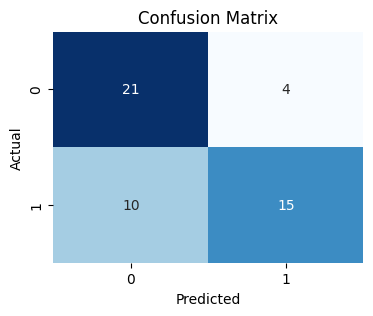

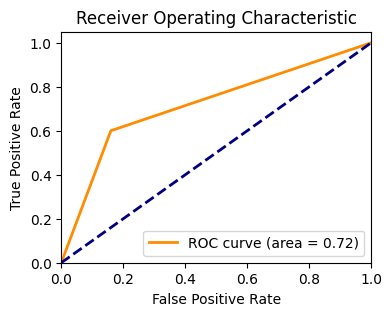


Naive Bayes
Accuracy: 0.74
              precision    recall  f1-score   support

          -1       0.70      0.84      0.76        25
           1       0.80      0.64      0.71        25

    accuracy                           0.74        50
   macro avg       0.75      0.74      0.74        50
weighted avg       0.75      0.74      0.74        50

Specificity: 0.64


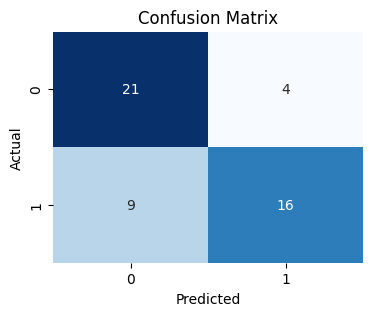

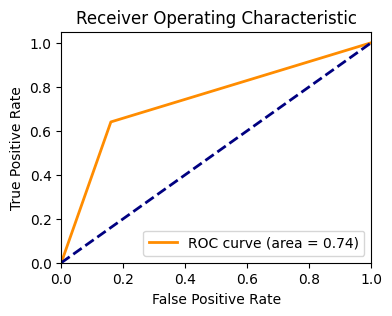


MLP Neural Network
Accuracy: 0.74
              precision    recall  f1-score   support

          -1       0.70      0.84      0.76        25
           1       0.80      0.64      0.71        25

    accuracy                           0.74        50
   macro avg       0.75      0.74      0.74        50
weighted avg       0.75      0.74      0.74        50

Specificity: 0.64


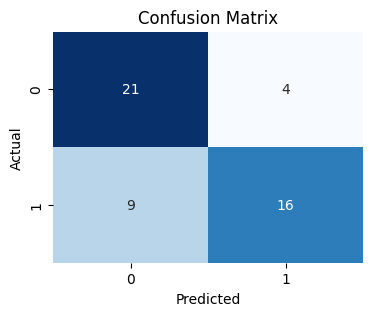

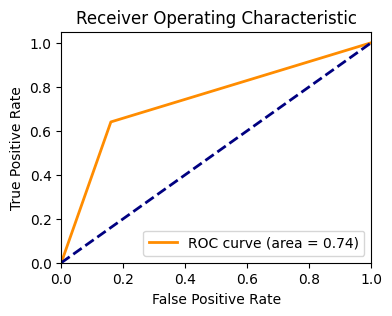

In [ ]:
classification(EEG_3D_mu_beta_car_T_train_csp58_lda, y_mu_beta_car_train, EEG_3D_mu_beta_car_T_test_csp58_lda, y_mu_beta_car_test)

### 6.3 MLP

In [ ]:
import numpy as np
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, accuracy_score

mlp = MLPClassifier(hidden_layer_sizes=(100,), max_iter=200, random_state=42)
mlp.fit(EEG_3D_mu_beta_car_T_train_csp58_pca10, y_mu_beta_car_train)
y_pred = mlp.predict(EEG_3D_mu_beta_car_T_test_csp58_pca10)

# Evaluate the model
print("Accuracy:", accuracy_score(y_mu_beta_car_test, y_pred))
print("Classification Report:\n", classification_report(y_mu_beta_car_test, y_pred))

Accuracy: 0.9
Classification Report:
               precision    recall  f1-score   support

          -1       0.86      0.96      0.91        25
           1       0.95      0.84      0.89        25

    accuracy                           0.90        50
   macro avg       0.91      0.90      0.90        50
weighted avg       0.91      0.90      0.90        50



### 6.4 Gradient Boosting

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

def gradient_boosting(X_train, y_train, X_test, y_test):

  param_grid = {
      'n_estimators': [100, 200],
      'learning_rate': [0.01, 0.1],
      'max_depth': [3,4,5],
      'min_samples_split': [6],
      'min_samples_leaf': [4],
      'subsample': [0.9],
      'max_features': ['log2']
  }

  gbc = GradientBoostingClassifier()
  grid_search = GridSearchCV(gbc, param_grid, cv=5, scoring='accuracy', verbose=2)
  grid_search.fit(X_train, y_train)

  best_params = grid_search.best_params_
  print(f'Best parameters: {best_params}')
  best_gbc = GradientBoostingClassifier(**best_params)
  best_gbc.fit(X_train, y_train)

  y_pred = best_gbc.predict(X_test)

  accuracy = accuracy_score(y_test, y_pred)
  print(f'Accuracy with best parameters: {accuracy}')
  return best_gbc

In [ ]:
best_gbc = gradient_boosting(EEG_3D_mu_beta_car_T_train_csp58_pca10, y_mu_beta_car_train, EEG_3D_mu_beta_car_T_test_csp58_pca10, y_mu_beta_car_test)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] END learning_rate=0.01, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=200, subsample=0.9; total time=   0.2s
[CV] END learni

In [ ]:
gradient_boosting(EEG_3D_mu_beta_car_T_train_csp58_lda, y_mu_beta_car_train, EEG_3D_mu_beta_car_T_test_csp58_lda, y_mu_beta_car_test)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] END learning_rate=0.01, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=200, subsample=0.9; total time=   0.2s
[CV] END learni

GradientBoostingClassifier(learning_rate=0.01, max_features='log2',
                           min_samples_leaf=4, min_samples_split=6,
                           n_estimators=200, subsample=0.9)

### 6.5 ada boost

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

def ada_boost(X_train, y_train, X_test, y_test):


  weak_classifier = GaussianNB()

  ada_boost = AdaBoostClassifier(base_estimator=weak_classifier, n_estimators=100, learning_rate=.01, random_state=42)
  ada_boost.fit(X_train, y_train)
  y_pred = ada_boost.predict(X_test)

  accuracy = accuracy_score(y_test, y_pred)
  print(f"Accuracy: {accuracy:.2f}")
ada_boost(EEG_3D_mu_beta_car_T_train_csp58_pca10, y_mu_beta_car_train, EEG_3D_mu_beta_car_T_test_csp58_pca10, y_mu_beta_car_test)

Accuracy: 0.80


In [ ]:
ada_boost(EEG_3D_mu_beta_car_T_train_csp58_lda, y_mu_beta_car_train, EEG_3D_mu_beta_car_T_test_csp58_lda, y_mu_beta_car_test)

Accuracy: 0.74


### 6.6 KNN:

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score

def KNN_classifier(X_train, y_train, X_test, y_test,k):

  param_grid = {'n_neighbors': np.arange(1, 31)}
  knn = KNeighborsClassifier()
  grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')
  grid_search.fit(X_train, y_train)
  best_k = grid_search.best_params_['n_neighbors']

  print(f'The best value of k is: {best_k}')

  best_knn = KNeighborsClassifier(n_neighbors=best_k)
  best_knn.fit(X_train, y_train)

  y_pred = best_knn.predict(X_test)

  accuracy = accuracy_score(y_test, y_pred)
  print(f'Accuracy with k={k}: {accuracy}')


In [ ]:
KNN_classifier(EEG_3D_mu_beta_car_T_train_csp58_pca10, y_mu_beta_car_train, EEG_3D_mu_beta_car_T_test_csp58_pca10, y_mu_beta_car_test,5)

The best value of k is: 24
Accuracy with k=5: 0.72


In [ ]:
KNN_classifier(EEG_3D_mu_beta_car_T_train_csp58_lda, y_mu_beta_car_train, EEG_3D_mu_beta_car_T_test_csp58_lda, y_mu_beta_car_test,5)

The best value of k is: 8
Accuracy with k=5: 0.74


## 7. Clustering:

### 7.1. Silhouette Score:

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def plot_silhouette(data, max_clusters=10):
    range_n_clusters = range(2, max_clusters + 1)
    silhouette_avg_scores = []

    for n_clusters in range_n_clusters:
        fig, ax1 = plt.subplots(1, 1)
        fig.set_size_inches(4, 3)

        clusterer = KMeans(n_clusters=n_clusters, random_state=10)
        cluster_labels = clusterer.fit_predict(data)

        silhouette_avg = silhouette_score(data, cluster_labels)
        silhouette_avg_scores.append(silhouette_avg)
        print(f"\033[95mFor n_clusters = {n_clusters}, the average silhouette_score is : {silhouette_avg}\033[0m")


        sample_silhouette_values = silhouette_samples(data, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10

        ax1.set_title(f"The silhouette plot for the various clusters for n_clusters = {n_clusters}")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])
        ax1.set_xticks(np.arange(-0.1, 1.1, 0.2))

        plt.show()

    plt.figure(figsize=(7, 5))
    plt.plot(range_n_clusters, silhouette_avg_scores, marker='o')
    plt.title("Silhouette scores for different number of clusters")
    plt.xlabel("Number of clusters")
    plt.ylabel("Average silhouette score")
    plt.show()
    print()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 2, the average silhouette_score is : 0.691736808103667


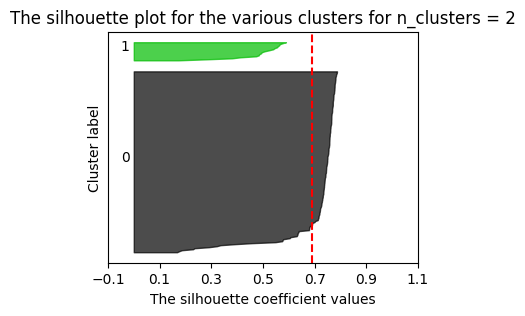

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 3, the average silhouette_score is : 0.39348677754021266


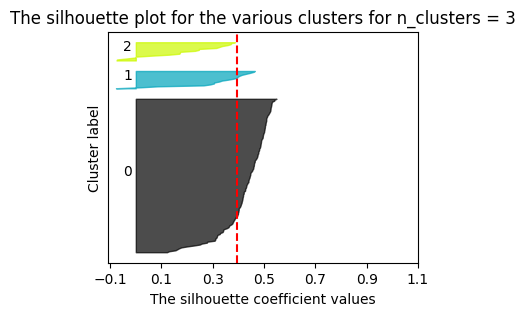

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 4, the average silhouette_score is : 0.22093159523851288


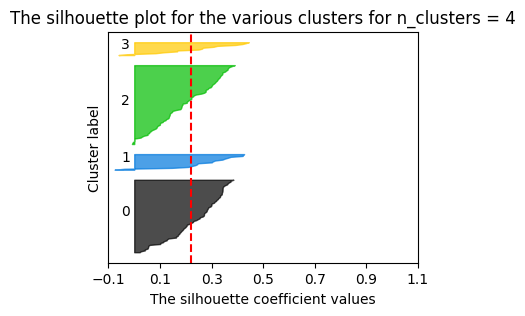

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 5, the average silhouette_score is : 0.22887689437379422


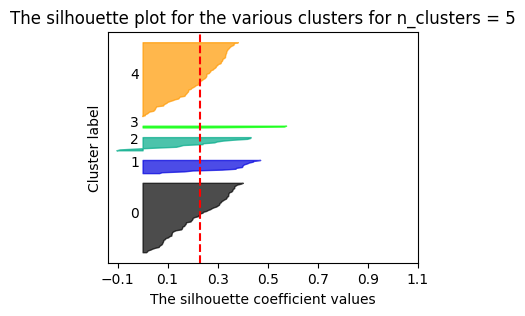

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 6, the average silhouette_score is : 0.21468453939431828


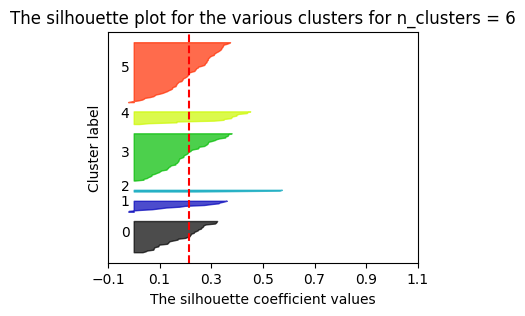

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 7, the average silhouette_score is : 0.20773688470594884


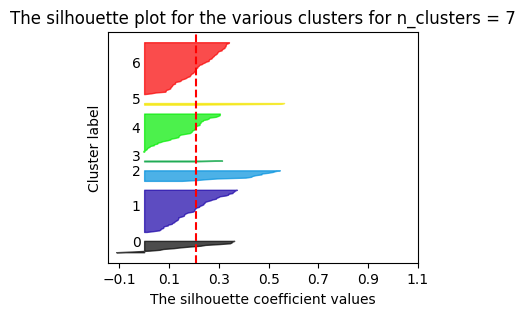

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 8, the average silhouette_score is : 0.18604360050625068


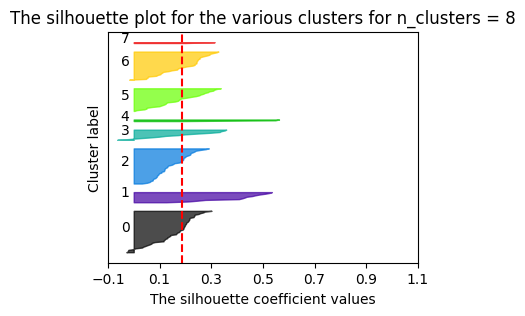

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 9, the average silhouette_score is : 0.18447659246454623


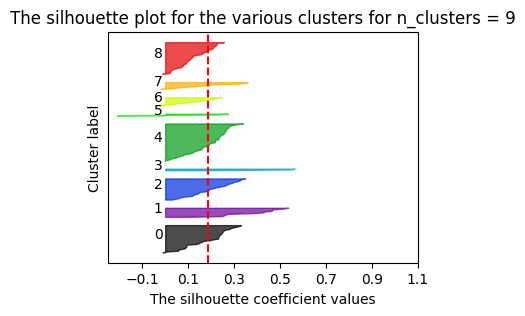

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 10, the average silhouette_score is : 0.16386959431035358


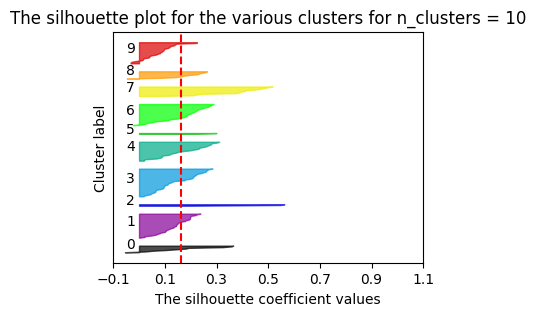

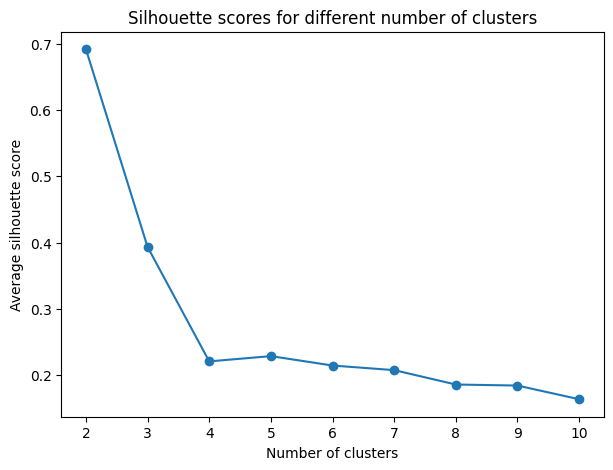

In [ ]:
plot_silhouette(EEG_3D_mu_beta_car_T_csp58)

### 7.2. K-Means:

#### K-means Functions:

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

def apply_kmeans(data, n_clusters):

    kmeans = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = kmeans.fit_predict(data)
    cluster_centers = kmeans.cluster_centers_

    return cluster_labels, cluster_centers

def plot_clusters(data, cluster_labels, cluster_centers):

    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(data)

    plt.figure(figsize=(6, 4))

    unique_labels = np.unique(cluster_labels)
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    for k, col in zip(unique_labels, colors):
        class_member_mask = (cluster_labels == k)
        xy = reduced_data[class_member_mask]
        plt.scatter(xy[:, 0], xy[:, 1], label=f'Cluster {k}', edgecolor='k', s=50)

    reduced_centers = pca.transform(cluster_centers)
    plt.scatter(reduced_centers[:, 0], reduced_centers[:, 1], marker='x', s=200, c='red', label='Centroids')

    plt.title("K-means Clustering Results")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.legend()
    plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


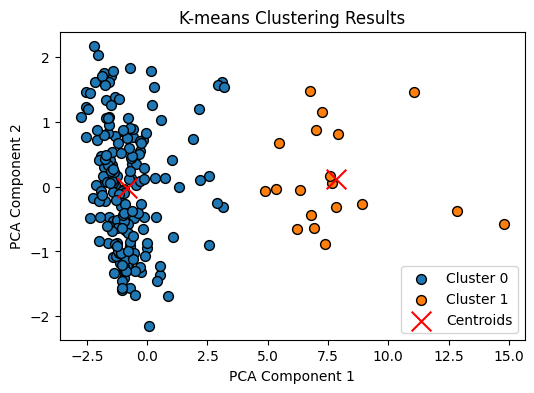

In [ ]:
n_clusters = 2
cluster_labels, cluster_centers = apply_kmeans(EEG_3D_mu_beta_car_T_csp58, n_clusters)

plot_clusters(EEG_3D_mu_beta_car_T_csp58, cluster_labels, cluster_centers)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


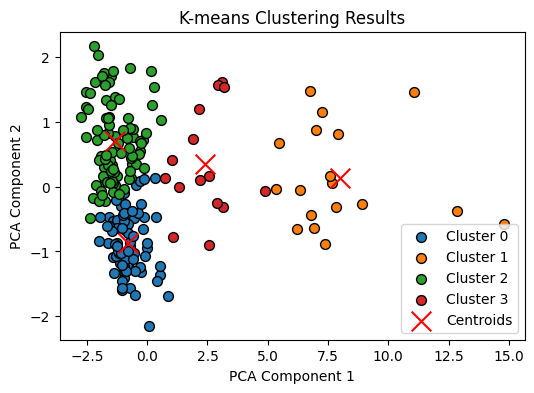

In [ ]:
n_clusters = 4
cluster_labels, cluster_centers = apply_kmeans(EEG_3D_mu_beta_car_T_csp58, n_clusters)

plot_clusters(EEG_3D_mu_beta_car_T_csp58, cluster_labels, cluster_centers)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


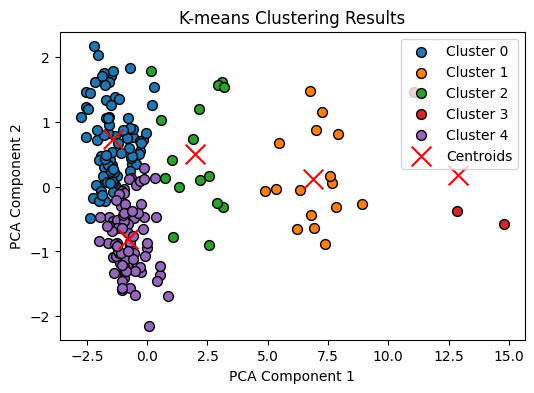

In [ ]:
n_clusters = 5
cluster_labels, cluster_centers = apply_kmeans(EEG_3D_mu_beta_car_T_csp58, n_clusters)

plot_clusters(EEG_3D_mu_beta_car_T_csp58, cluster_labels, cluster_centers)

### 7.3. DB-SCAN:

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
import matplotlib.cm as cm

def apply_dbscan(data, eps=0.5, min_samples=5):

    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    cluster_labels = dbscan.fit_predict(data)

    return cluster_labels

def plot_dbscan_clusters(data, cluster_labels):

    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(data)

    plt.figure(figsize=(7, 6))

    unique_labels = np.unique(cluster_labels)
    colors = [cm.nipy_spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
    for k, col in zip(unique_labels, colors):
        if k == -1:
            col = [0, 0, 0, 1]

        class_member_mask = (cluster_labels == k)
        xy = reduced_data[class_member_mask]
        plt.scatter(xy[:, 0], xy[:, 1], c=[col], label=f'Cluster {k}' if k != -1 else 'Noise', edgecolor='k', s=50)

    plt.title("DBSCAN Clustering Results")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.legend()
    plt.show()

####Grid Search to Find Best Parameters:

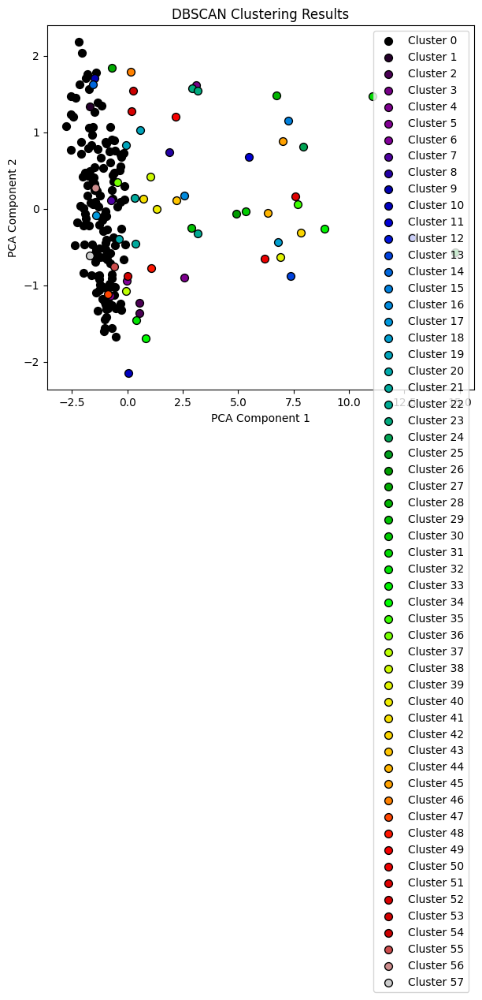

eps:  1.3
mins:  1


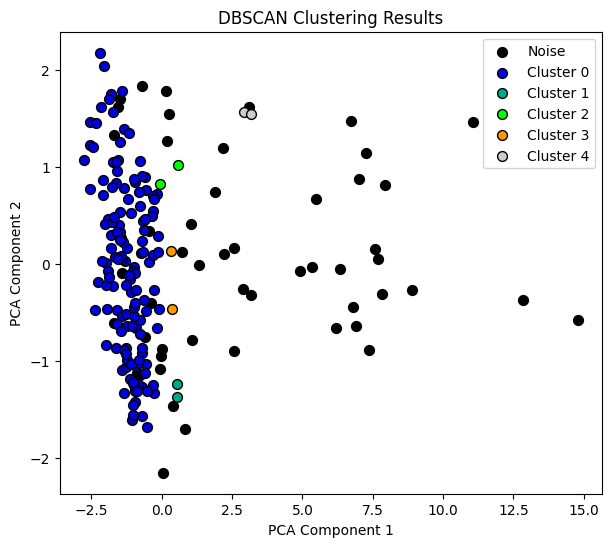

eps:  1.3
mins:  2


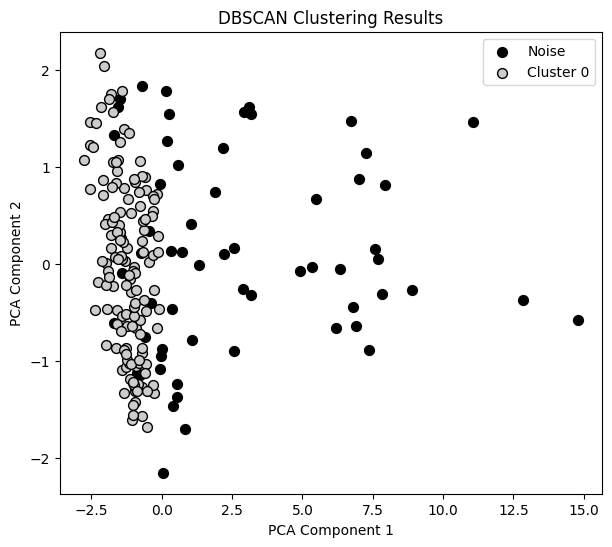

eps:  1.3
mins:  3


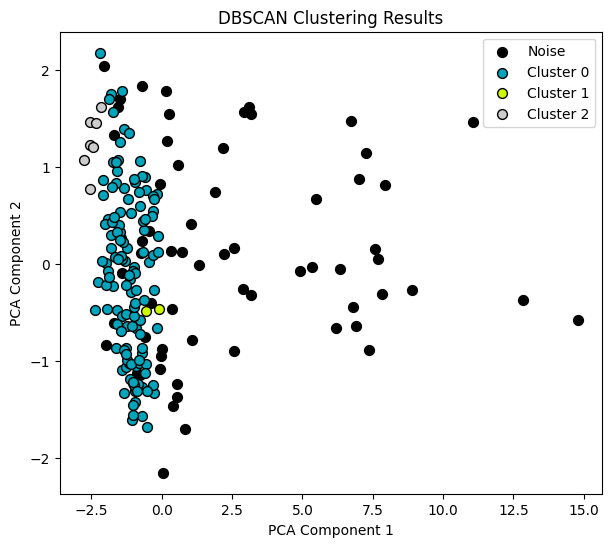

eps:  1.3
mins:  4


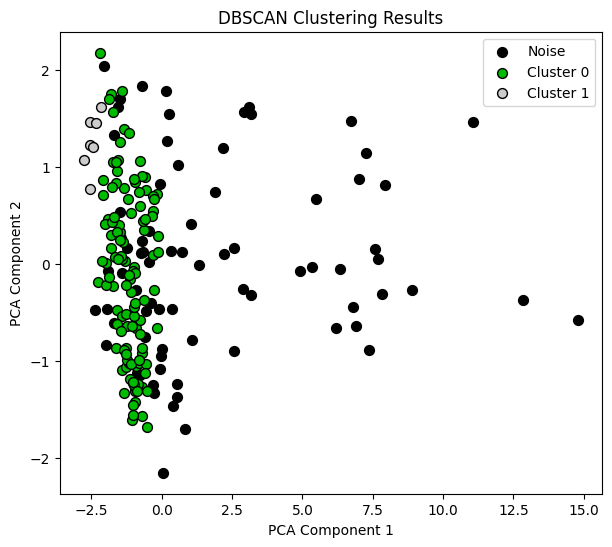

eps:  1.3
mins:  5


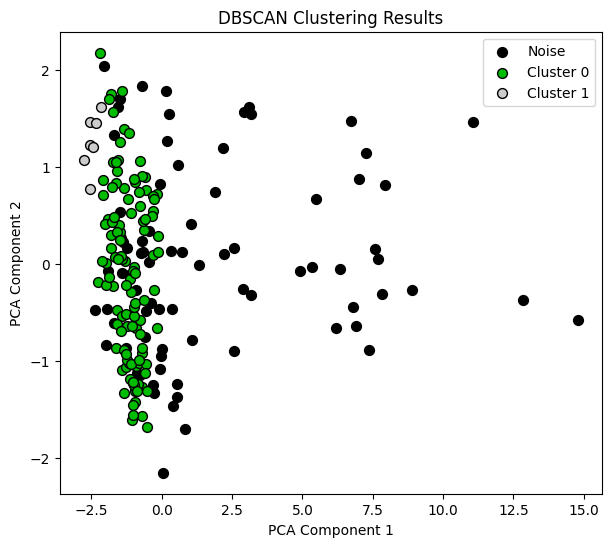

eps:  1.3
mins:  6


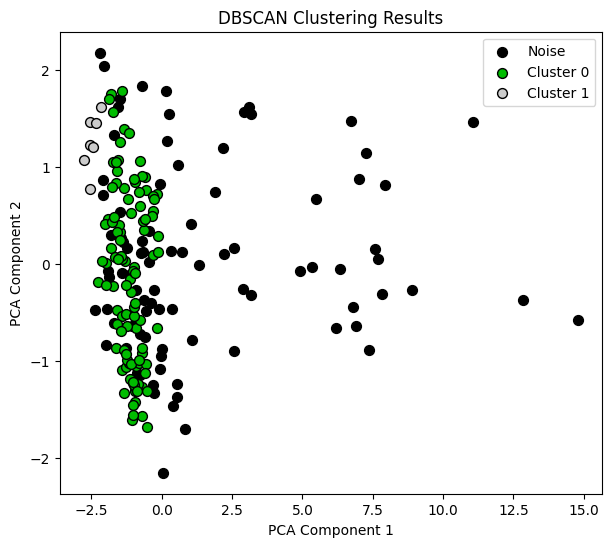

eps:  1.3
mins:  7


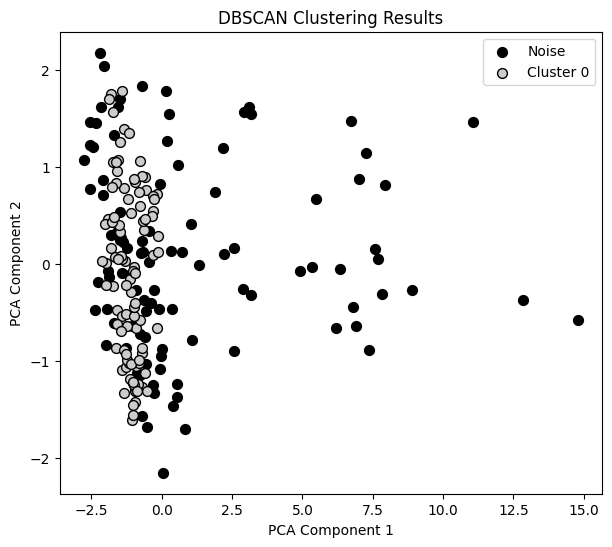

eps:  1.3
mins:  8


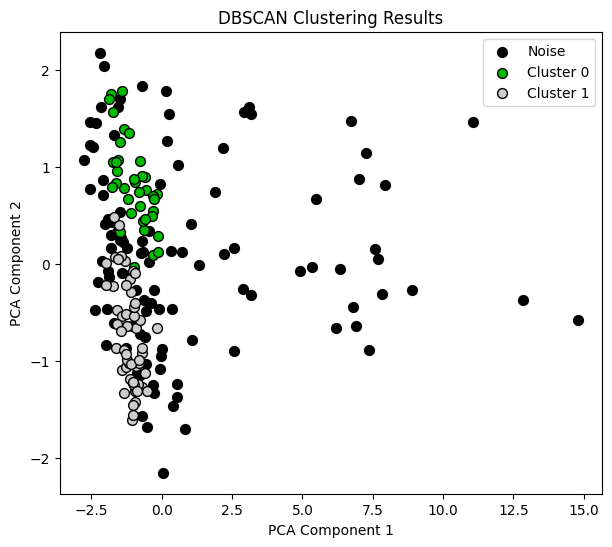

eps:  1.3
mins:  9


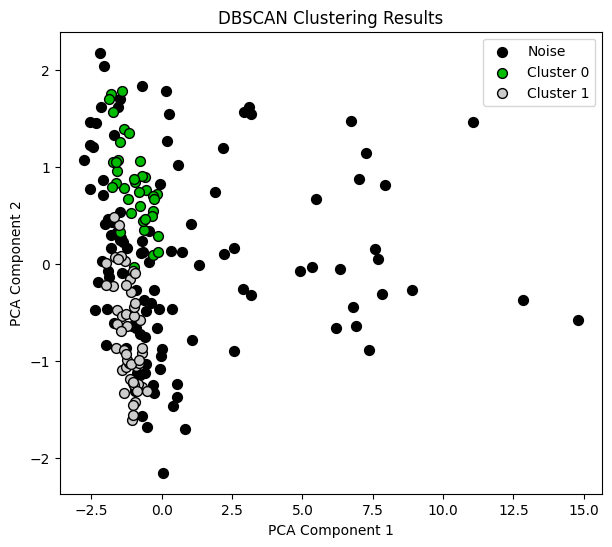

eps:  1.3
mins:  10


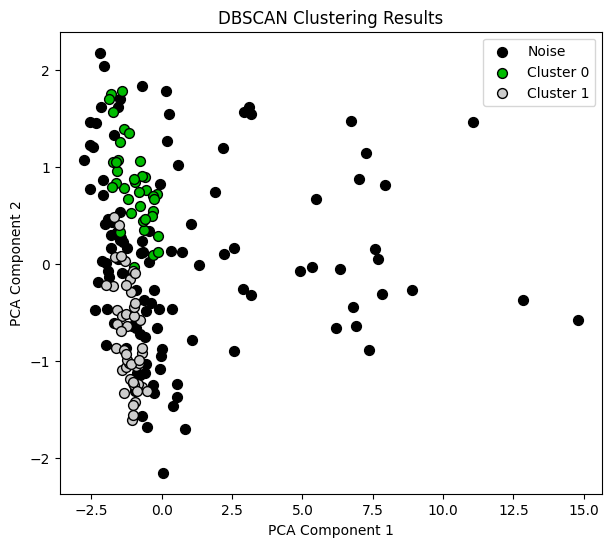

eps:  1.3
mins:  11


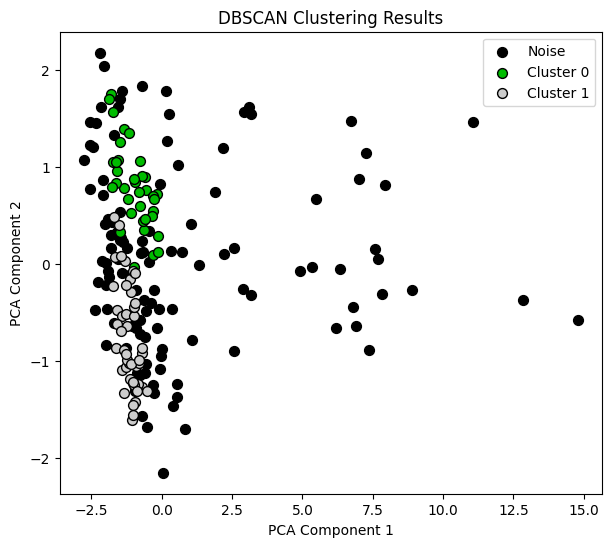

eps:  1.3
mins:  12


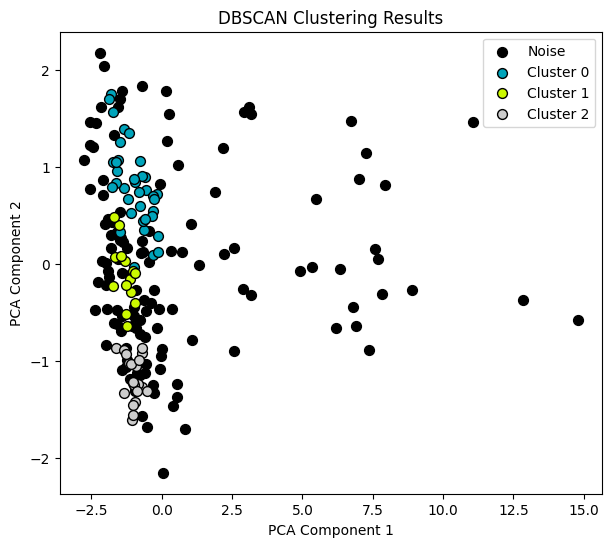

eps:  1.3
mins:  13


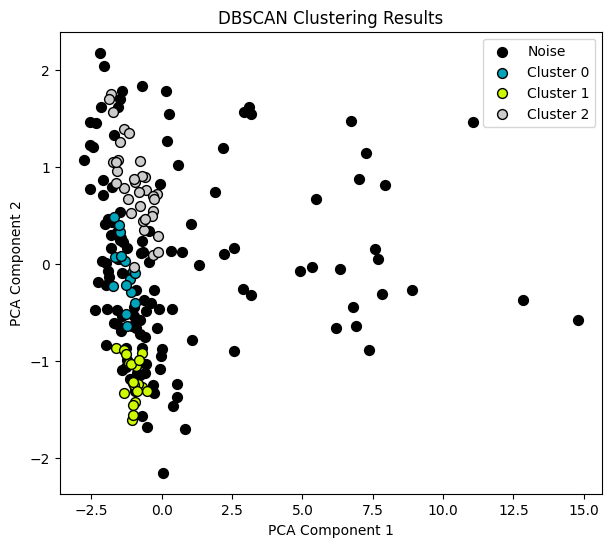

eps:  1.3
mins:  14


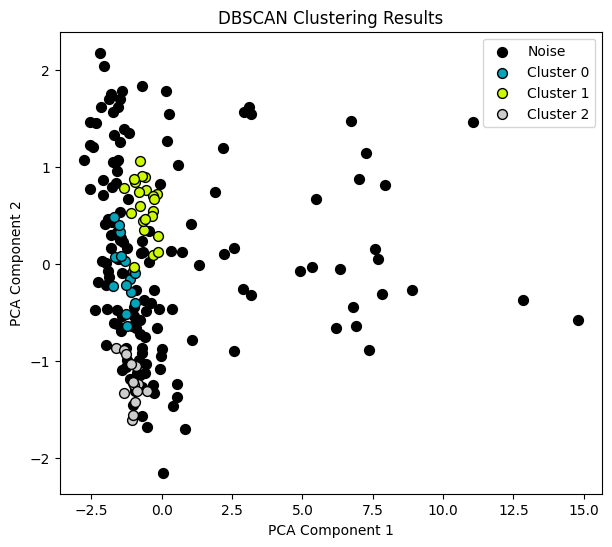

eps:  1.3
mins:  15


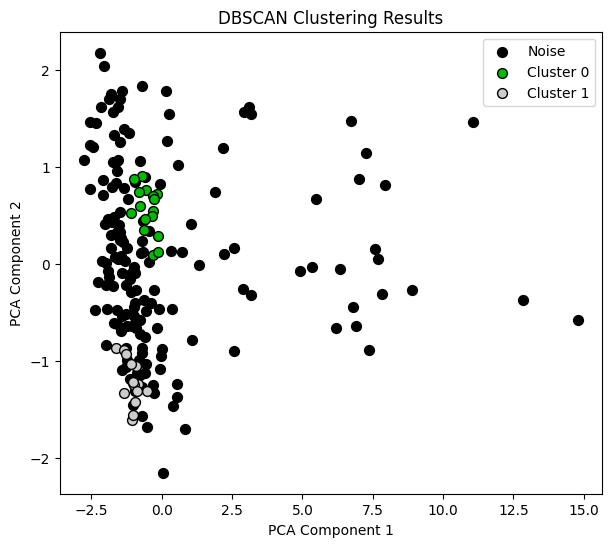

eps:  1.3
mins:  16


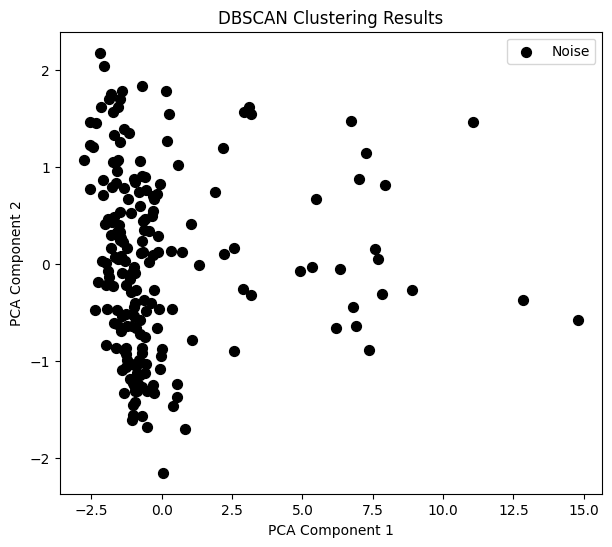

eps:  1.3
mins:  17


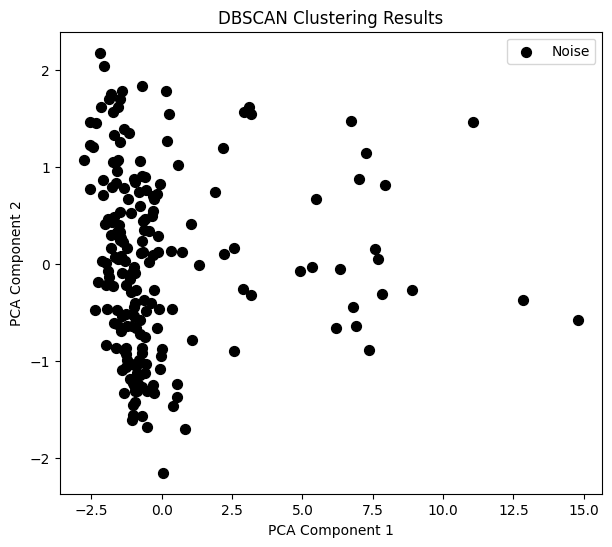

eps:  1.3
mins:  18


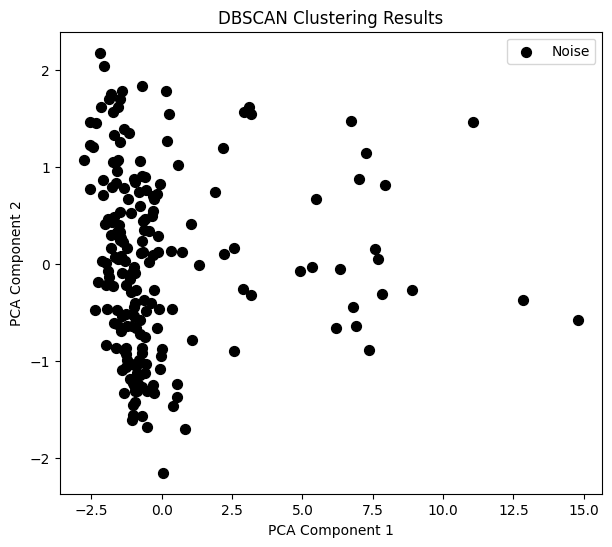

eps:  1.3
mins:  19


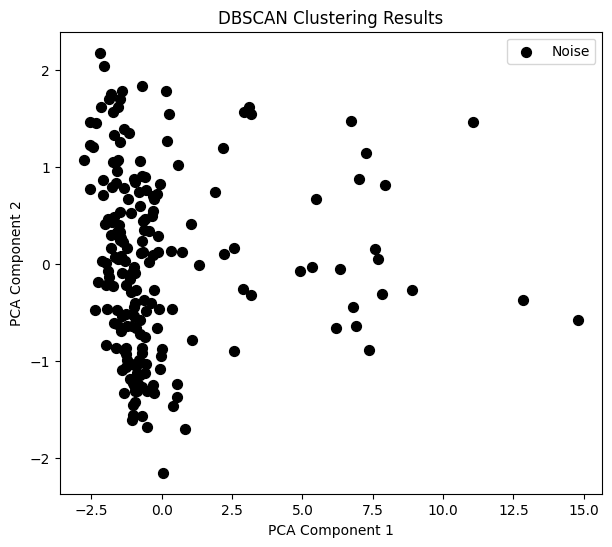

eps:  1.3
mins:  20


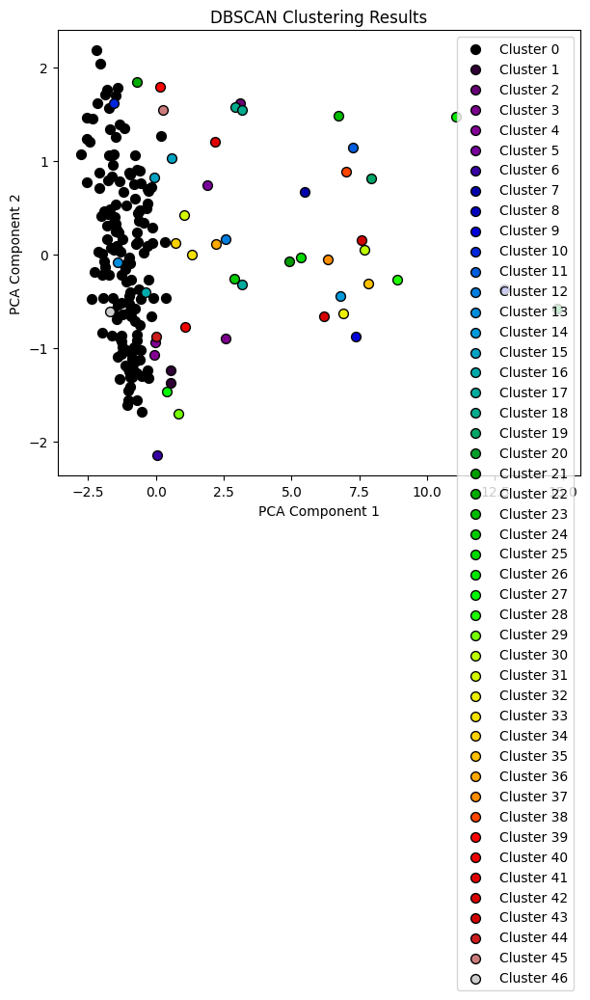

eps:  1.4
mins:  1


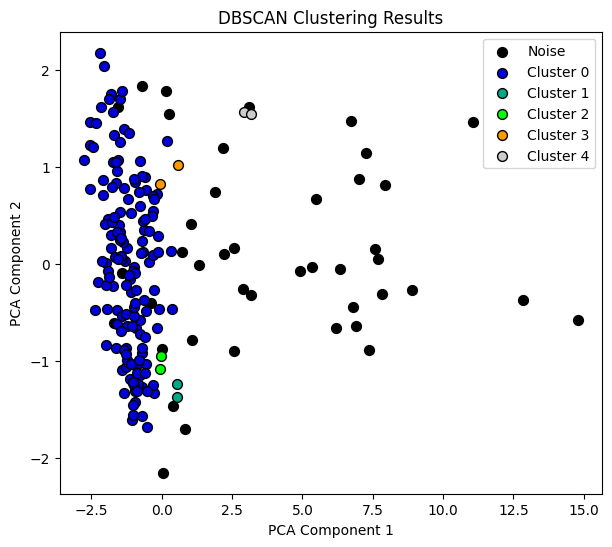

eps:  1.4
mins:  2


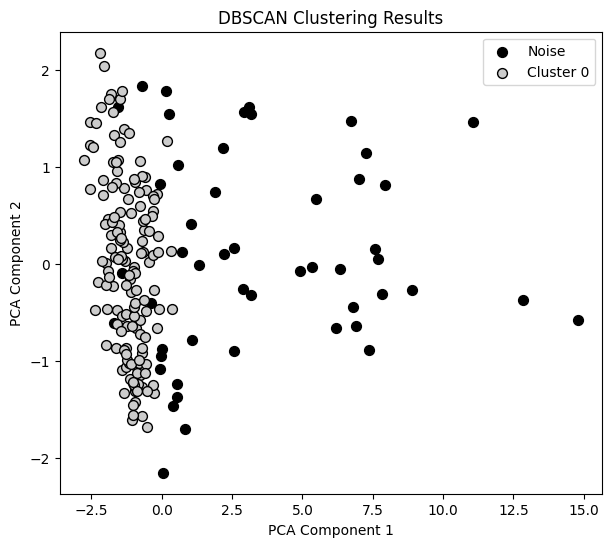

eps:  1.4
mins:  3


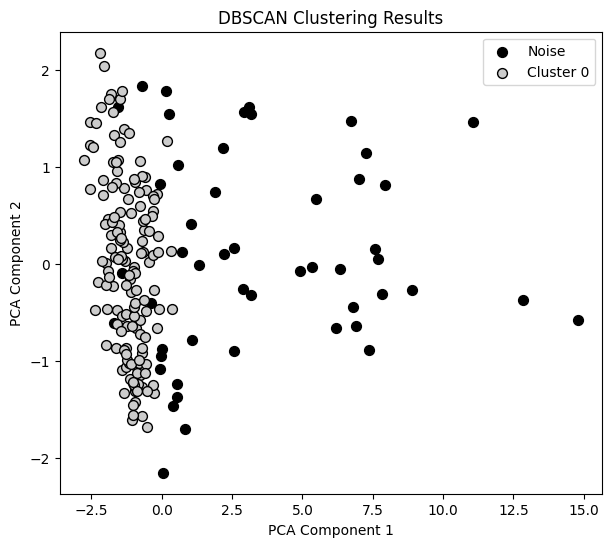

eps:  1.4
mins:  4


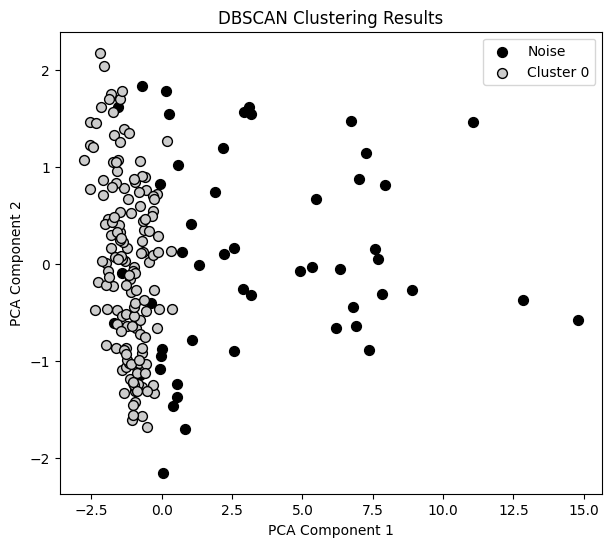

eps:  1.4
mins:  5


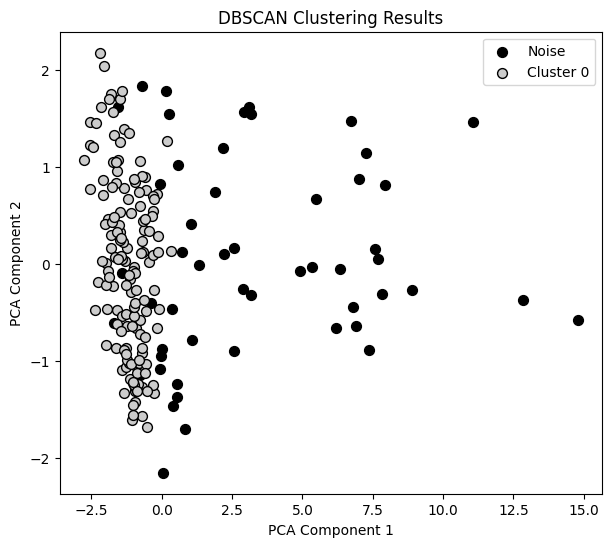

eps:  1.4
mins:  6


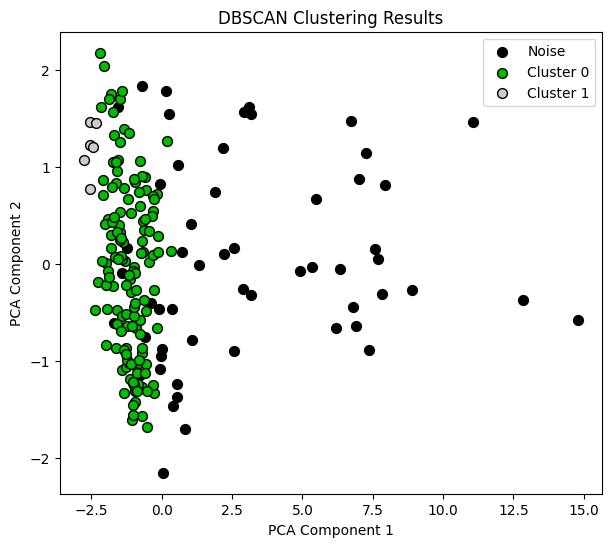

eps:  1.4
mins:  7


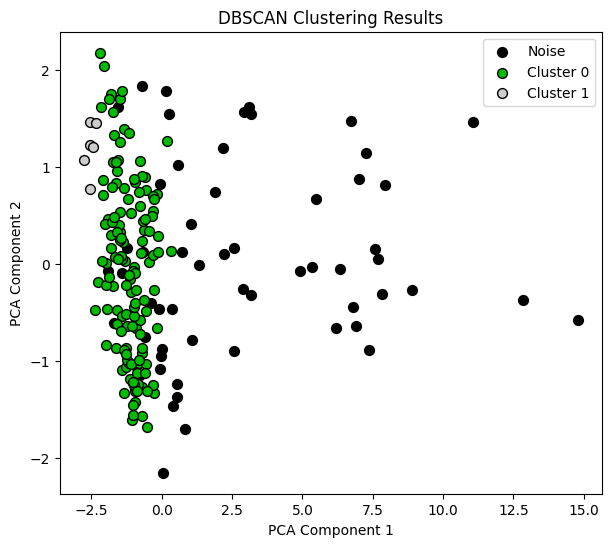

eps:  1.4
mins:  8


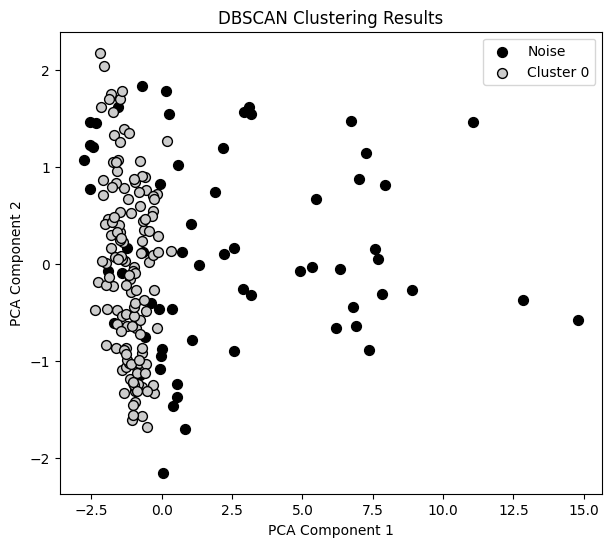

eps:  1.4
mins:  9


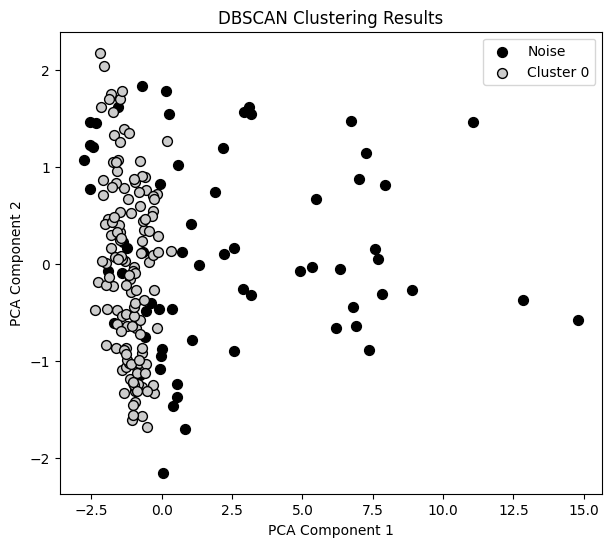

eps:  1.4
mins:  10


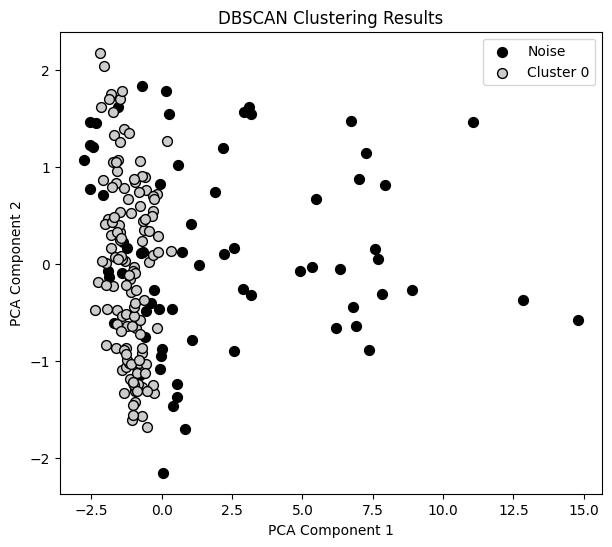

eps:  1.4
mins:  11


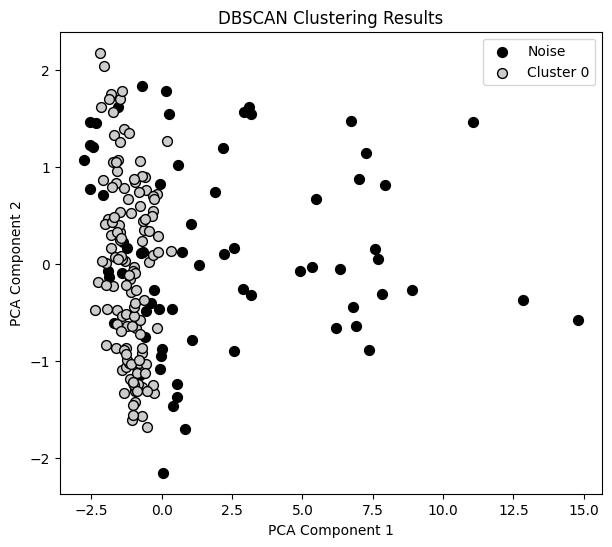

eps:  1.4
mins:  12


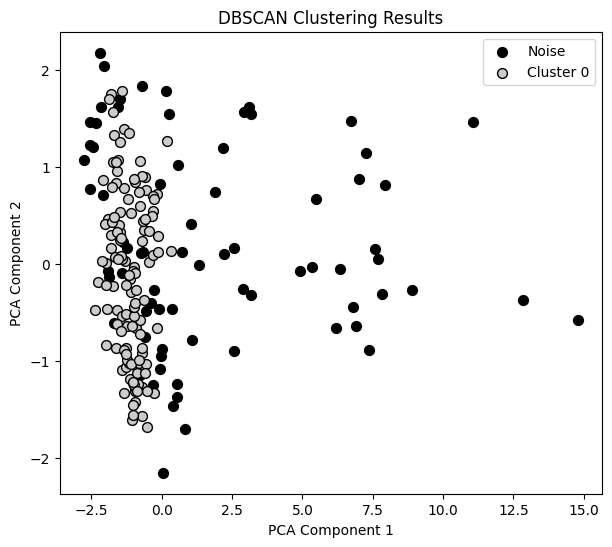

eps:  1.4
mins:  13


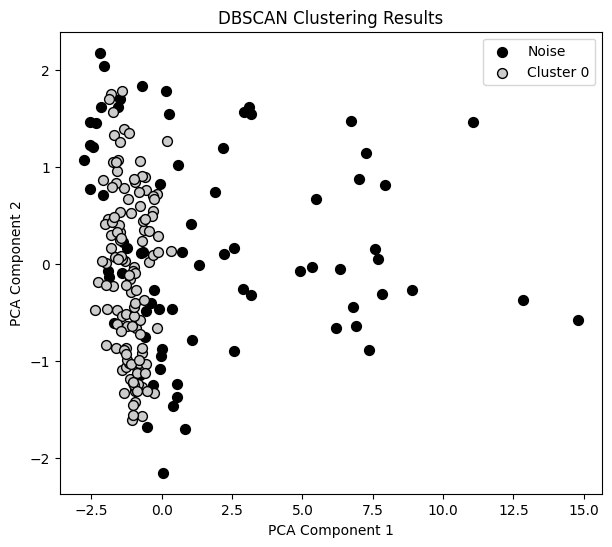

eps:  1.4
mins:  14


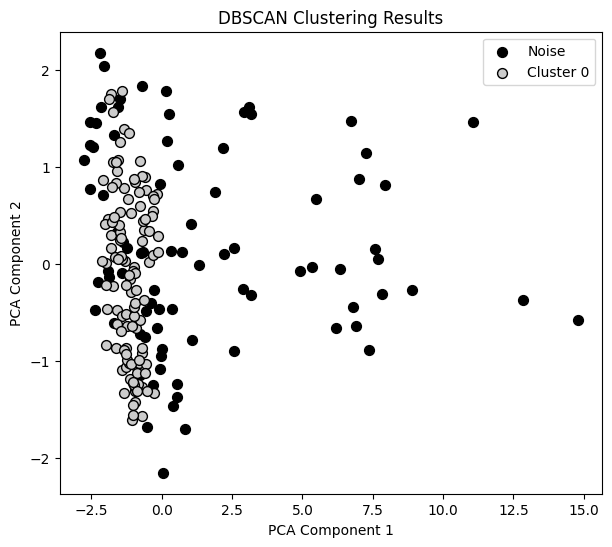

eps:  1.4
mins:  15


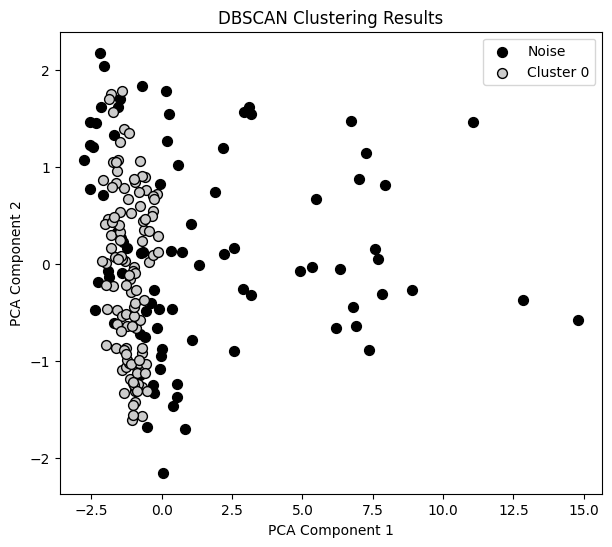

eps:  1.4
mins:  16


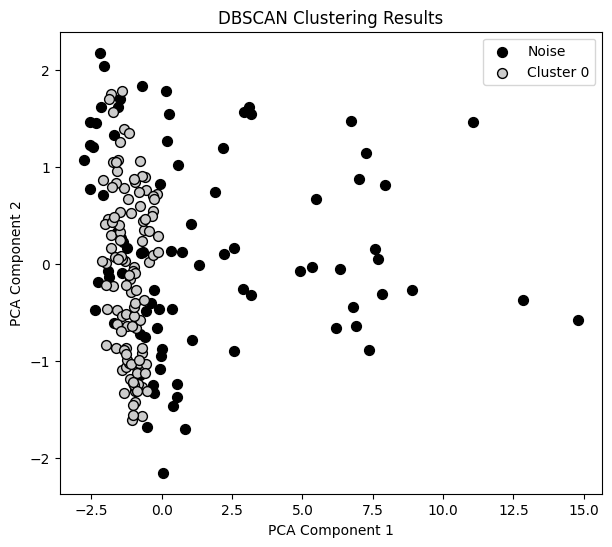

eps:  1.4
mins:  17


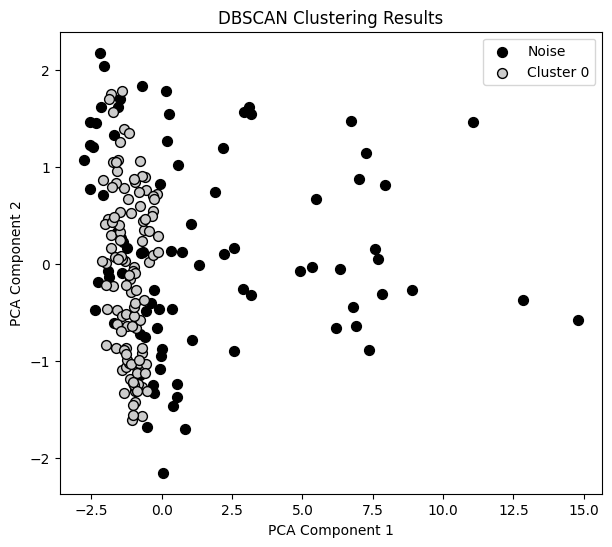

eps:  1.4
mins:  18


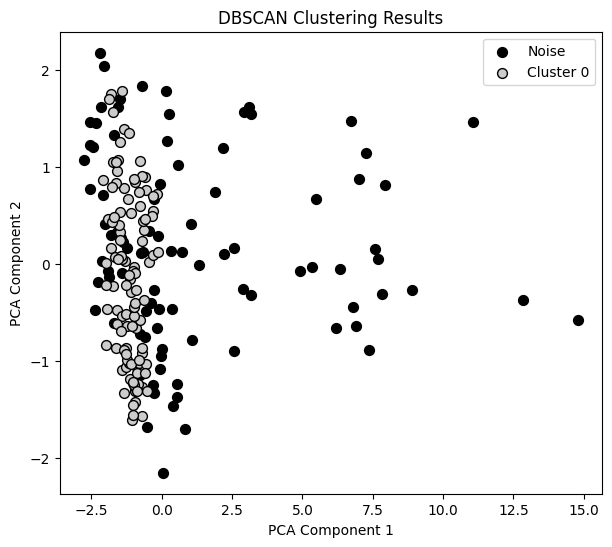

eps:  1.4
mins:  19


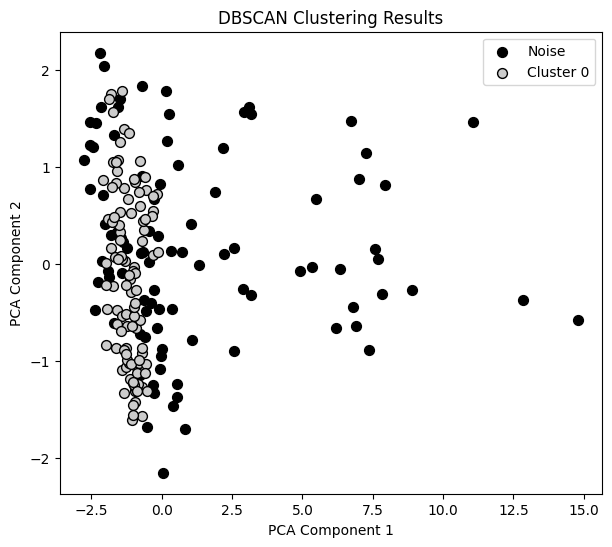

eps:  1.4
mins:  20


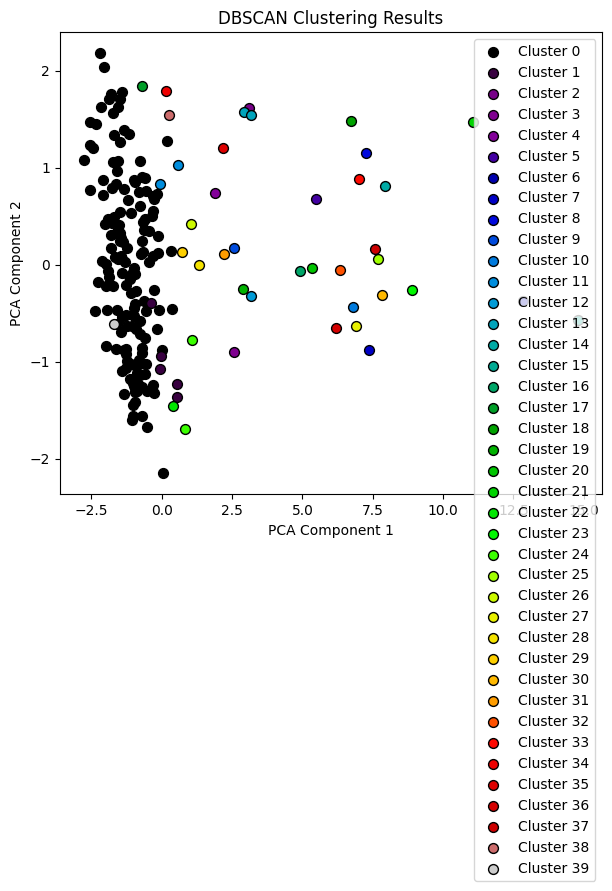

eps:  1.5
mins:  1


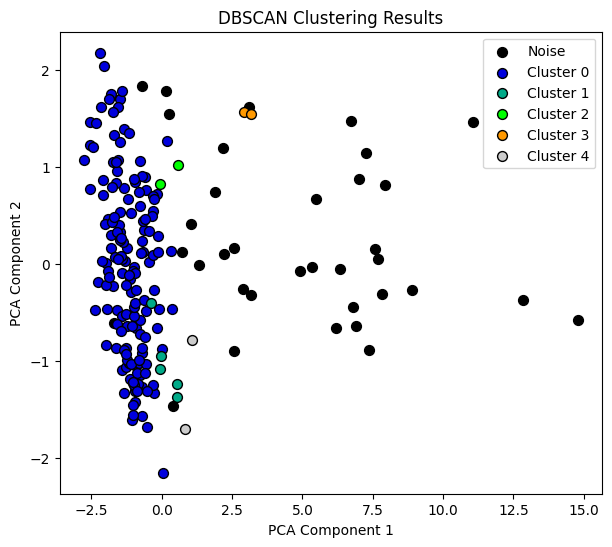

eps:  1.5
mins:  2


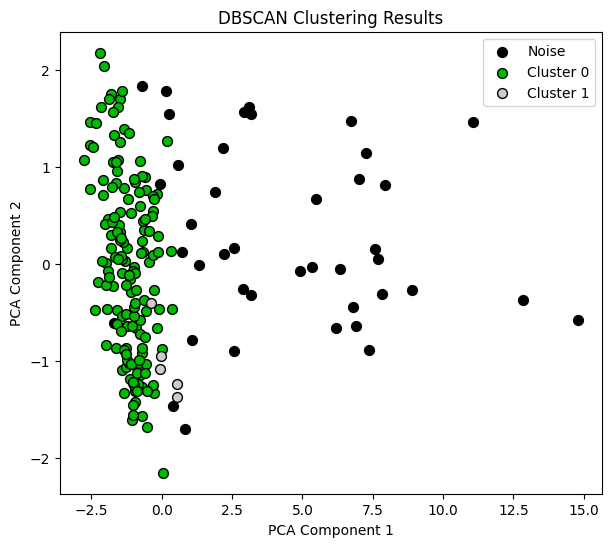

eps:  1.5
mins:  3


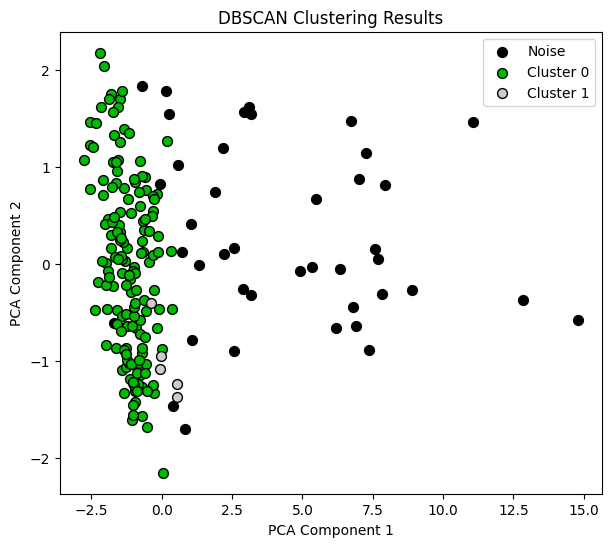

eps:  1.5
mins:  4


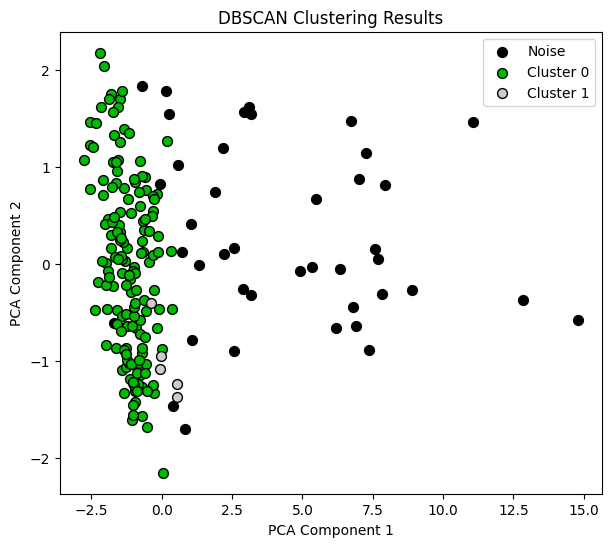

eps:  1.5
mins:  5


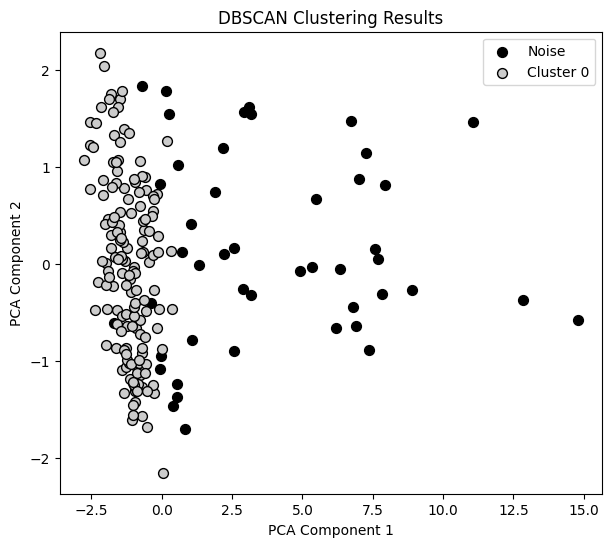

eps:  1.5
mins:  6


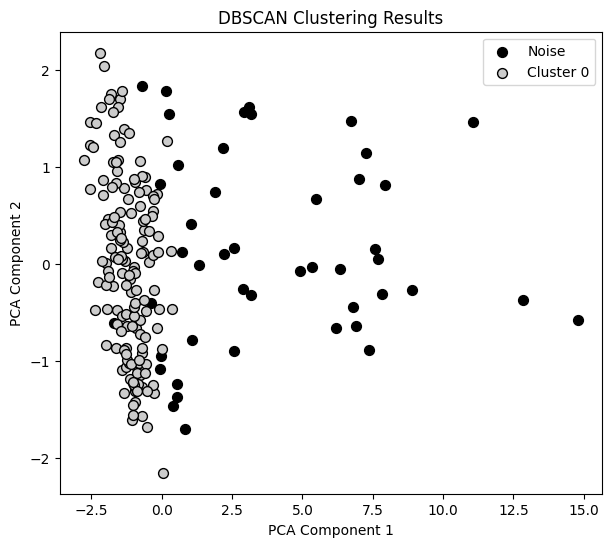

eps:  1.5
mins:  7


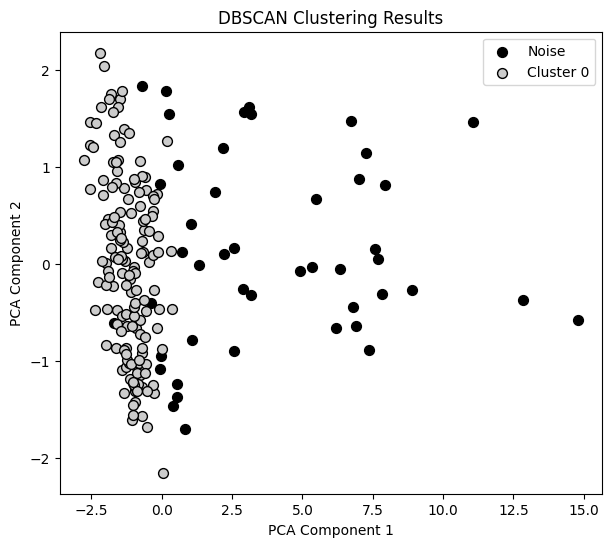

eps:  1.5
mins:  8


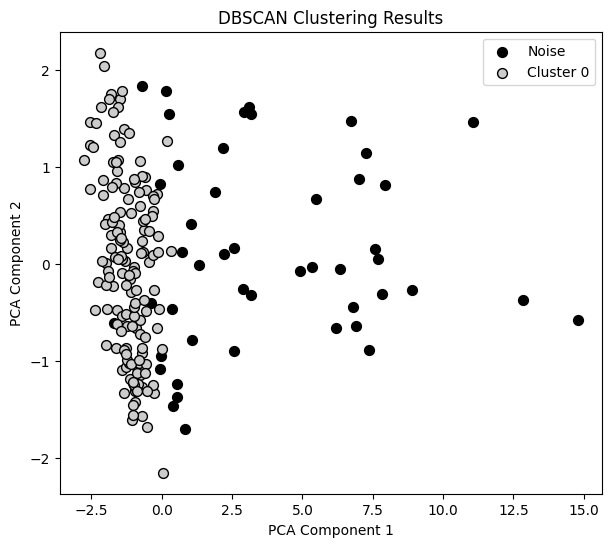

eps:  1.5
mins:  9


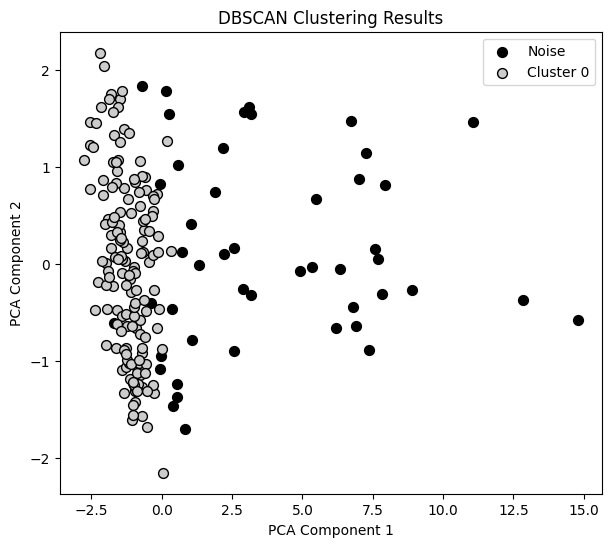

eps:  1.5
mins:  10


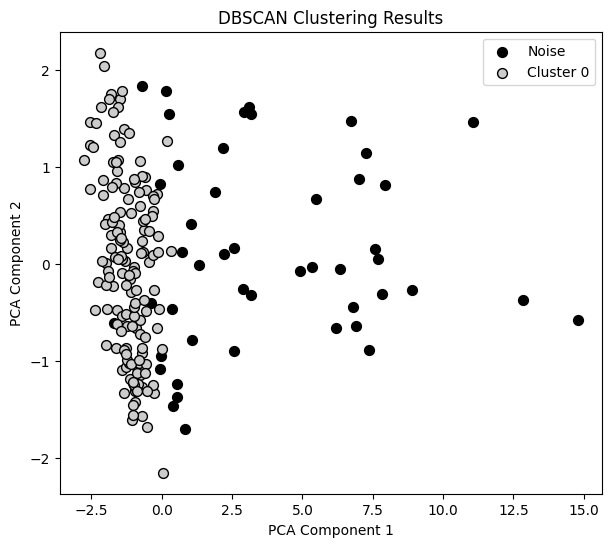

eps:  1.5
mins:  11


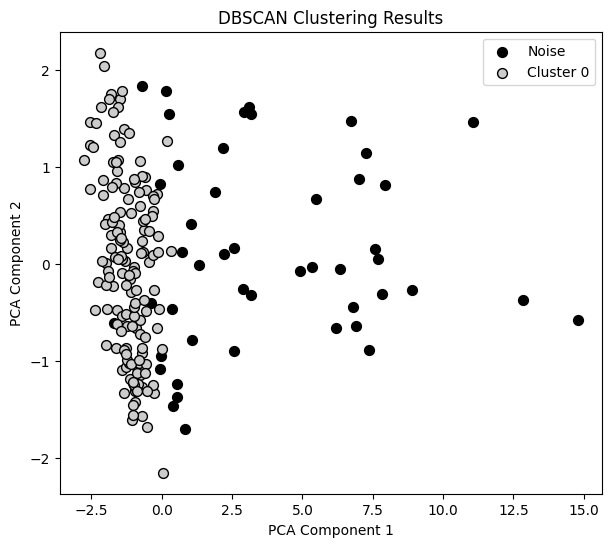

eps:  1.5
mins:  12


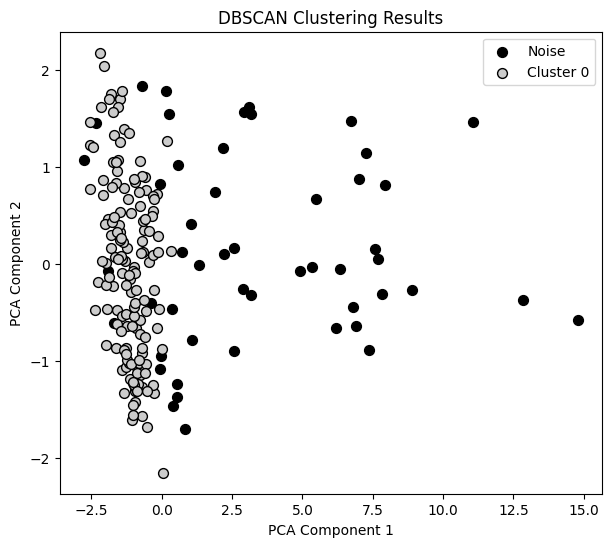

eps:  1.5
mins:  13


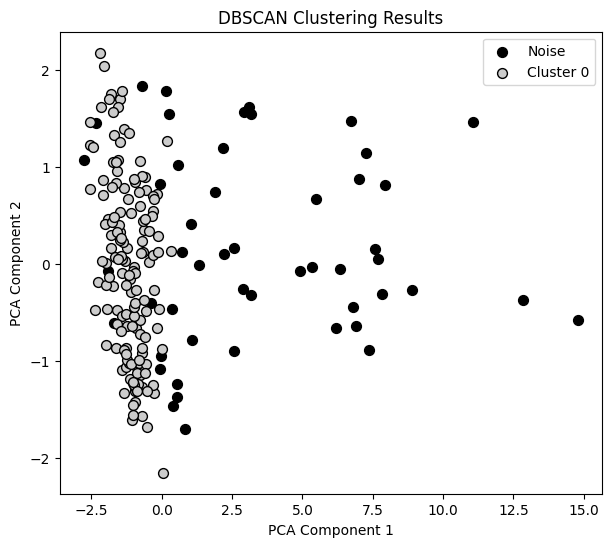

eps:  1.5
mins:  14


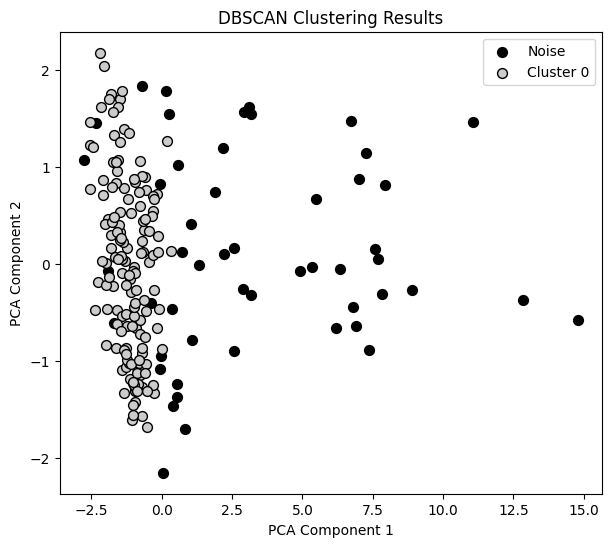

eps:  1.5
mins:  15


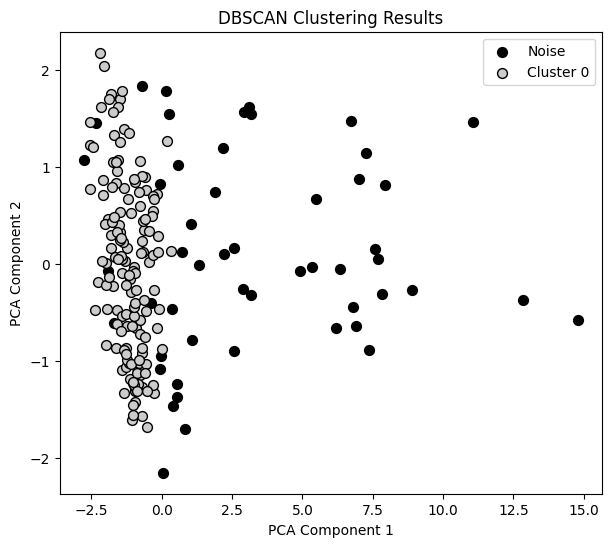

eps:  1.5
mins:  16


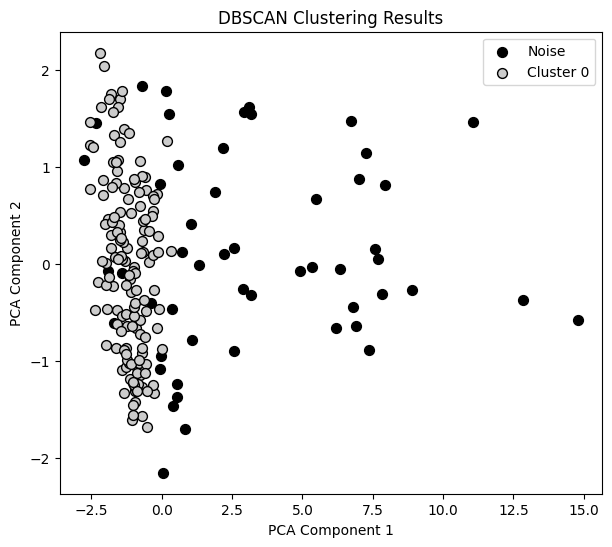

eps:  1.5
mins:  17


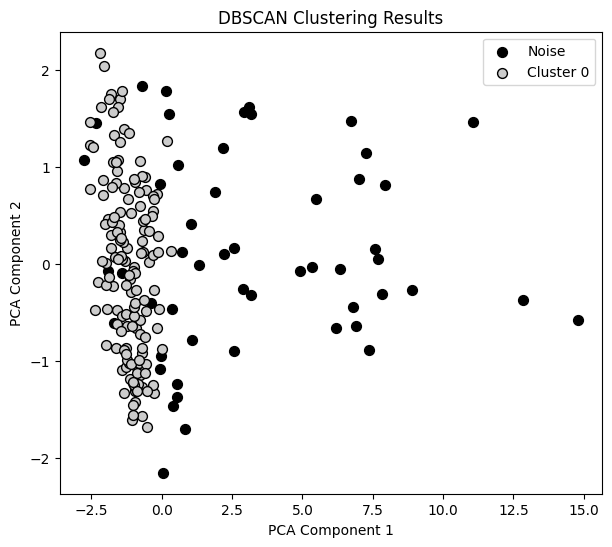

eps:  1.5
mins:  18


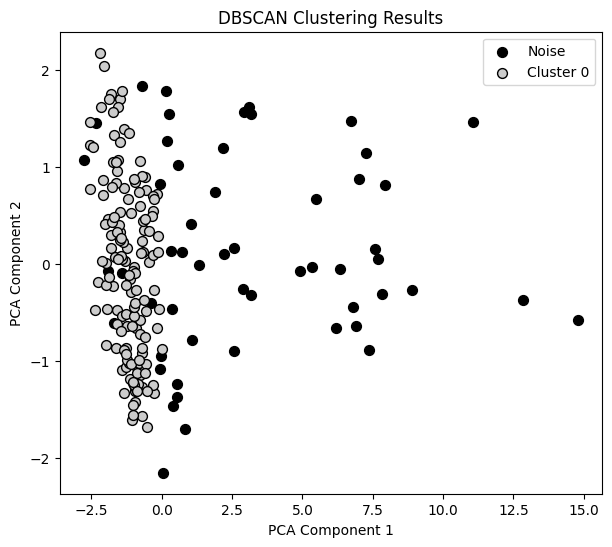

eps:  1.5
mins:  19


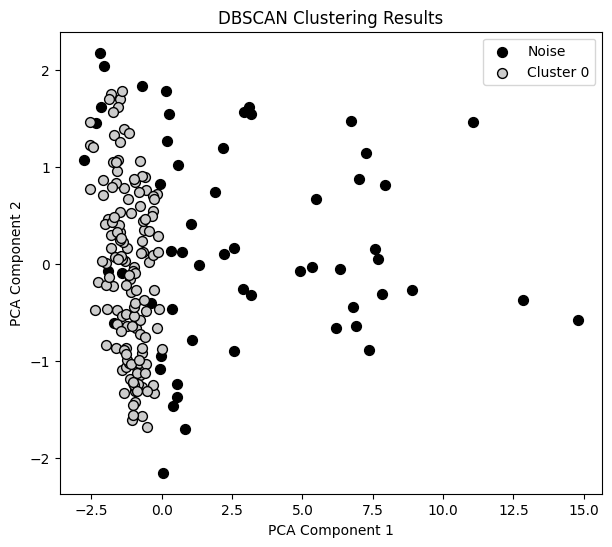

eps:  1.5
mins:  20


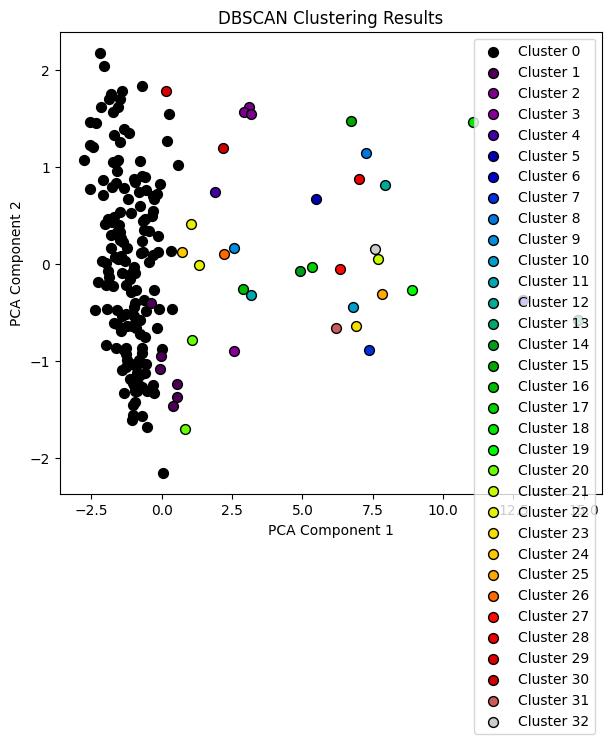

eps:  1.6
mins:  1


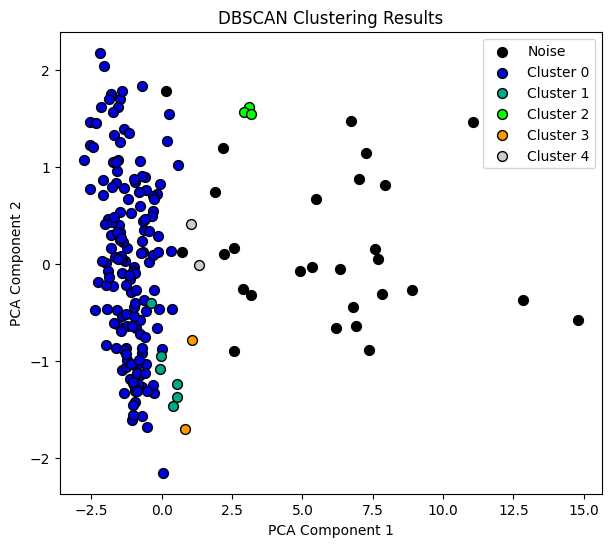

eps:  1.6
mins:  2


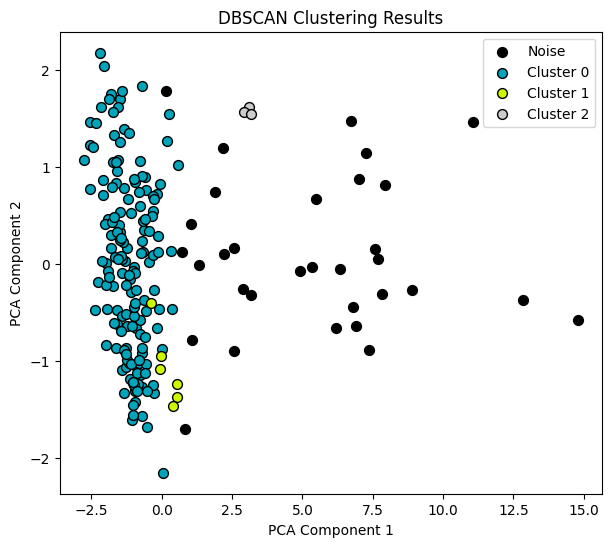

eps:  1.6
mins:  3


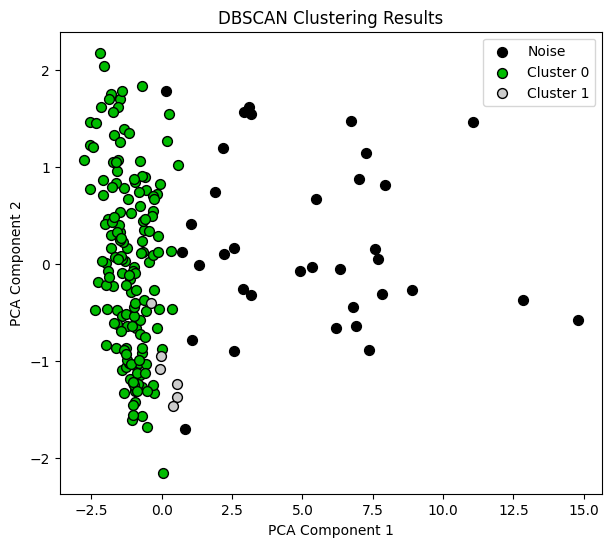

eps:  1.6
mins:  4


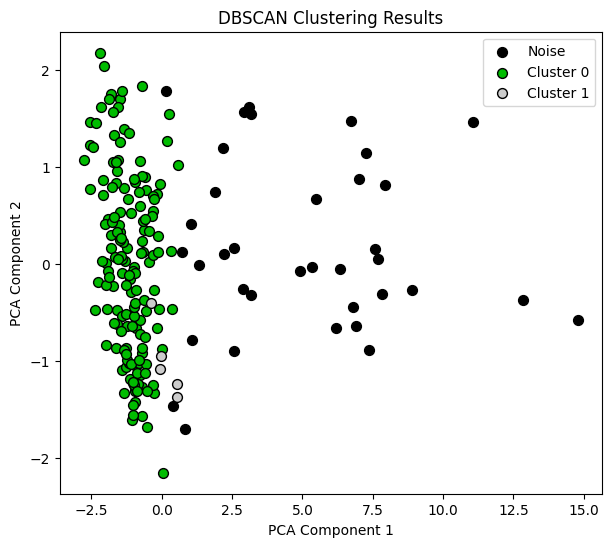

eps:  1.6
mins:  5


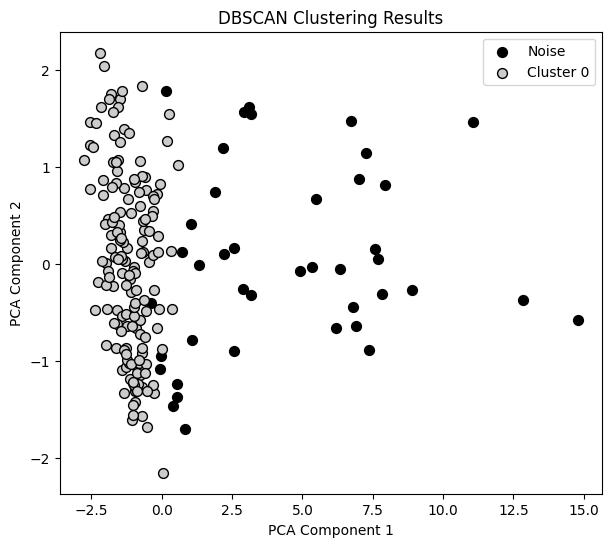

eps:  1.6
mins:  6


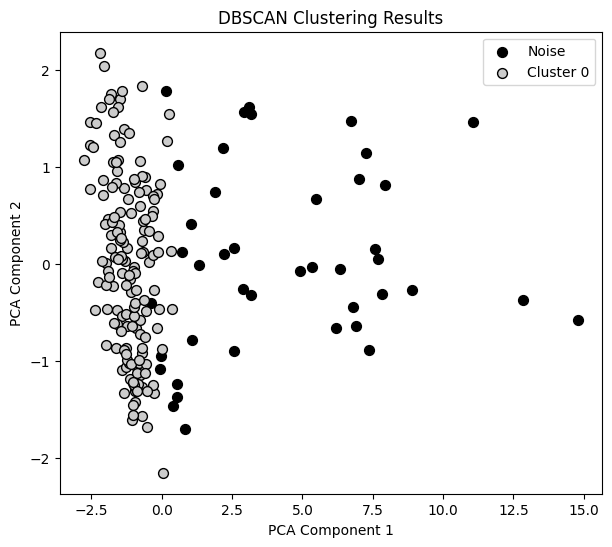

eps:  1.6
mins:  7


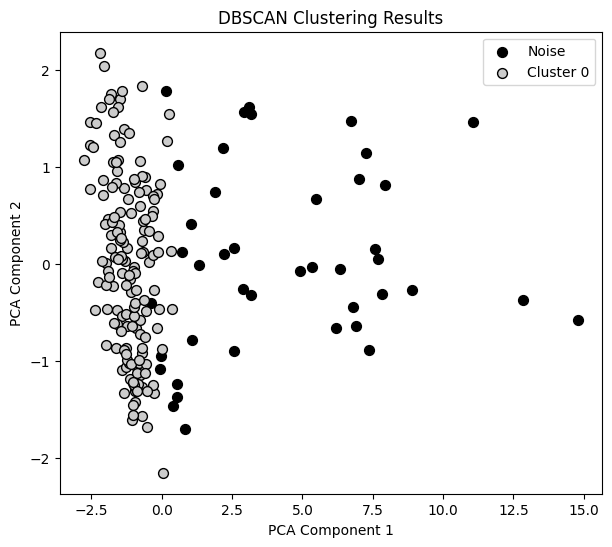

eps:  1.6
mins:  8


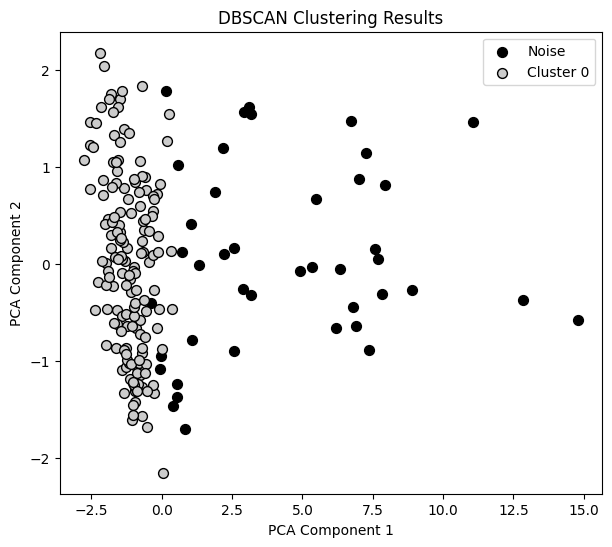

eps:  1.6
mins:  9


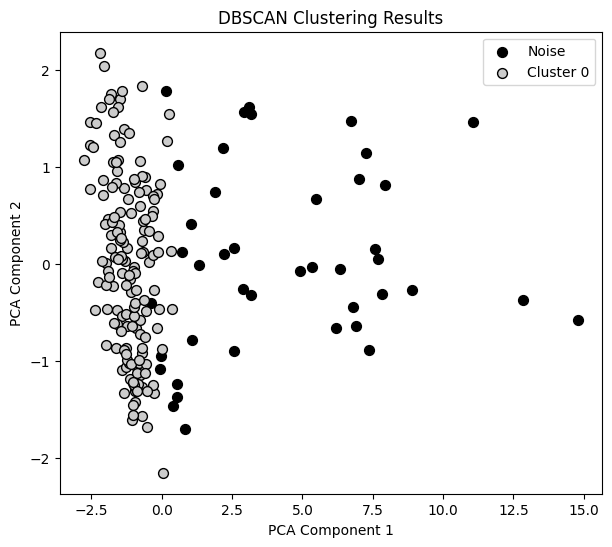

eps:  1.6
mins:  10


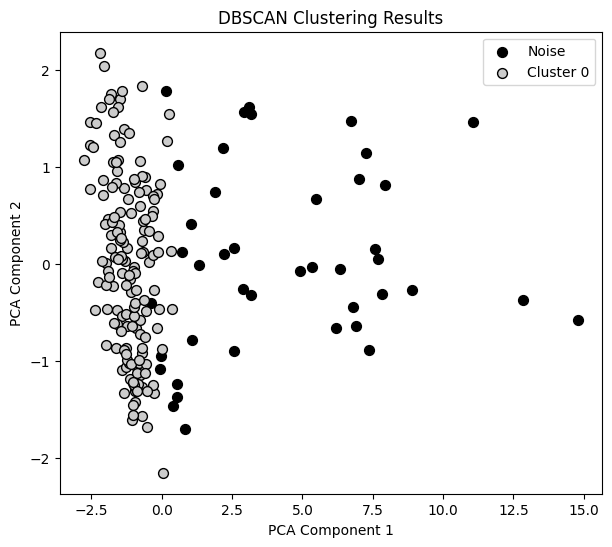

eps:  1.6
mins:  11


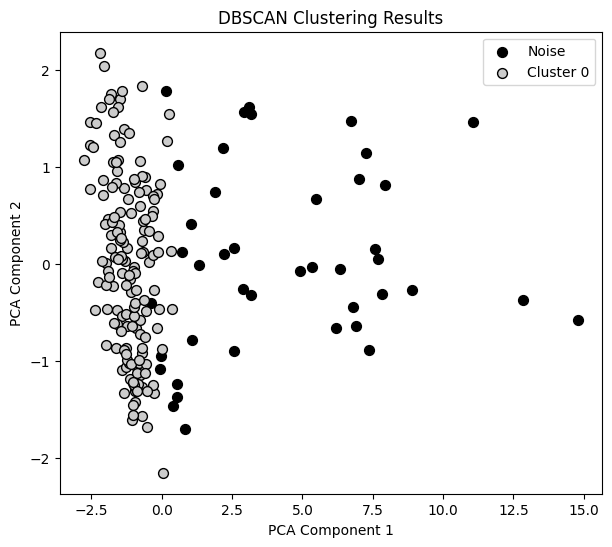

eps:  1.6
mins:  12


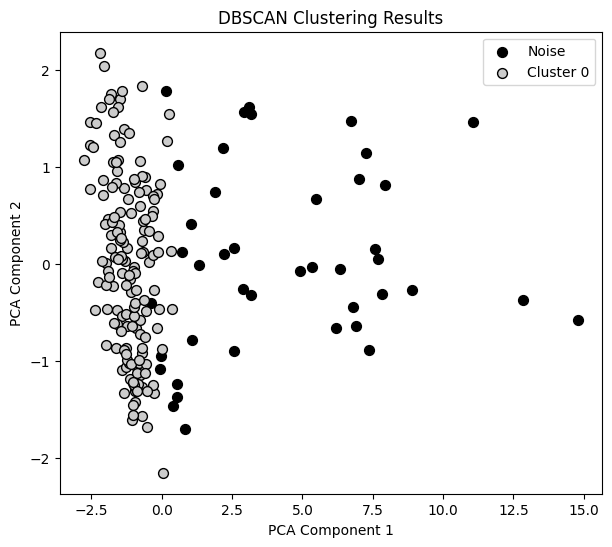

eps:  1.6
mins:  13


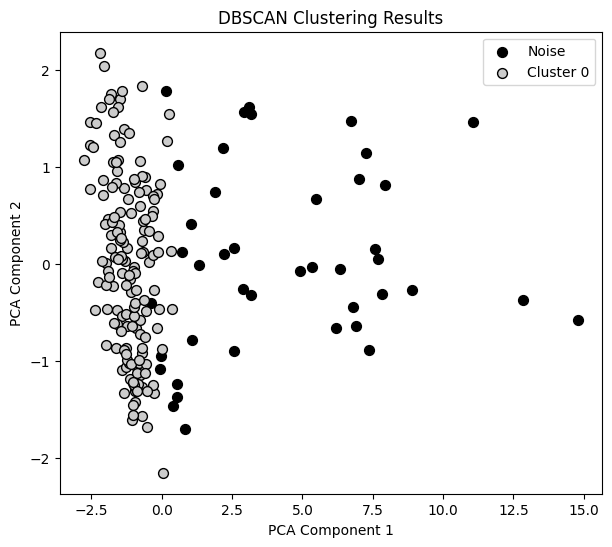

eps:  1.6
mins:  14


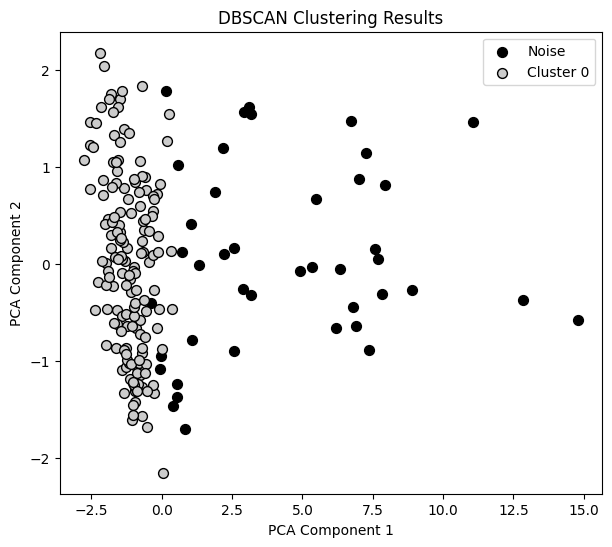

eps:  1.6
mins:  15


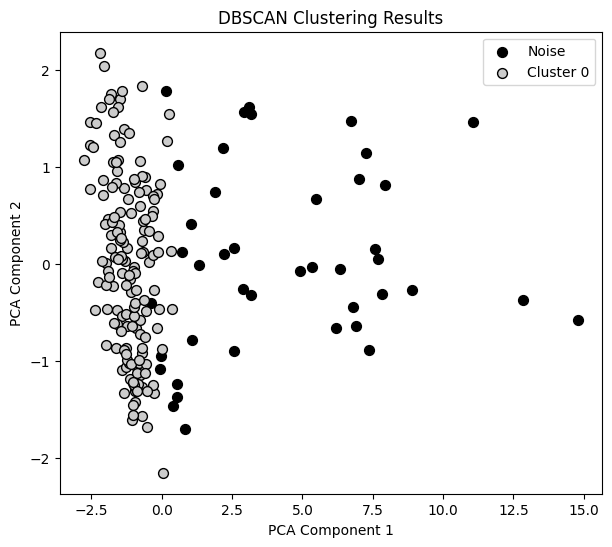

eps:  1.6
mins:  16


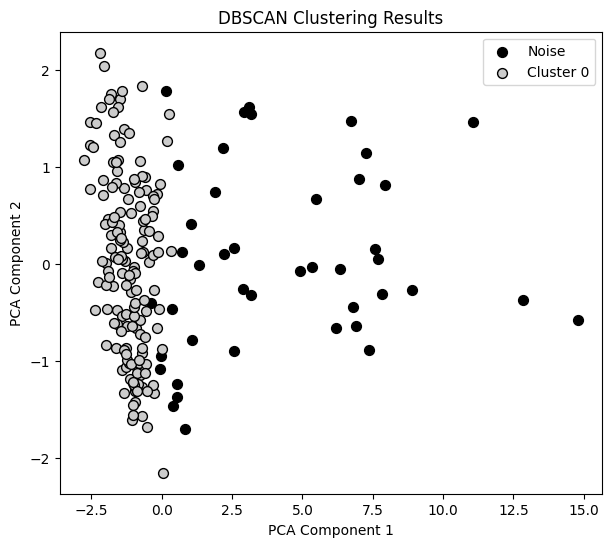

eps:  1.6
mins:  17


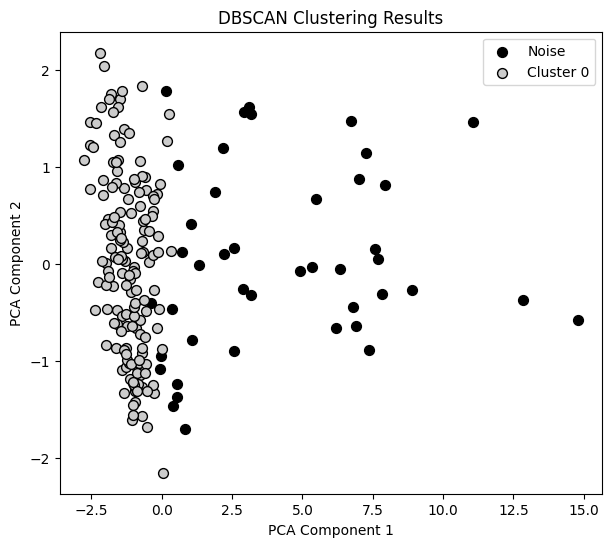

eps:  1.6
mins:  18


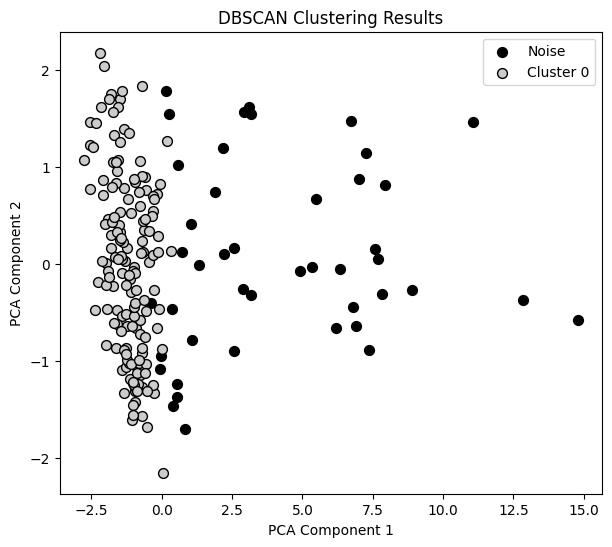

eps:  1.6
mins:  19


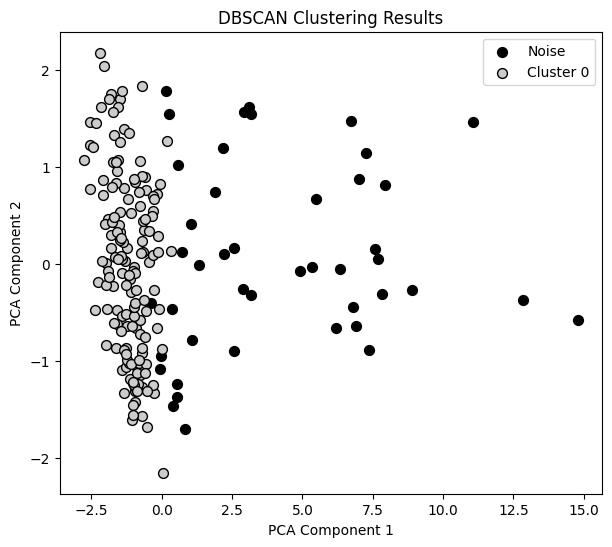

eps:  1.6
mins:  20


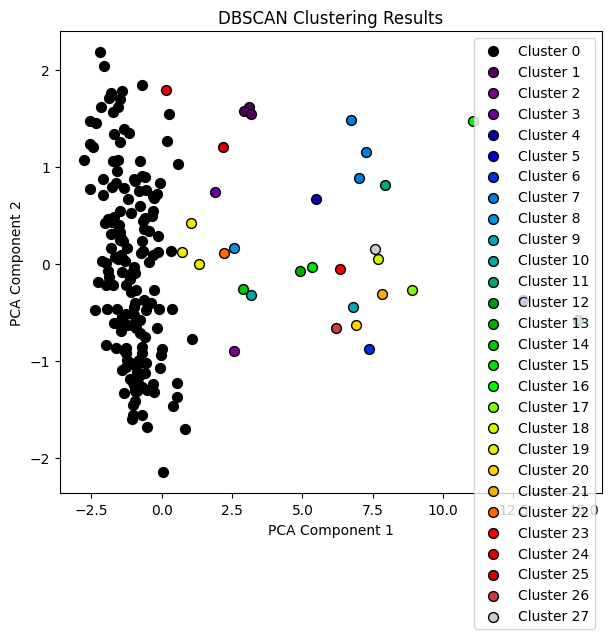

eps:  1.7
mins:  1


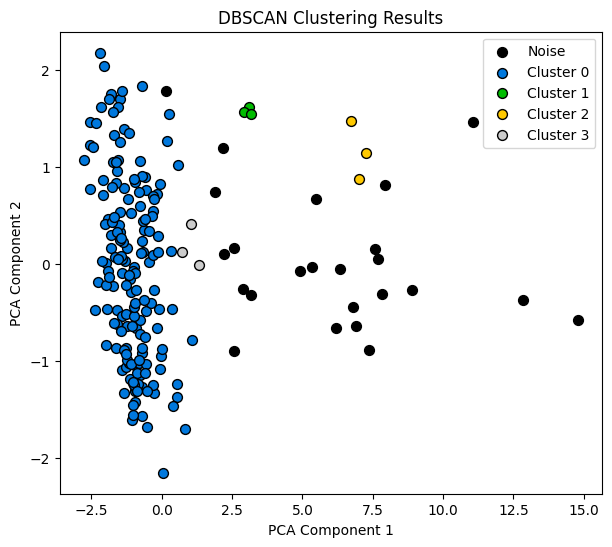

eps:  1.7
mins:  2


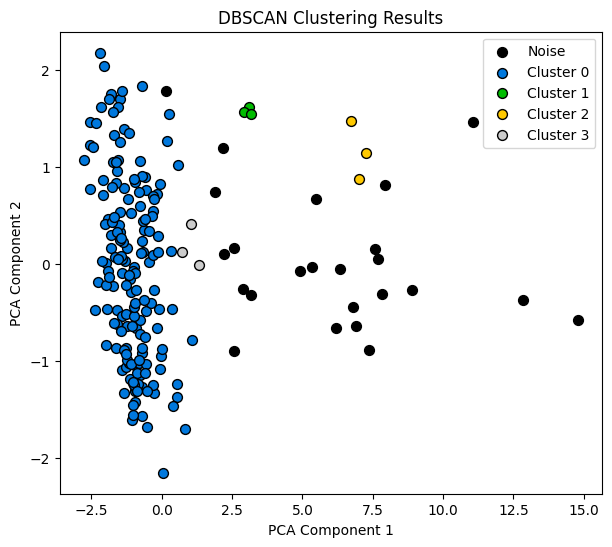

eps:  1.7
mins:  3


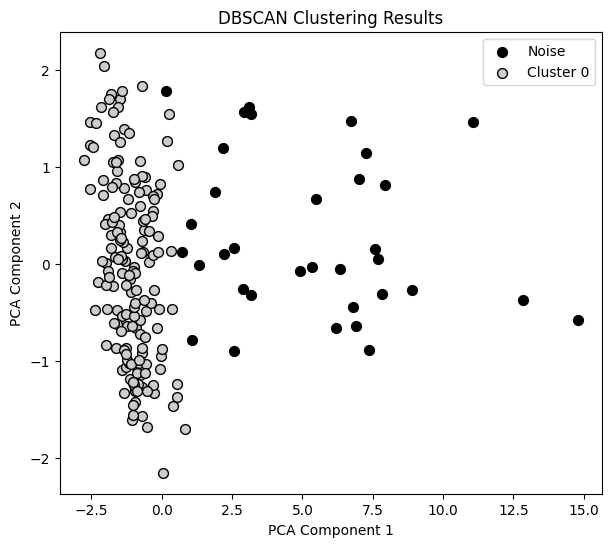

eps:  1.7
mins:  4


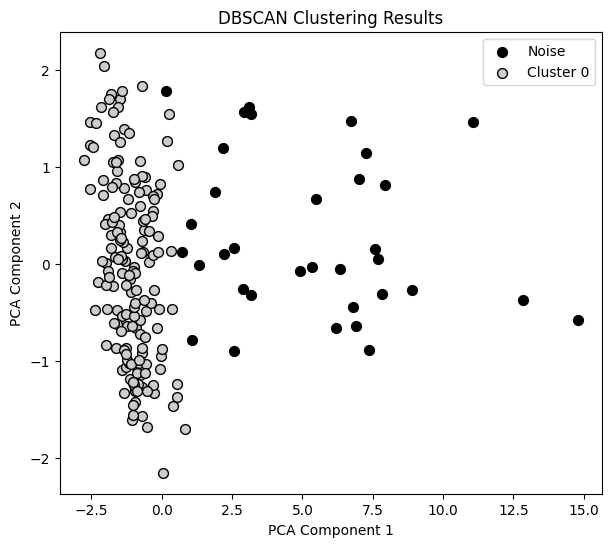

eps:  1.7
mins:  5


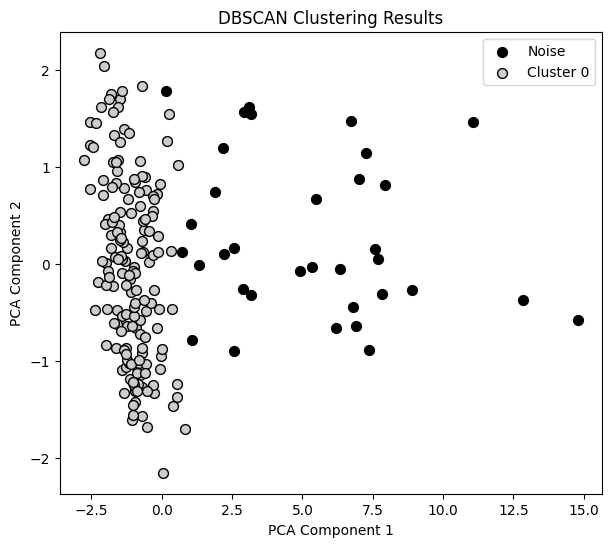

eps:  1.7
mins:  6


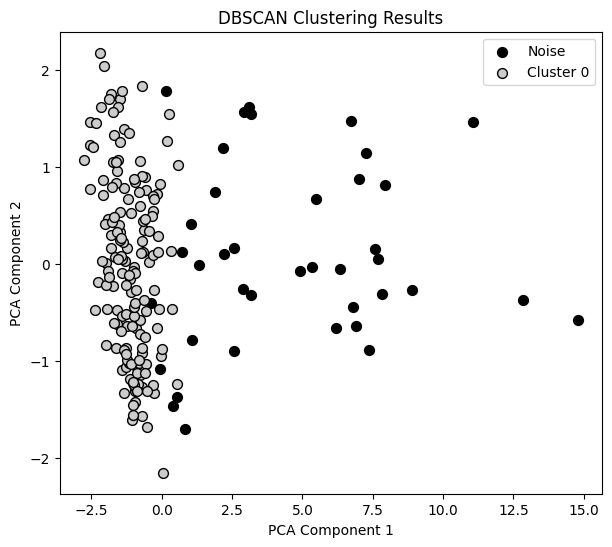

eps:  1.7
mins:  7


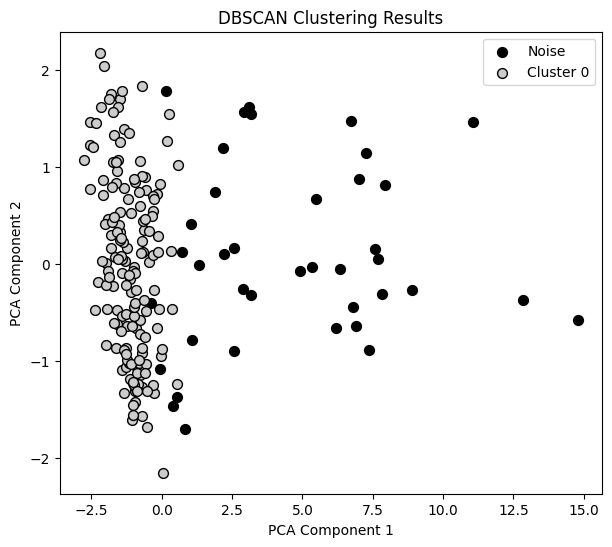

eps:  1.7
mins:  8


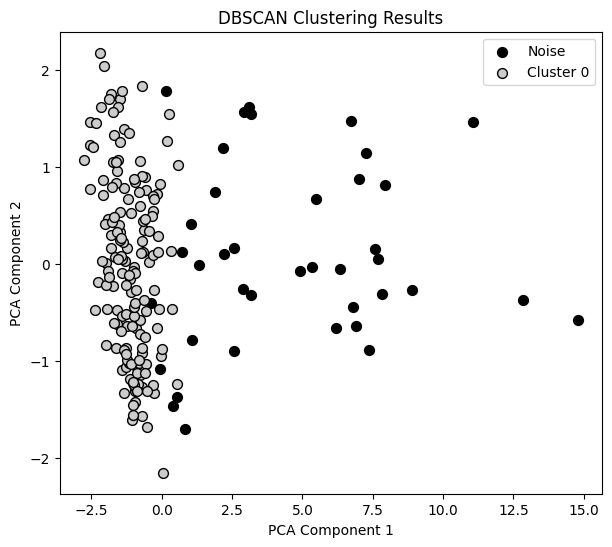

eps:  1.7
mins:  9


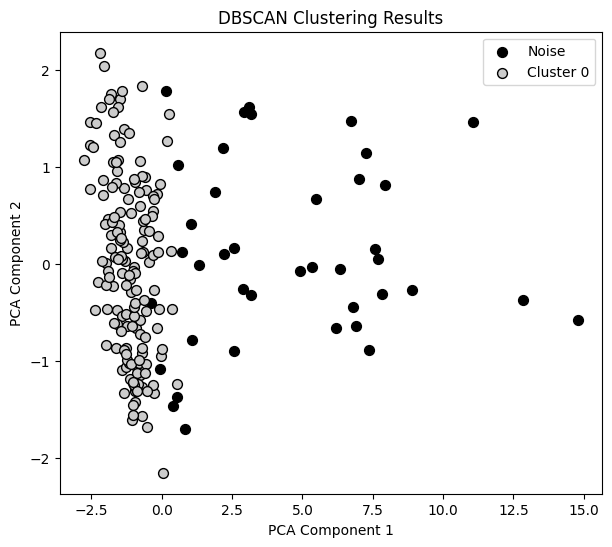

eps:  1.7
mins:  10


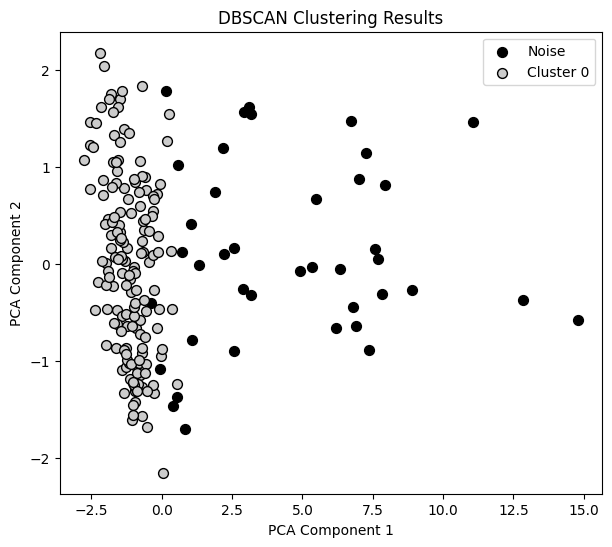

eps:  1.7
mins:  11


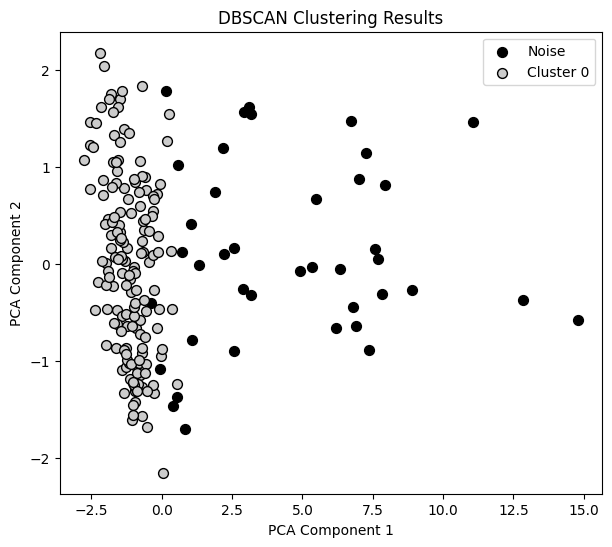

eps:  1.7
mins:  12


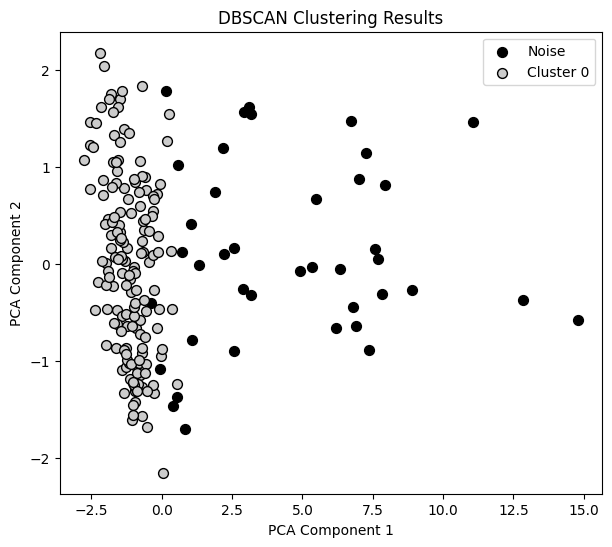

eps:  1.7
mins:  13


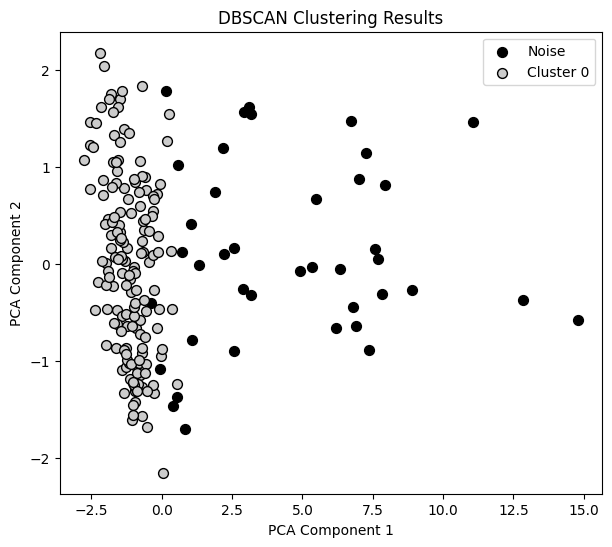

eps:  1.7
mins:  14


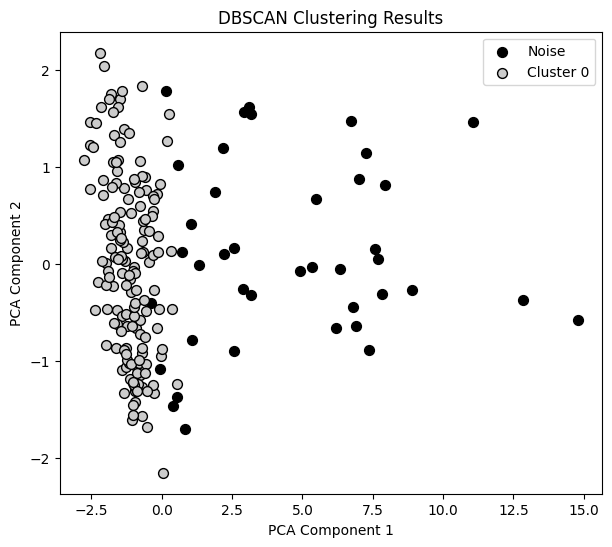

eps:  1.7
mins:  15


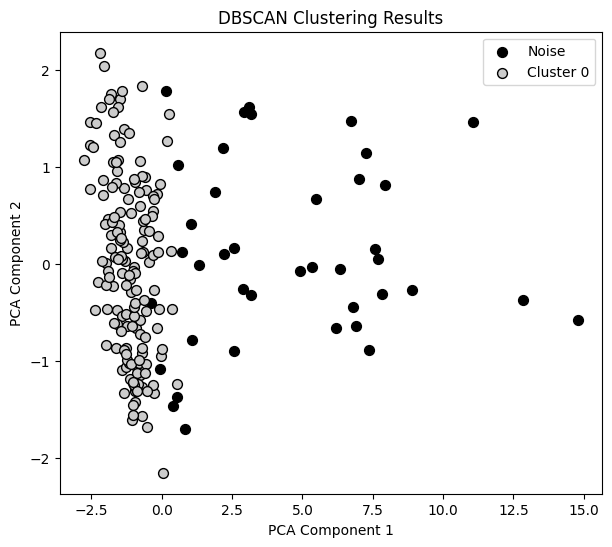

eps:  1.7
mins:  16


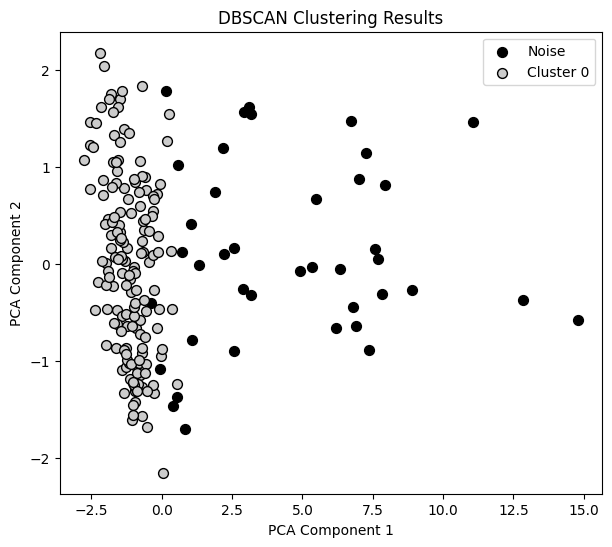

eps:  1.7
mins:  17


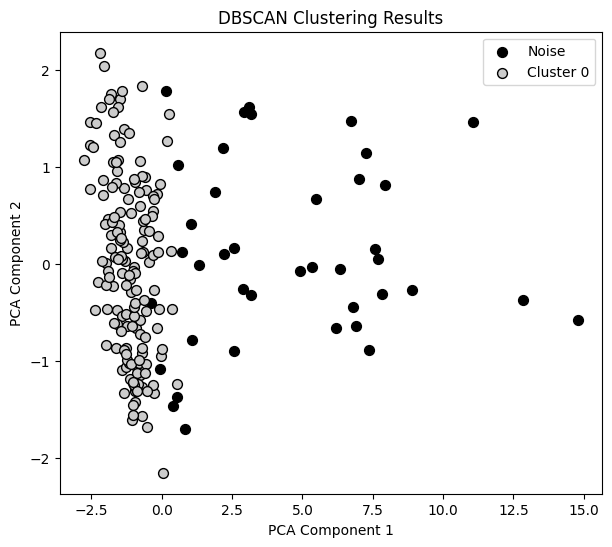

eps:  1.7
mins:  18


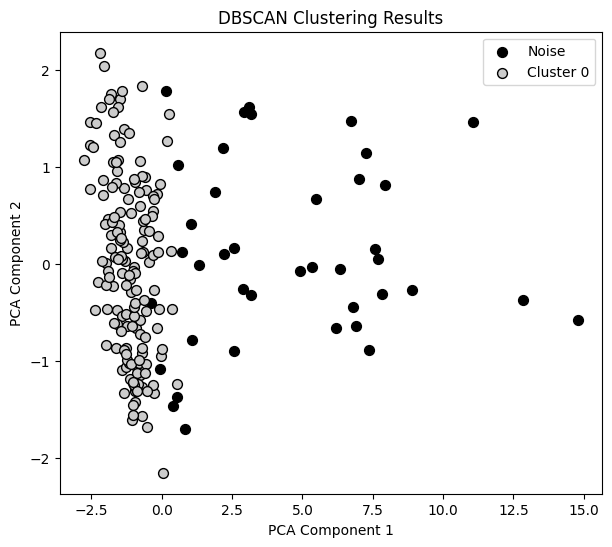

eps:  1.7
mins:  19


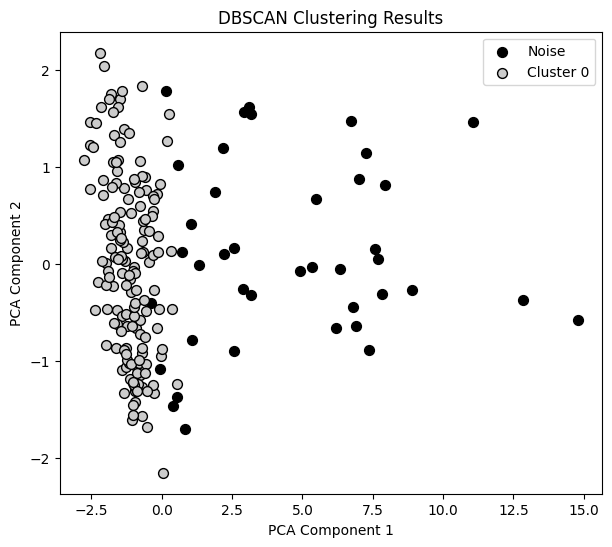

eps:  1.7
mins:  20


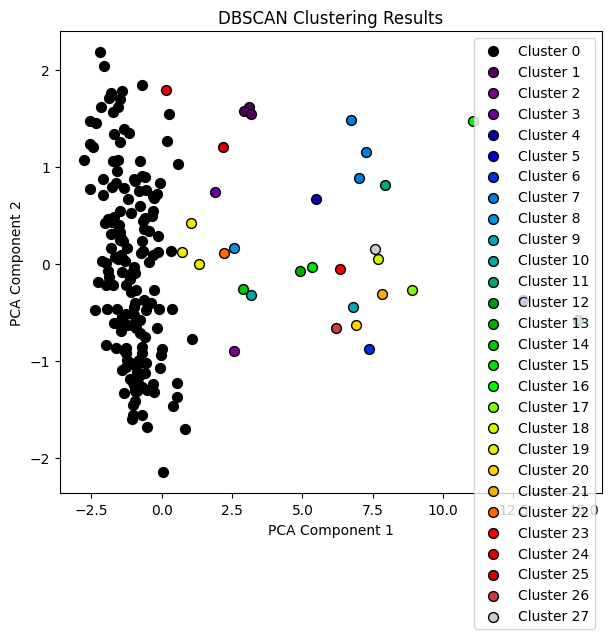

eps:  1.8
mins:  1


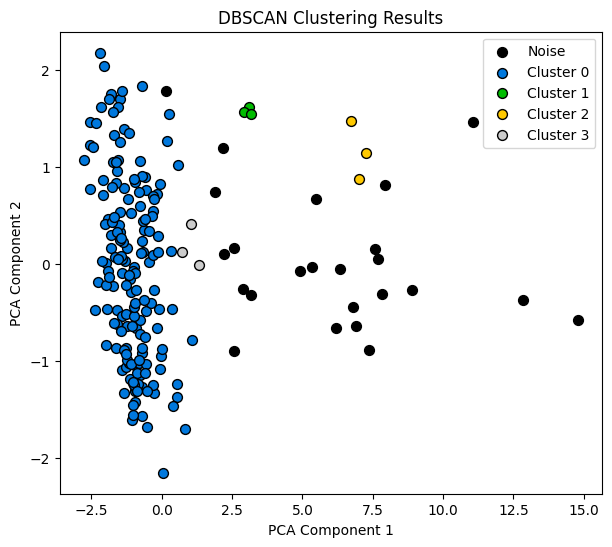

eps:  1.8
mins:  2


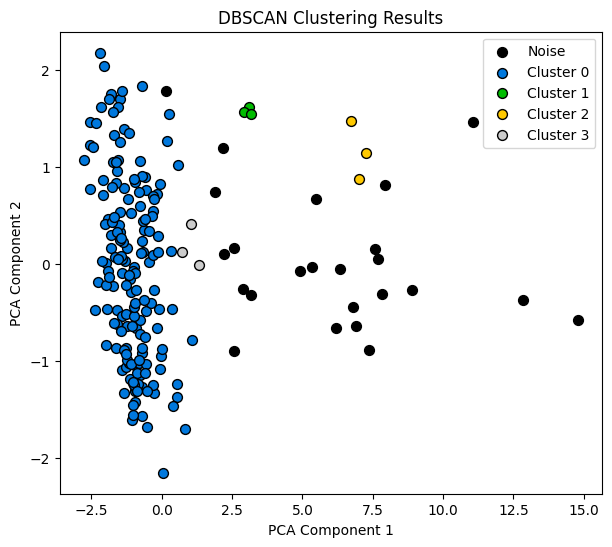

eps:  1.8
mins:  3


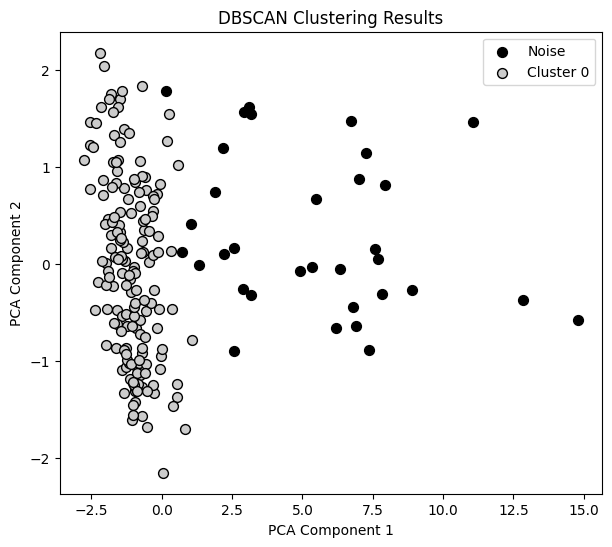

eps:  1.8
mins:  4


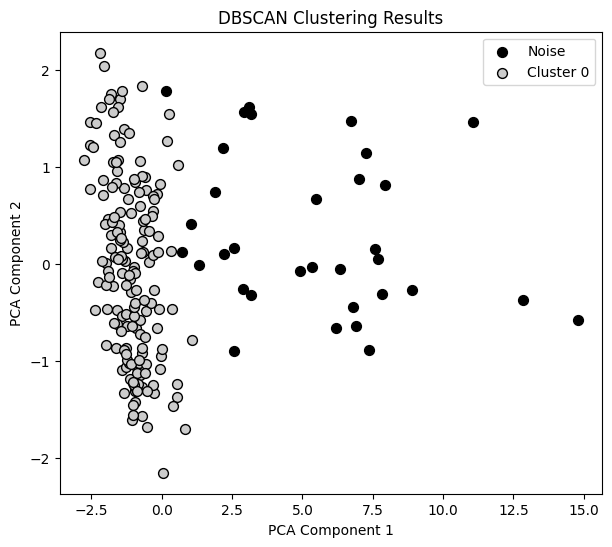

eps:  1.8
mins:  5


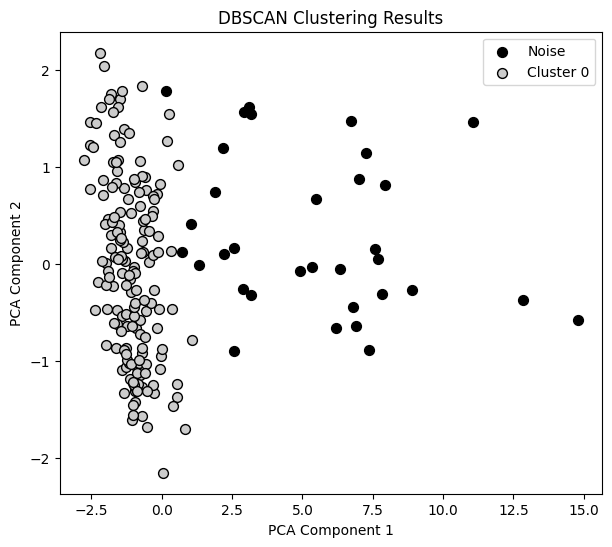

eps:  1.8
mins:  6


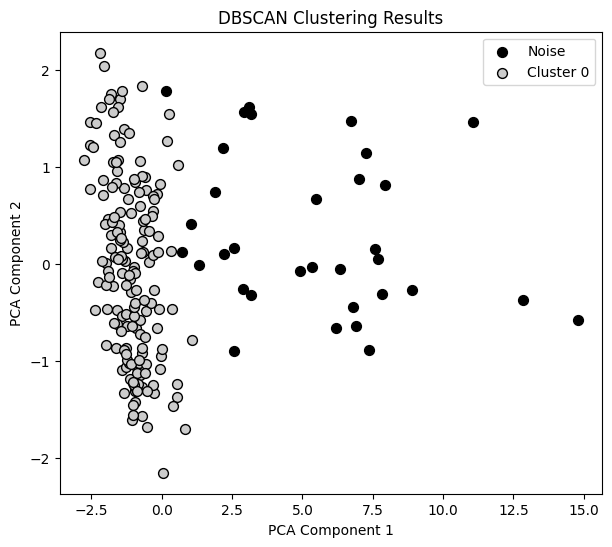

eps:  1.8
mins:  7


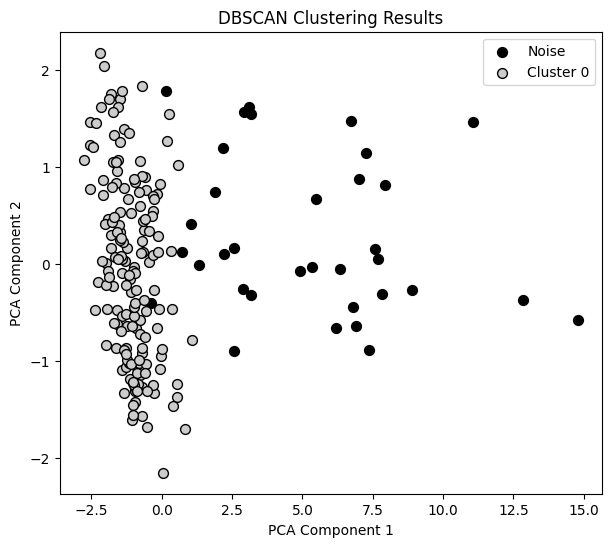

eps:  1.8
mins:  8


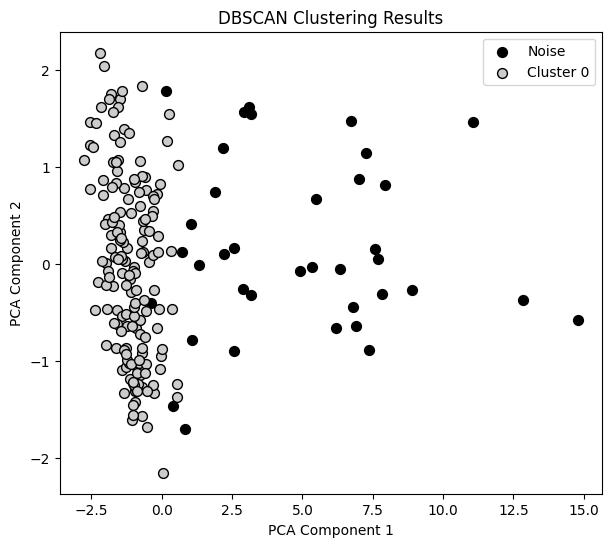

eps:  1.8
mins:  9


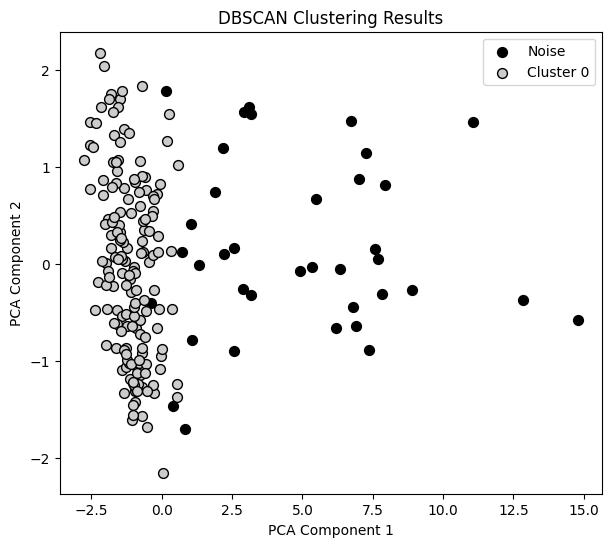

eps:  1.8
mins:  10


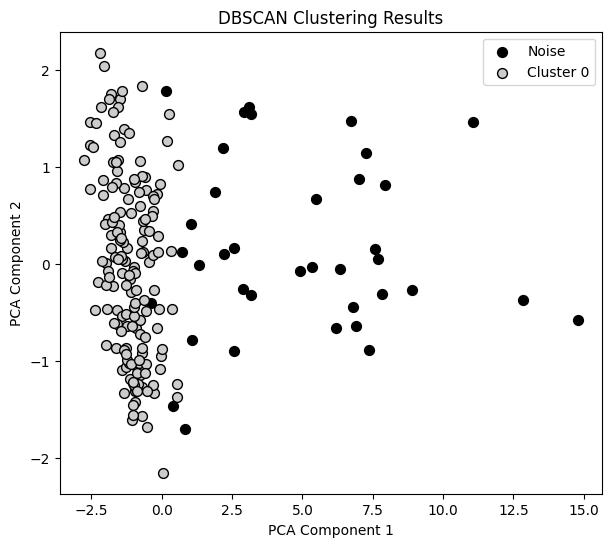

eps:  1.8
mins:  11


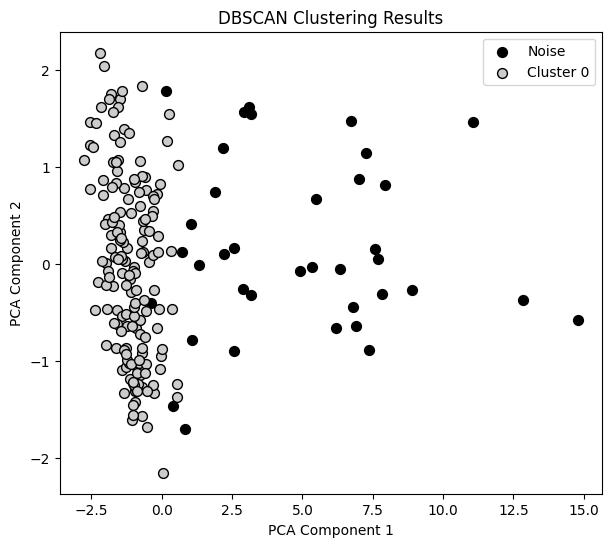

eps:  1.8
mins:  12


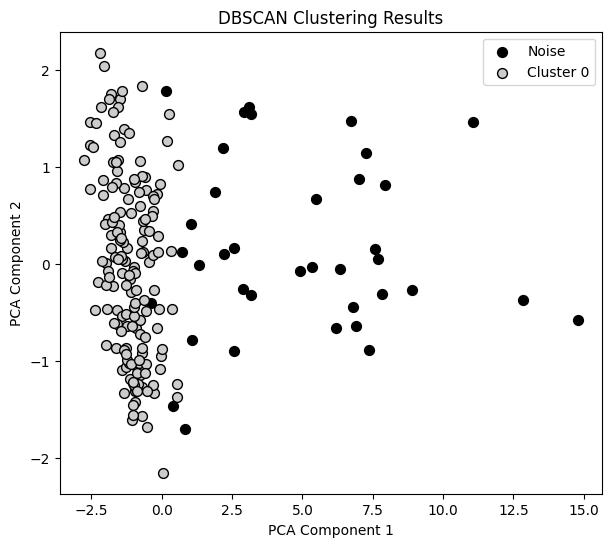

eps:  1.8
mins:  13


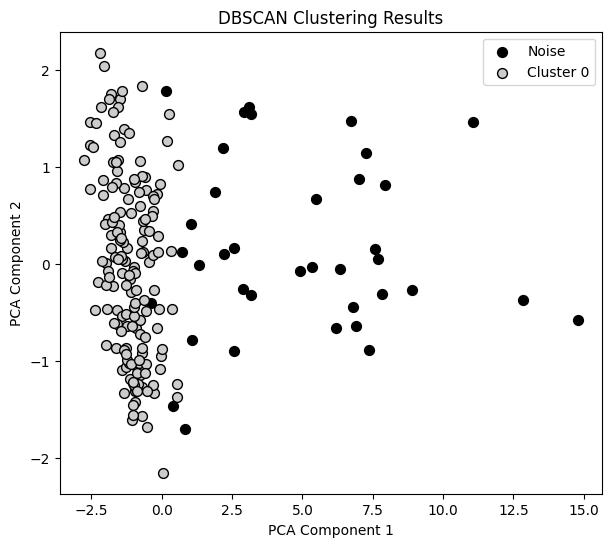

eps:  1.8
mins:  14


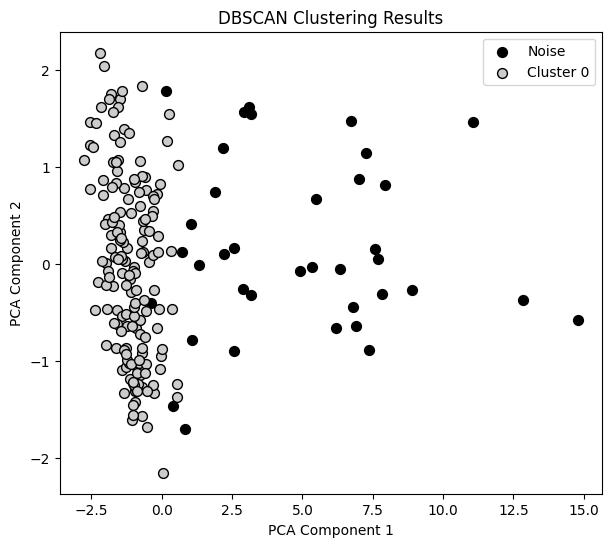

eps:  1.8
mins:  15


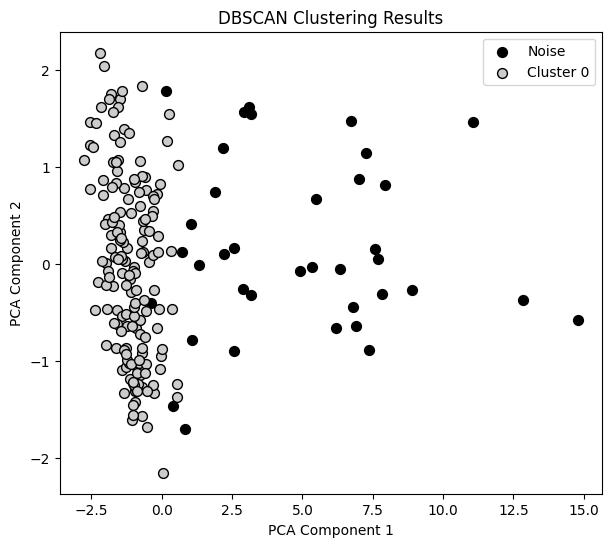

eps:  1.8
mins:  16


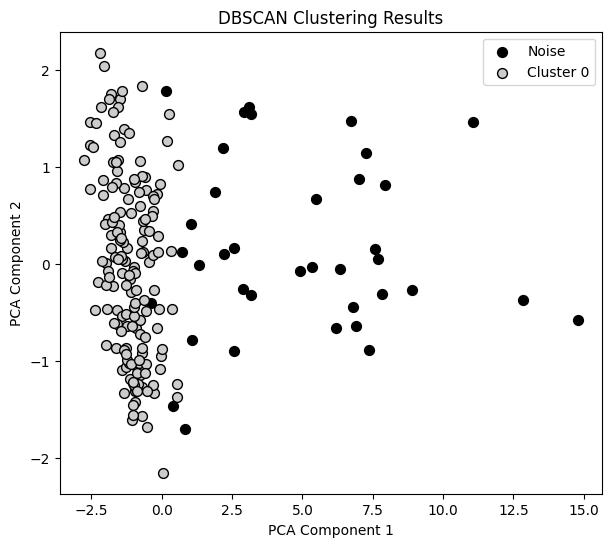

eps:  1.8
mins:  17


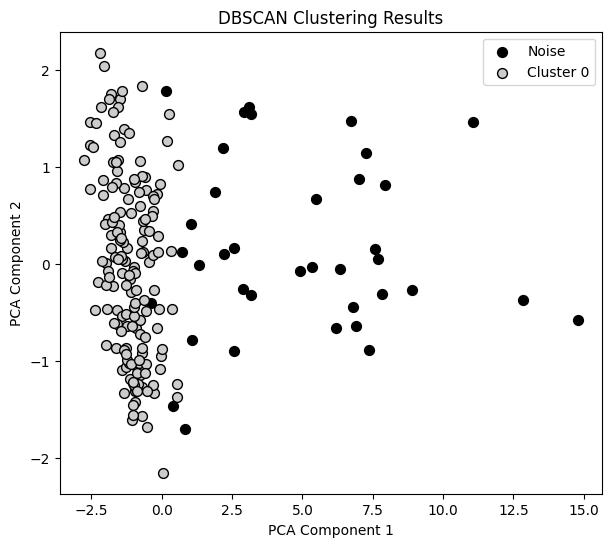

eps:  1.8
mins:  18


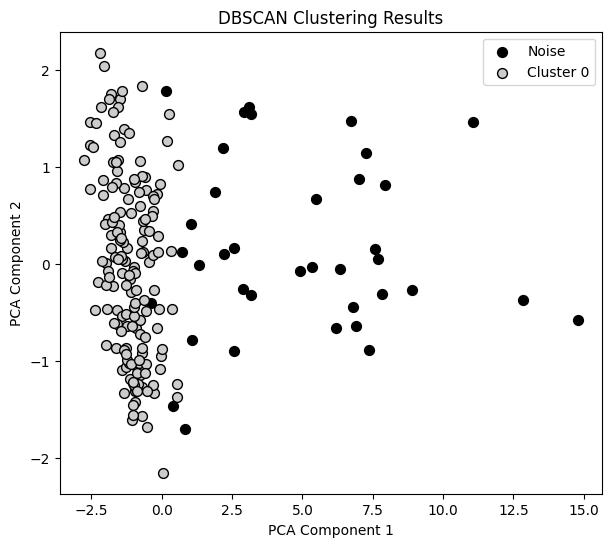

eps:  1.8
mins:  19


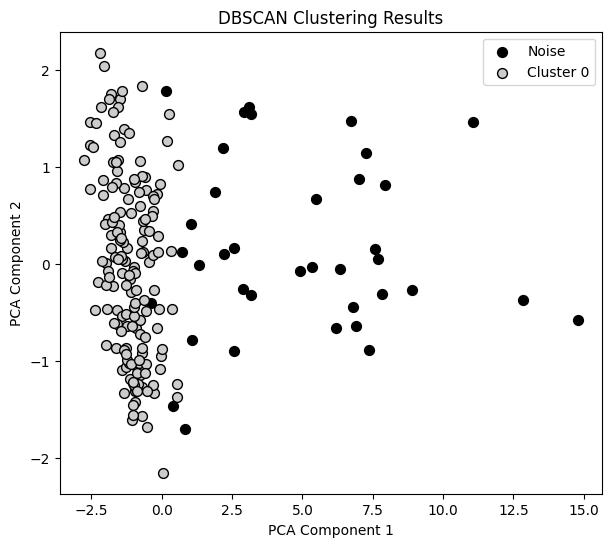

eps:  1.8
mins:  20


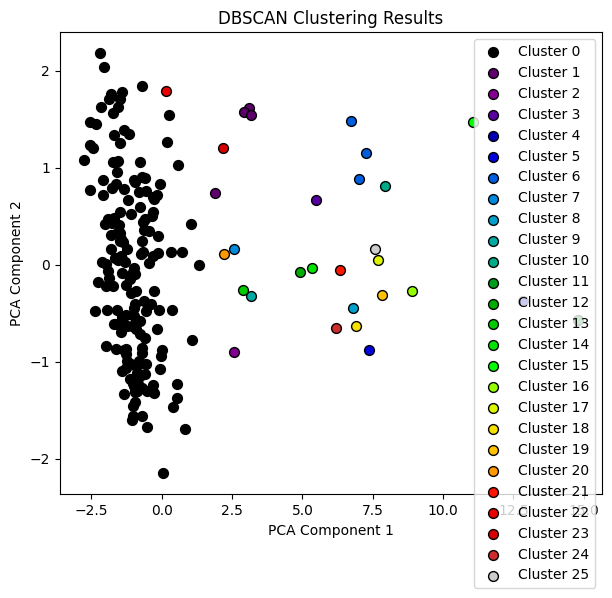

eps:  1.9
mins:  1


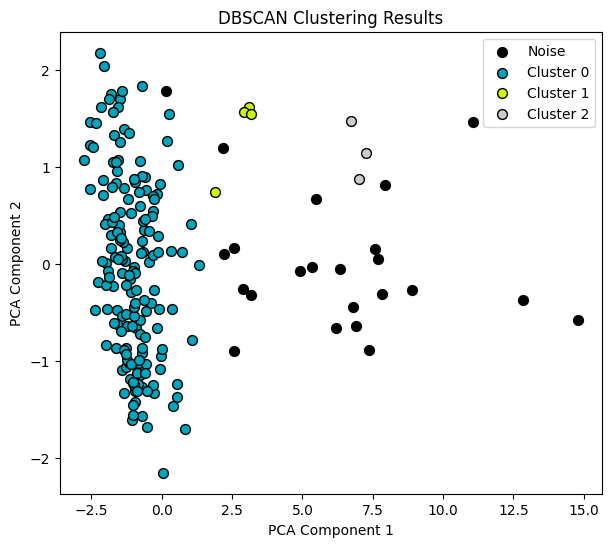

eps:  1.9
mins:  2


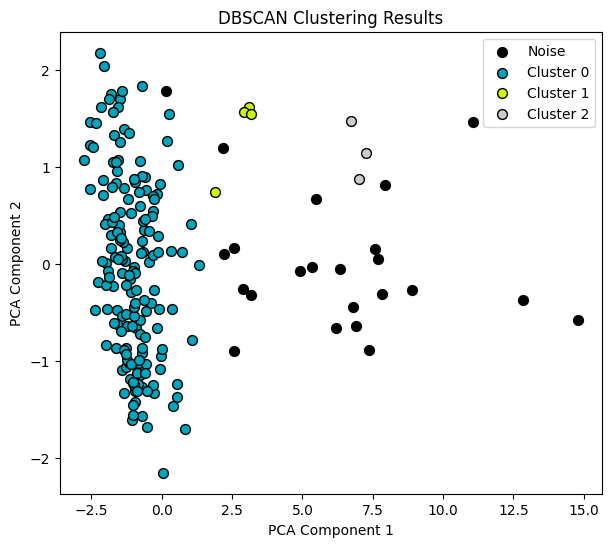

eps:  1.9
mins:  3


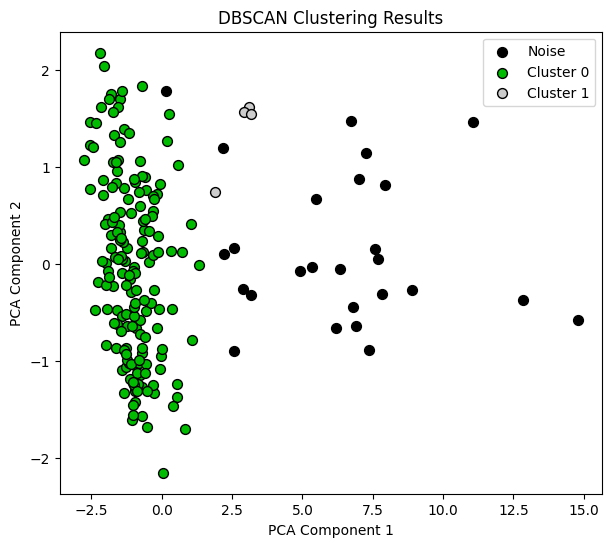

eps:  1.9
mins:  4


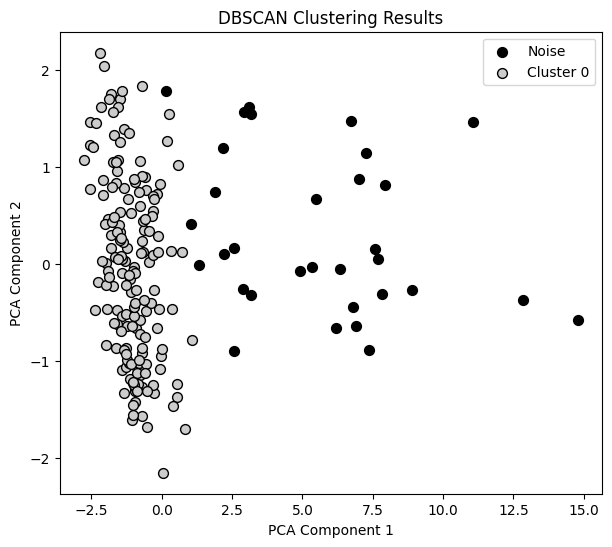

eps:  1.9
mins:  5


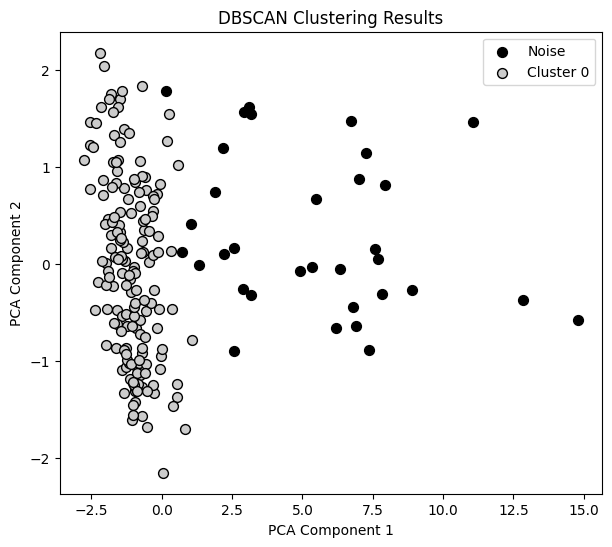

eps:  1.9
mins:  6


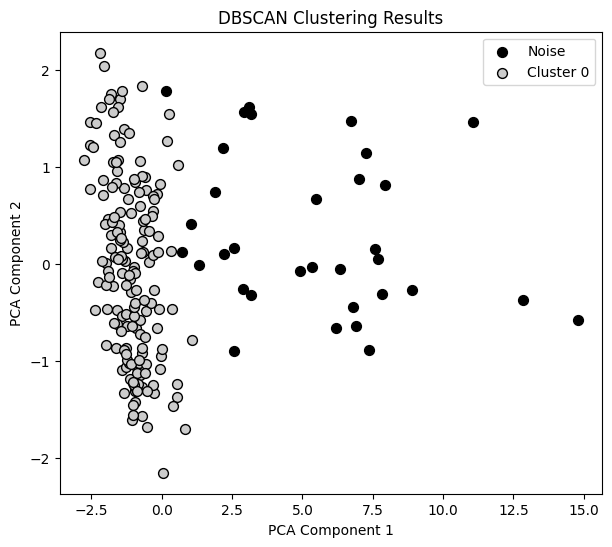

eps:  1.9
mins:  7


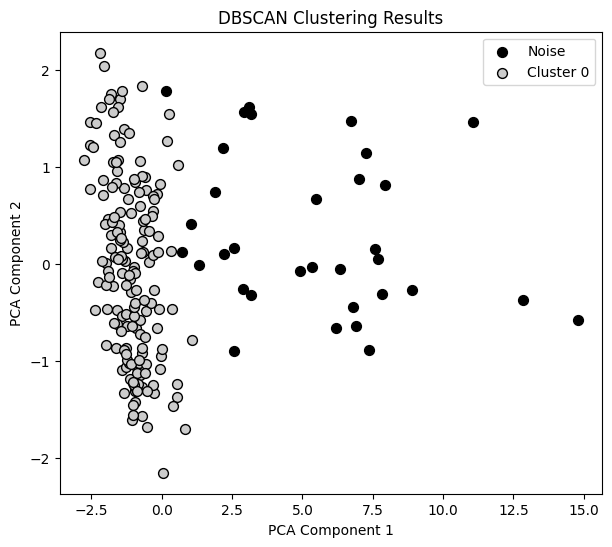

eps:  1.9
mins:  8


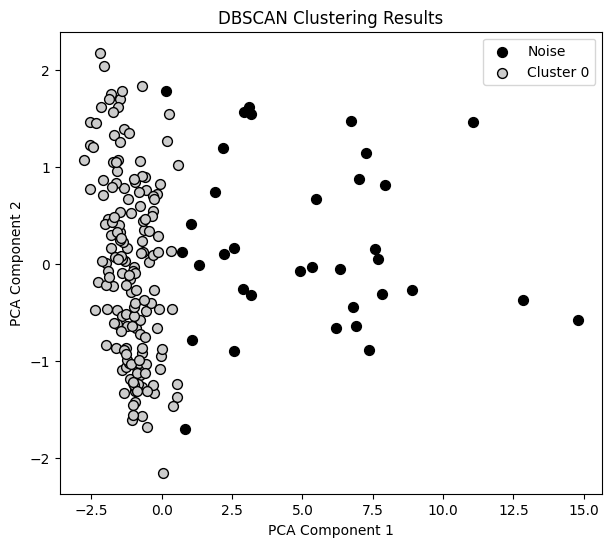

eps:  1.9
mins:  9


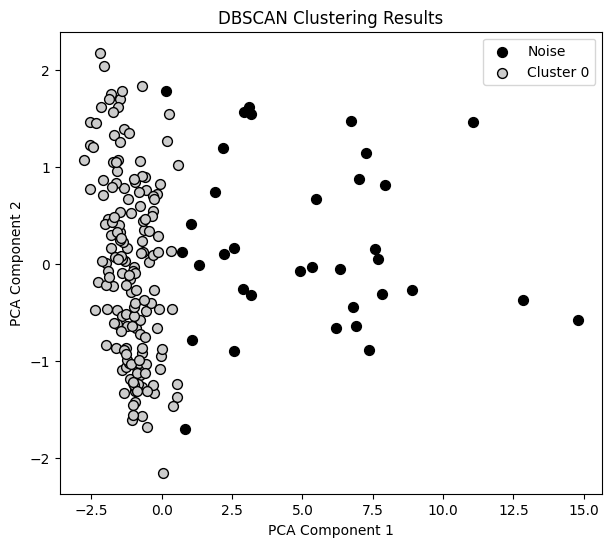

eps:  1.9
mins:  10


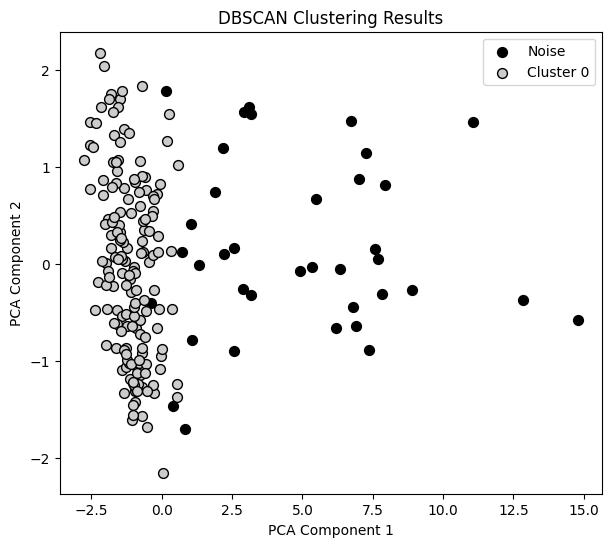

eps:  1.9
mins:  11


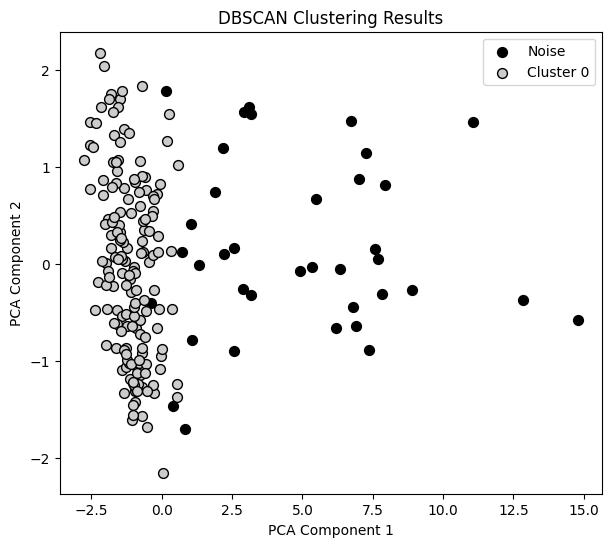

eps:  1.9
mins:  12


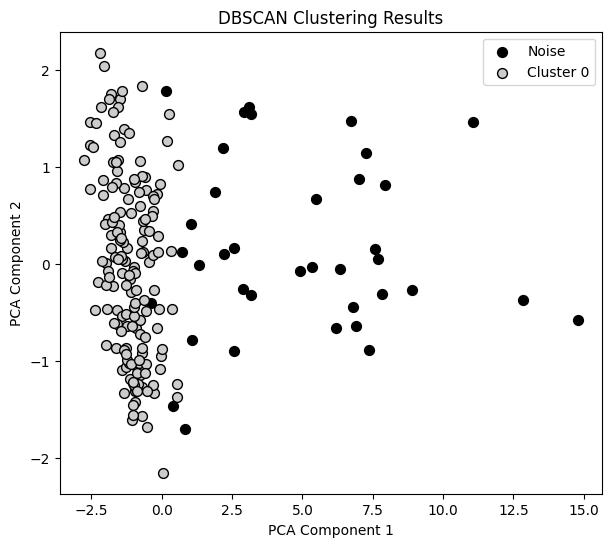

eps:  1.9
mins:  13


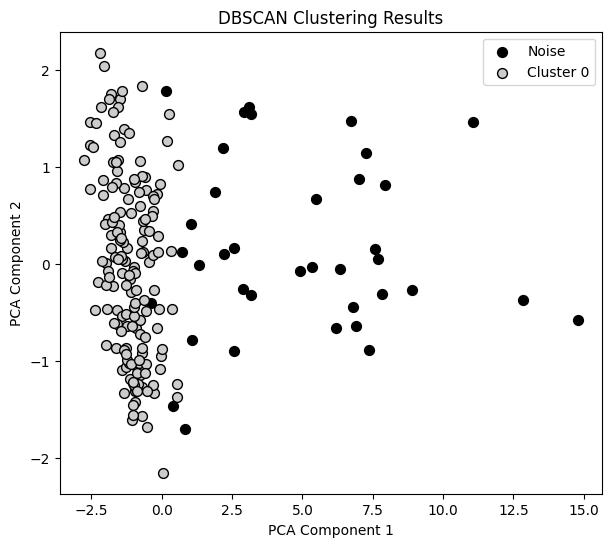

eps:  1.9
mins:  14


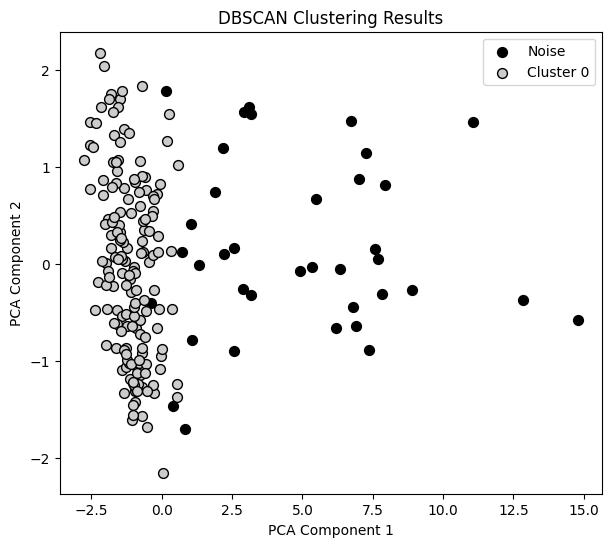

eps:  1.9
mins:  15


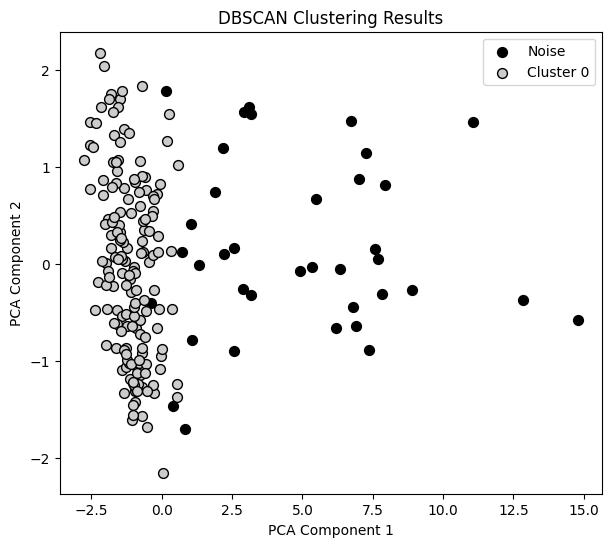

eps:  1.9
mins:  16


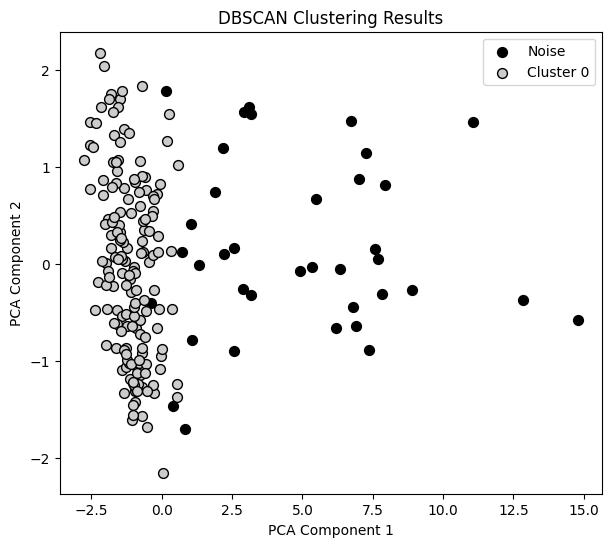

eps:  1.9
mins:  17


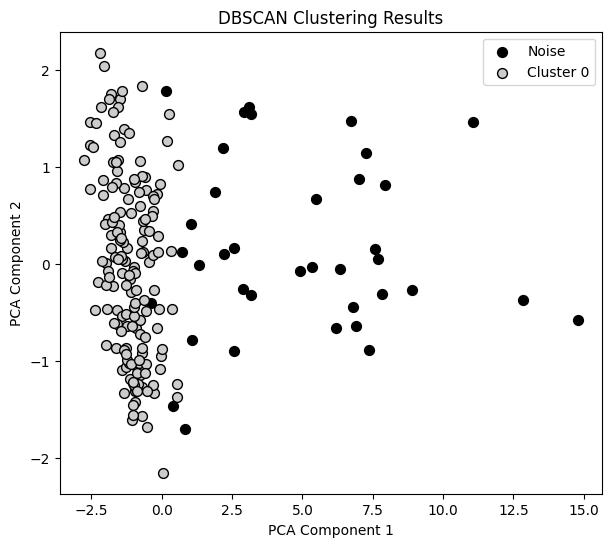

eps:  1.9
mins:  18


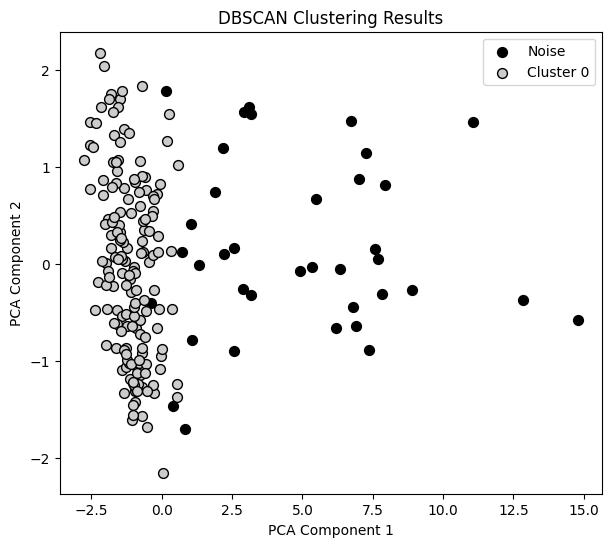

eps:  1.9
mins:  19


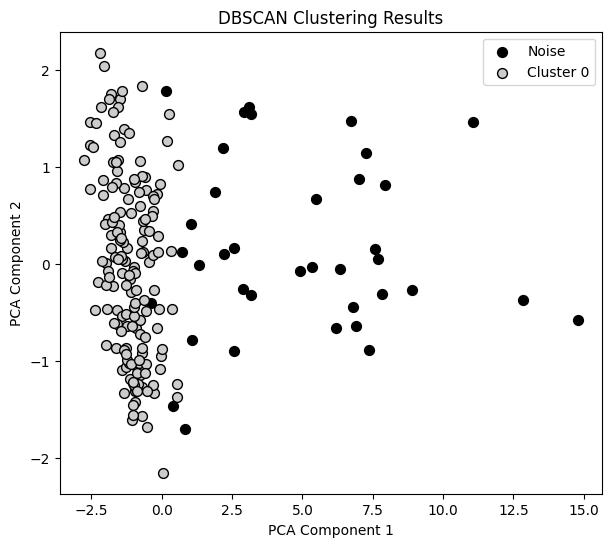

eps:  1.9
mins:  20


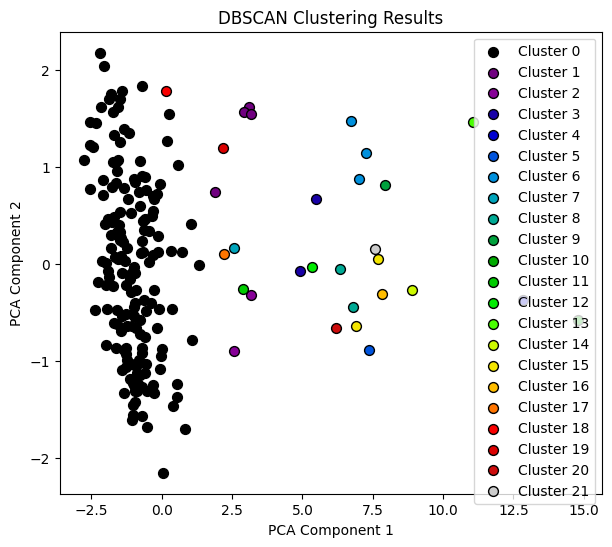

eps:  2
mins:  1


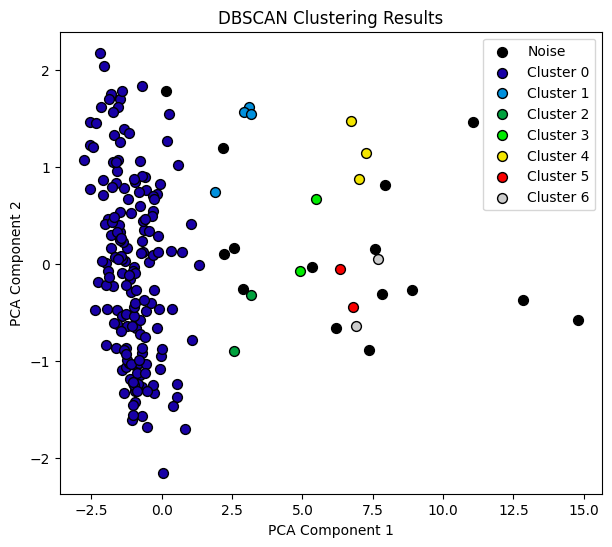

eps:  2
mins:  2


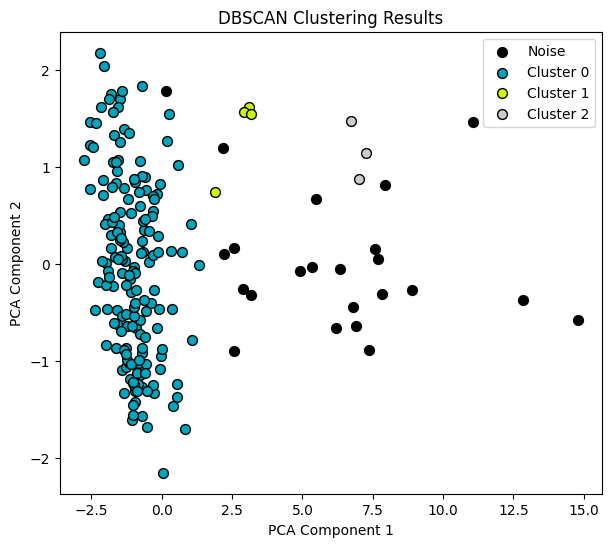

eps:  2
mins:  3


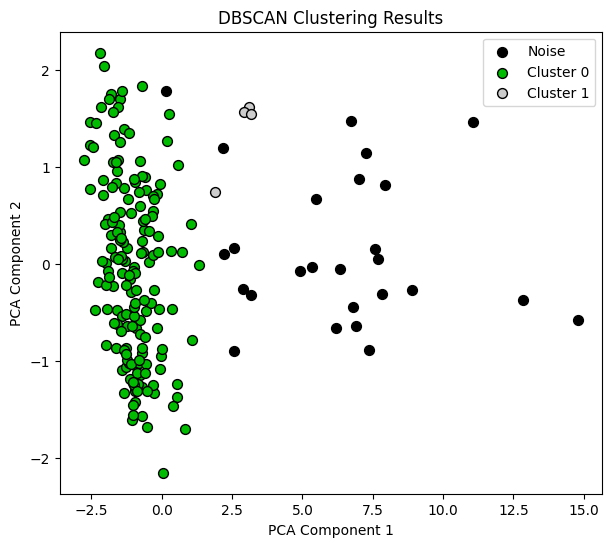

eps:  2
mins:  4


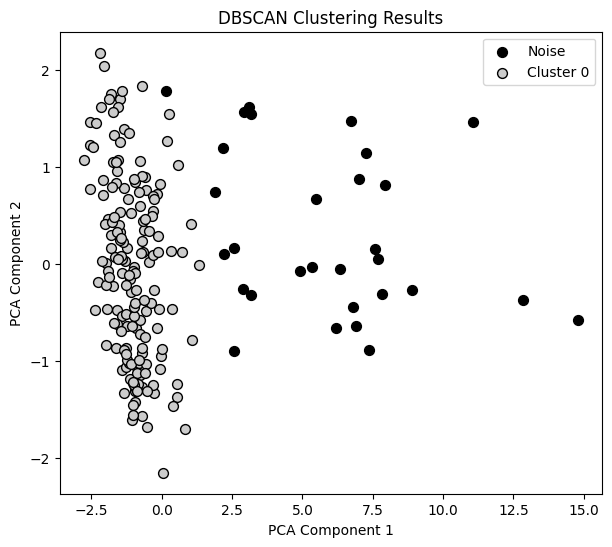

eps:  2
mins:  5


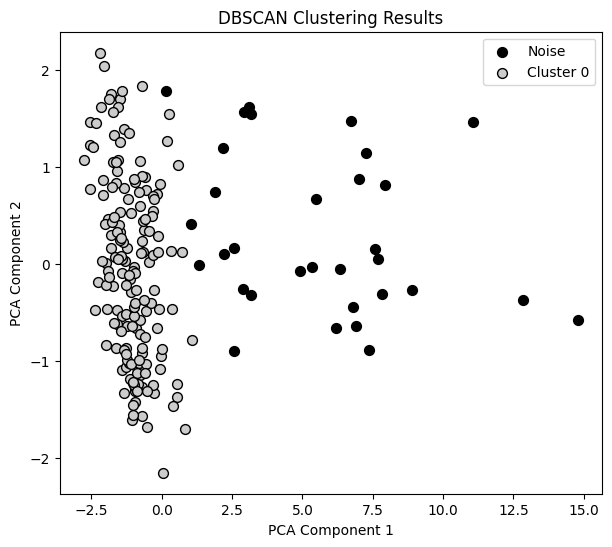

eps:  2
mins:  6


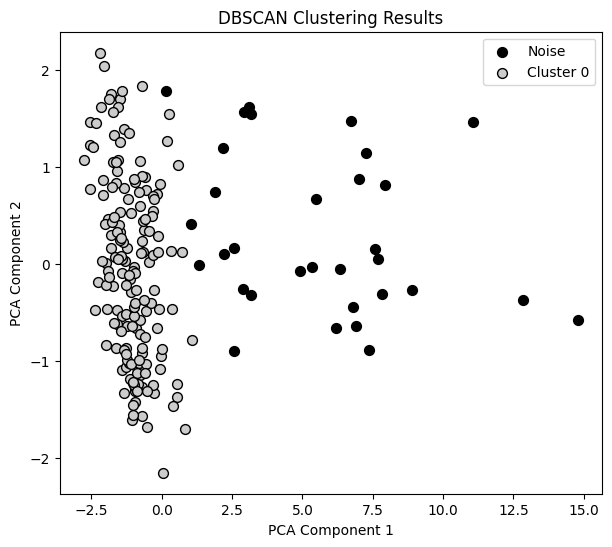

eps:  2
mins:  7


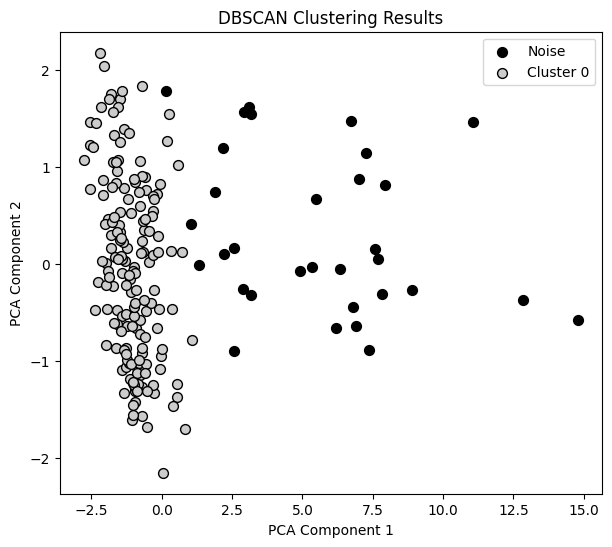

eps:  2
mins:  8


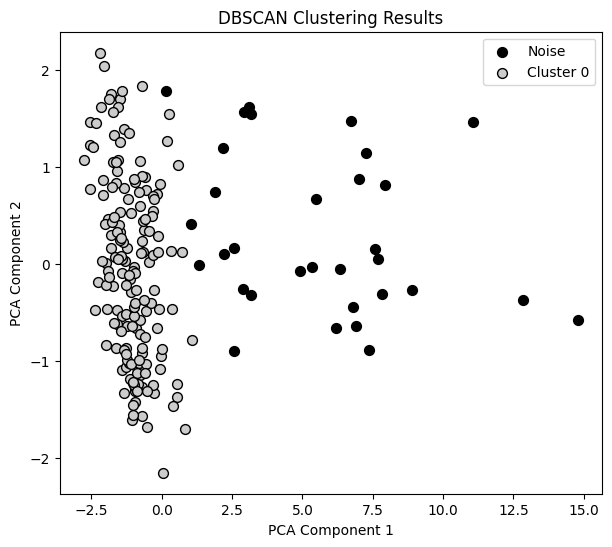

eps:  2
mins:  9


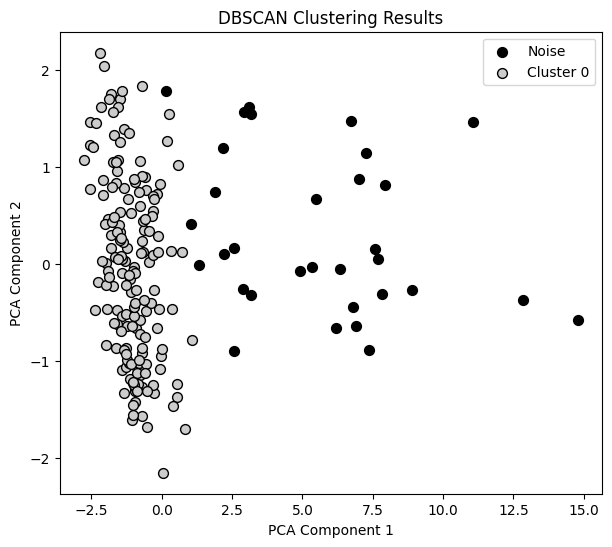

eps:  2
mins:  10


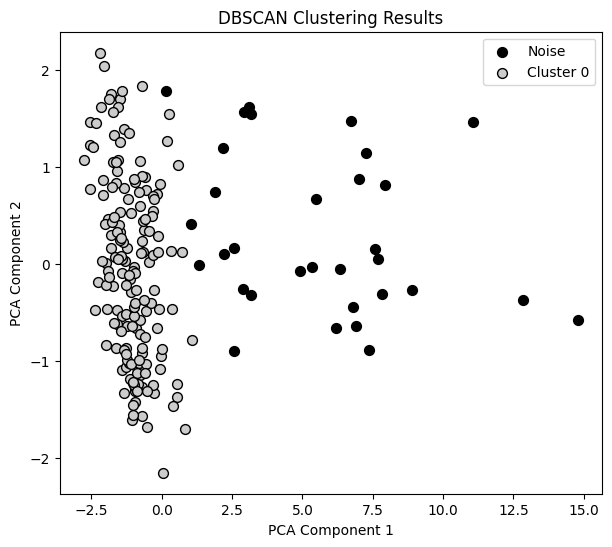

eps:  2
mins:  11


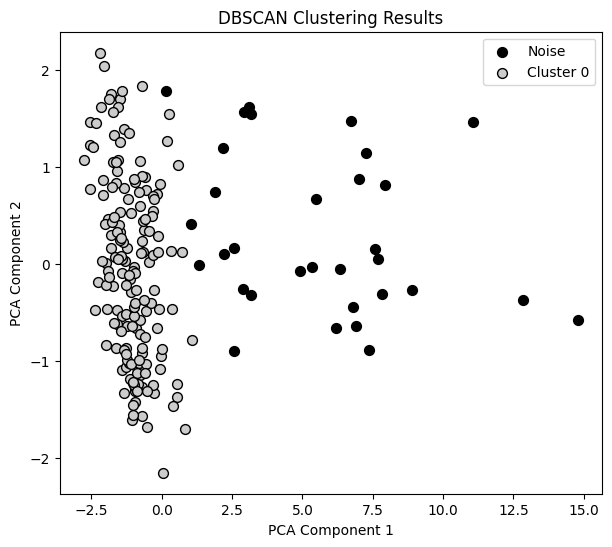

eps:  2
mins:  12


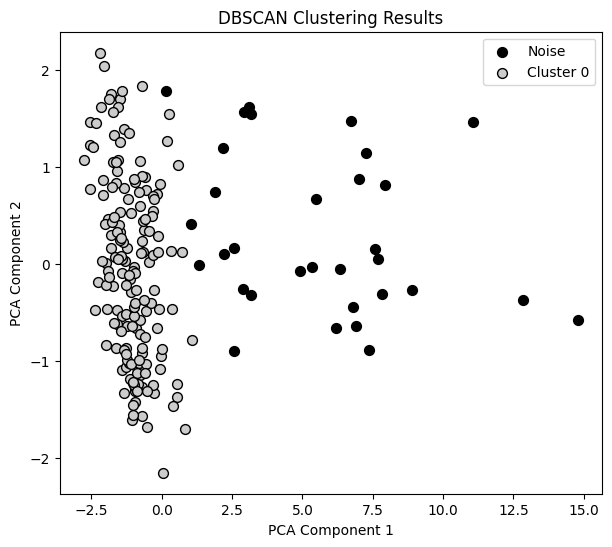

eps:  2
mins:  13


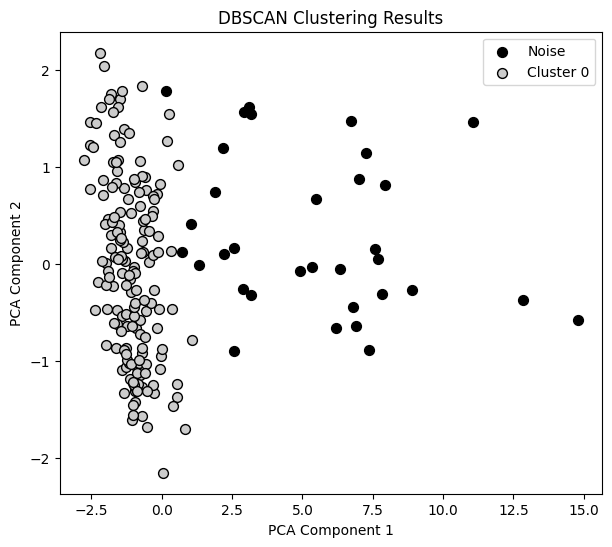

eps:  2
mins:  14


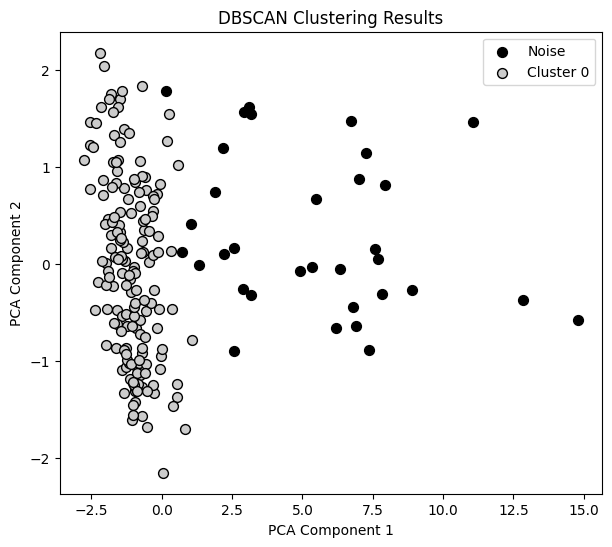

eps:  2
mins:  15


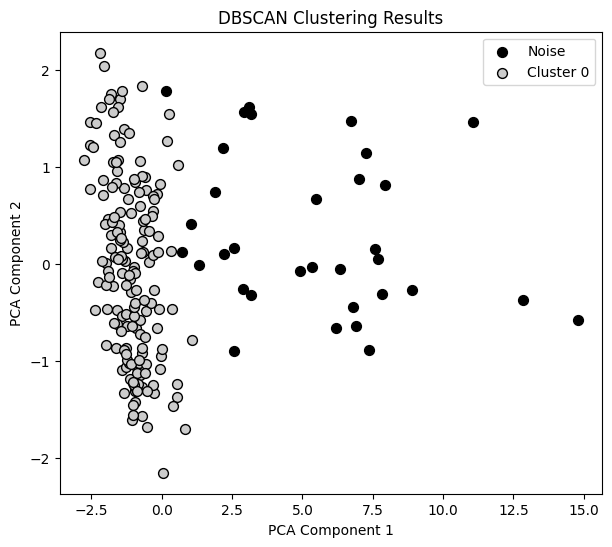

eps:  2
mins:  16


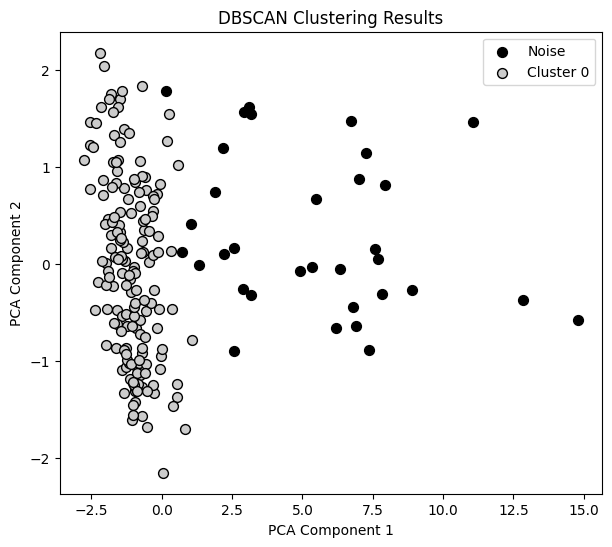

eps:  2
mins:  17


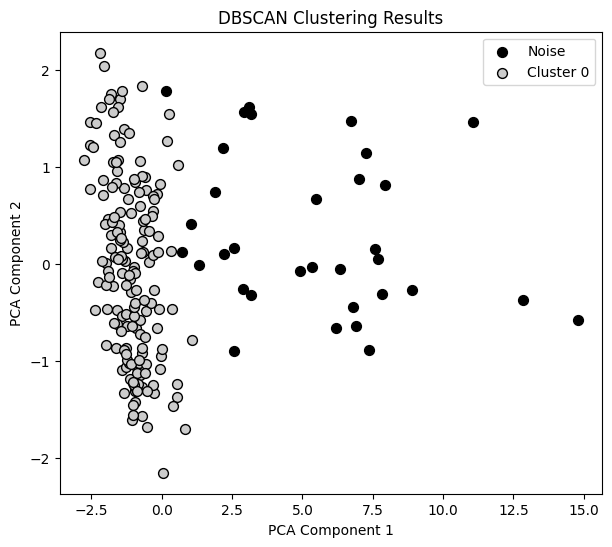

eps:  2
mins:  18


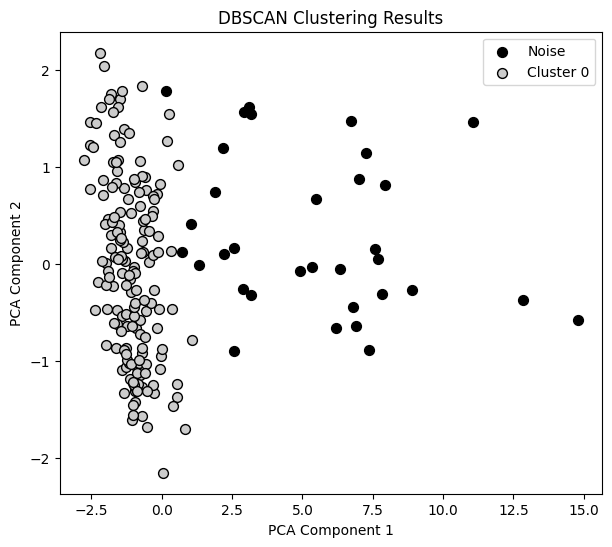

eps:  2
mins:  19


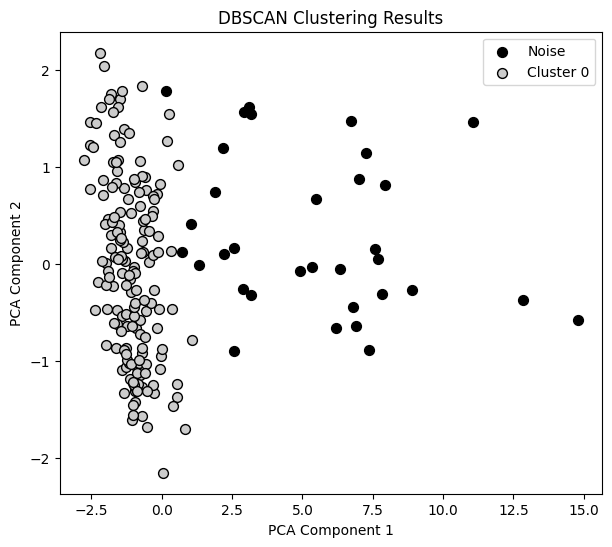

eps:  2
mins:  20


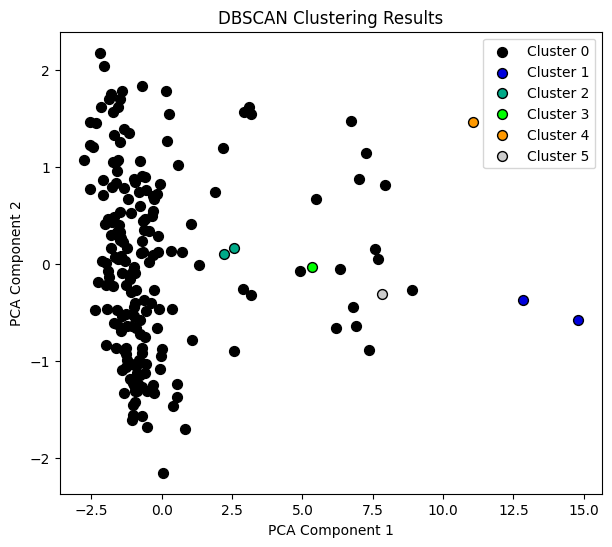

eps:  3
mins:  1


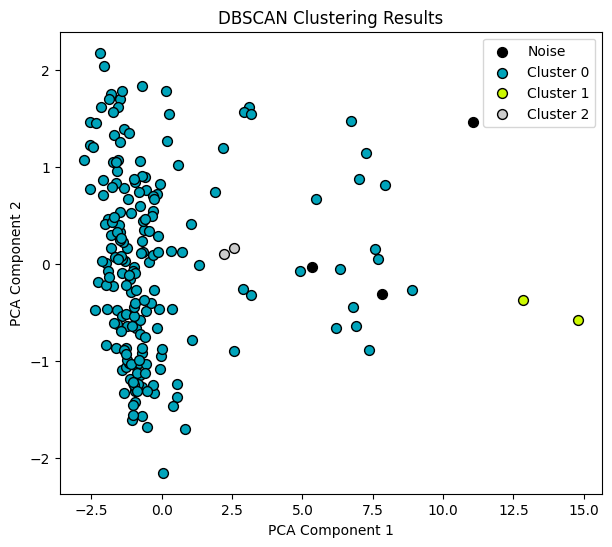

eps:  3
mins:  2


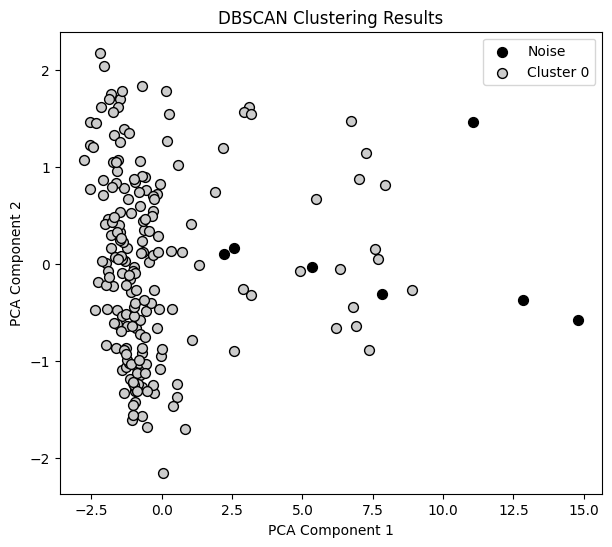

eps:  3
mins:  3


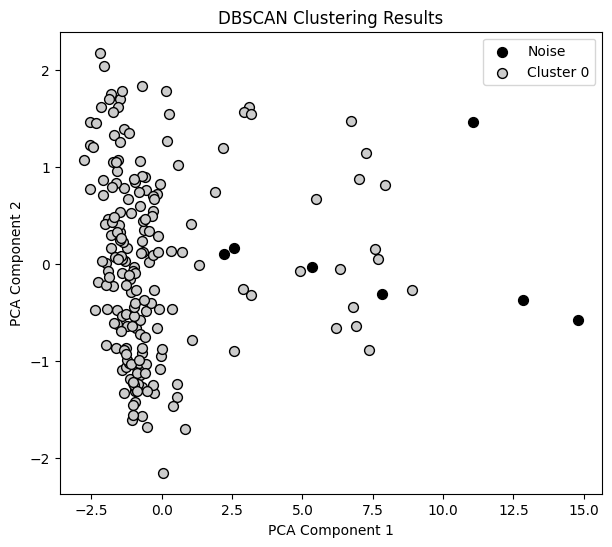

eps:  3
mins:  4


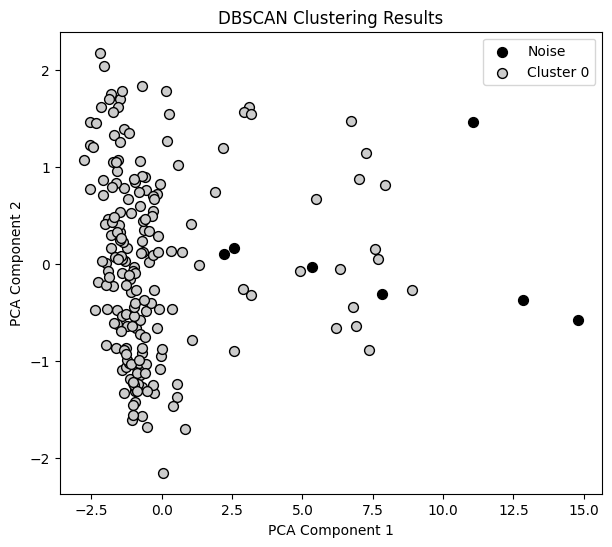

eps:  3
mins:  5


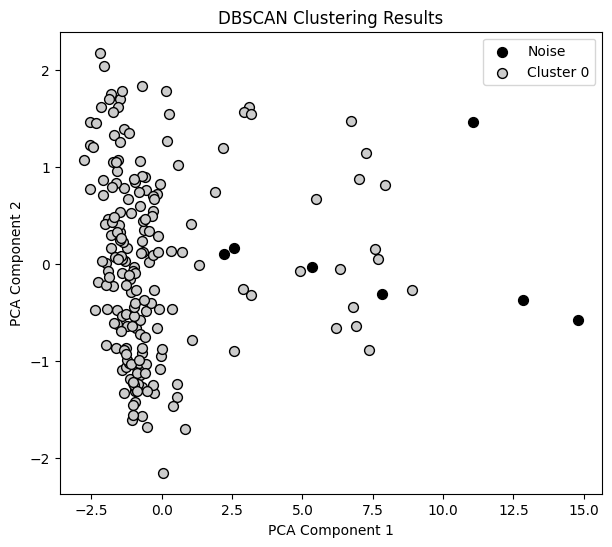

eps:  3
mins:  6


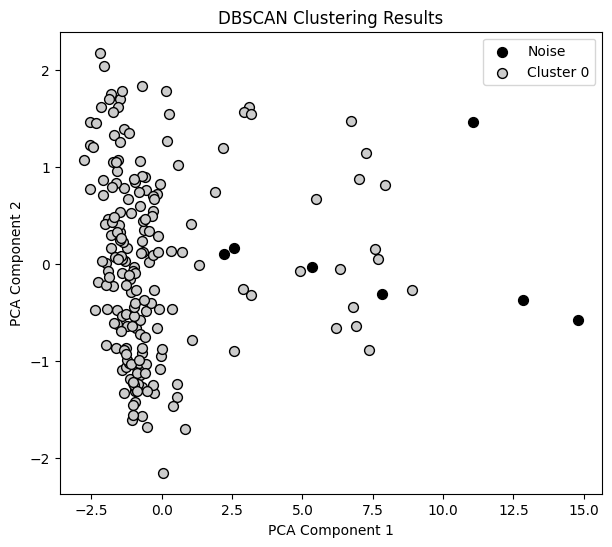

eps:  3
mins:  7


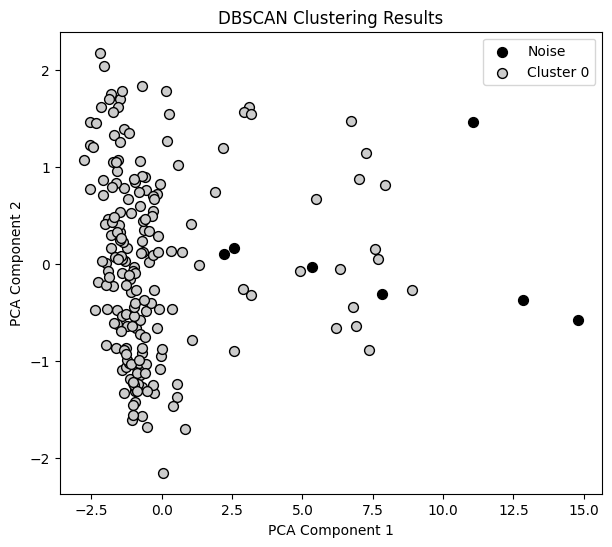

eps:  3
mins:  8


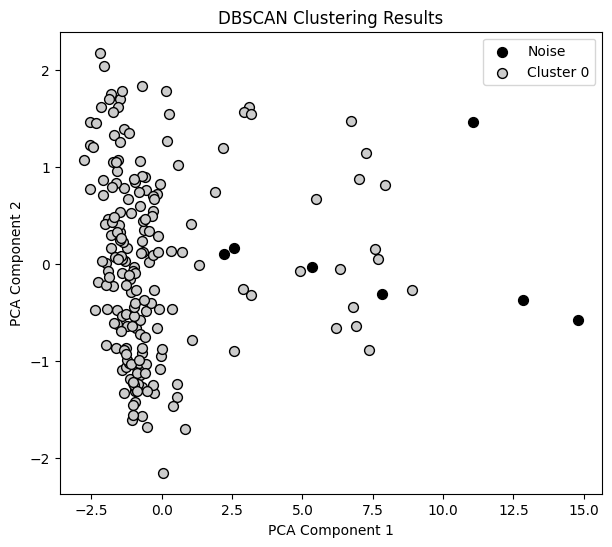

eps:  3
mins:  9


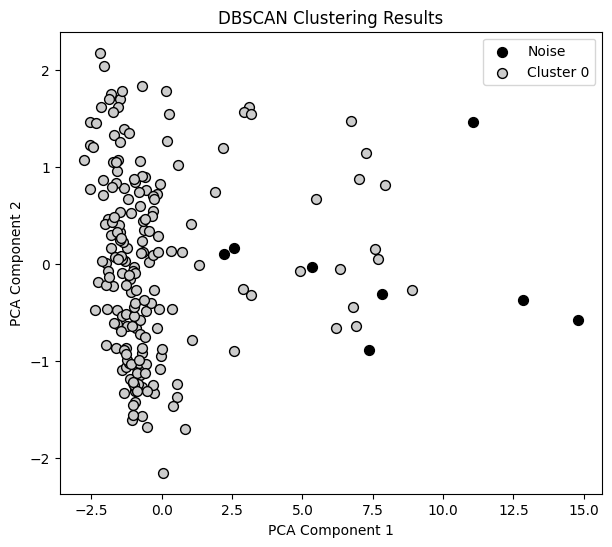

eps:  3
mins:  10


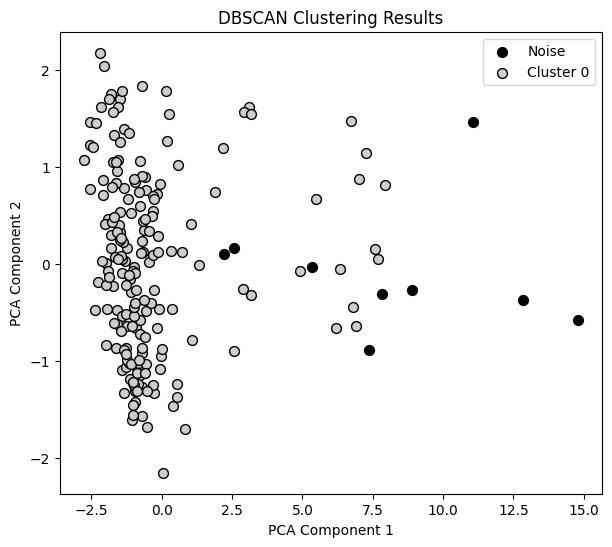

eps:  3
mins:  11


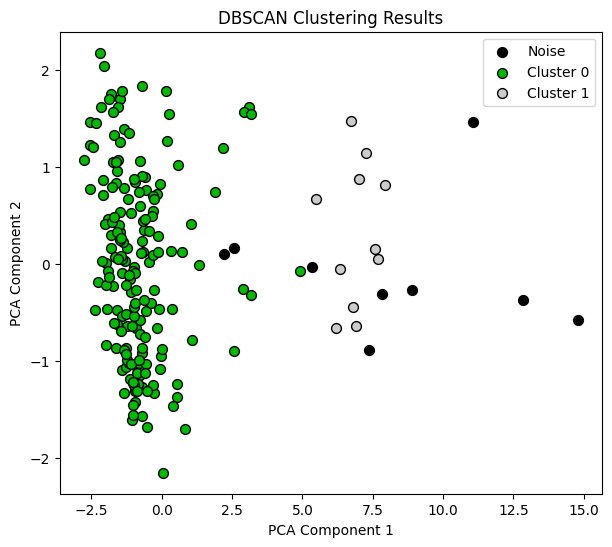

eps:  3
mins:  12


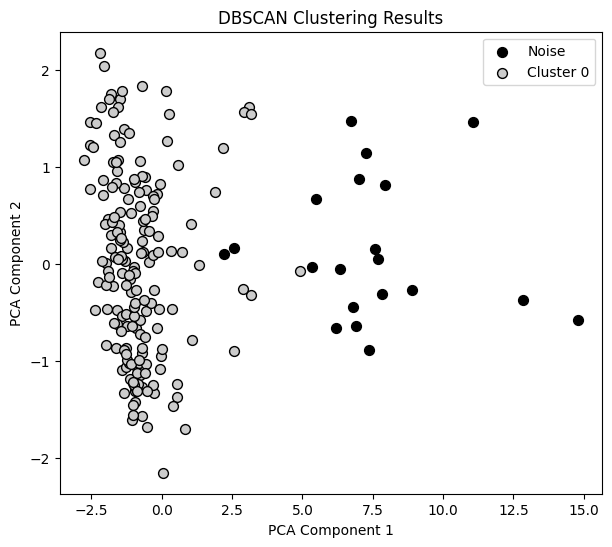

eps:  3
mins:  13


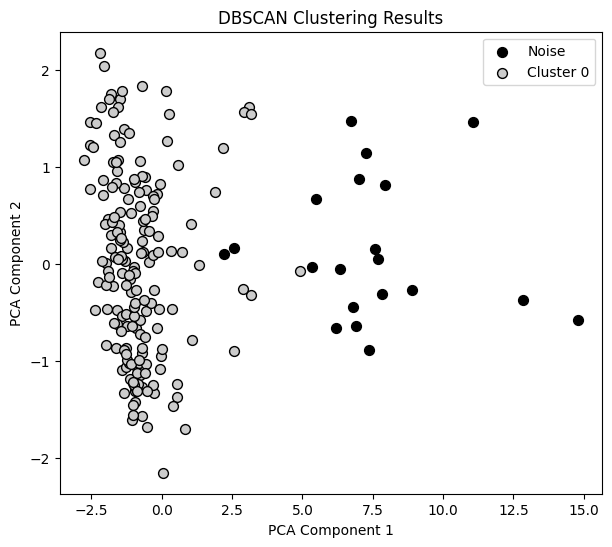

eps:  3
mins:  14


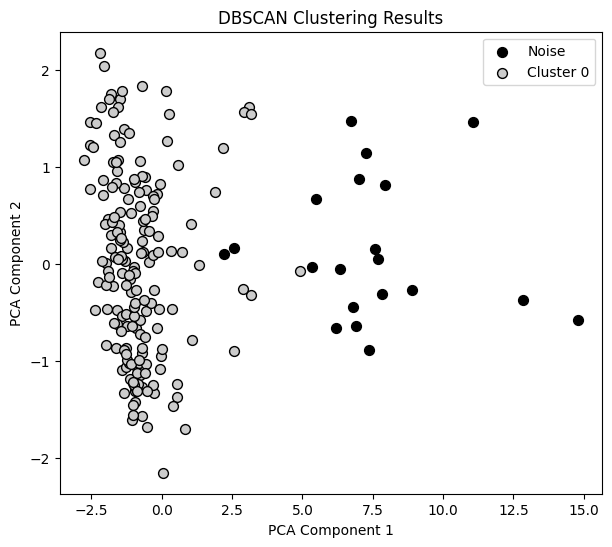

eps:  3
mins:  15


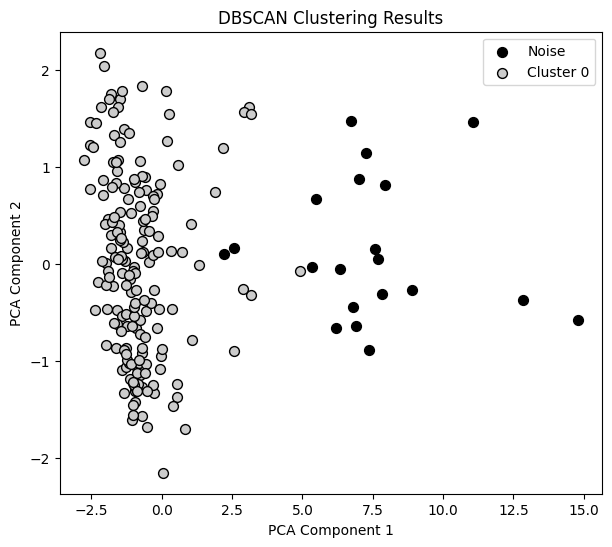

eps:  3
mins:  16


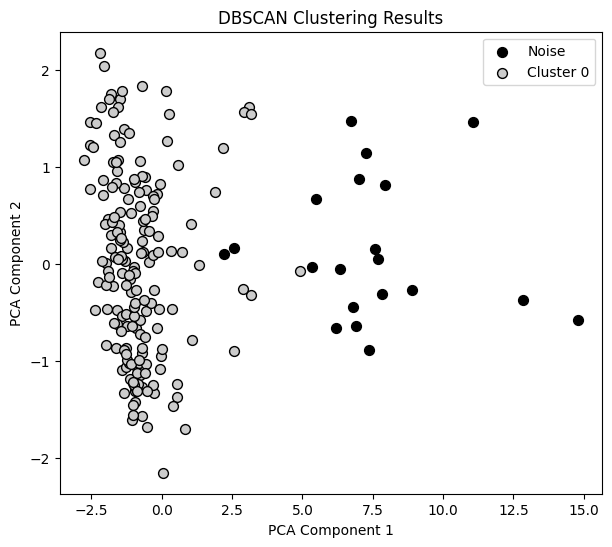

eps:  3
mins:  17


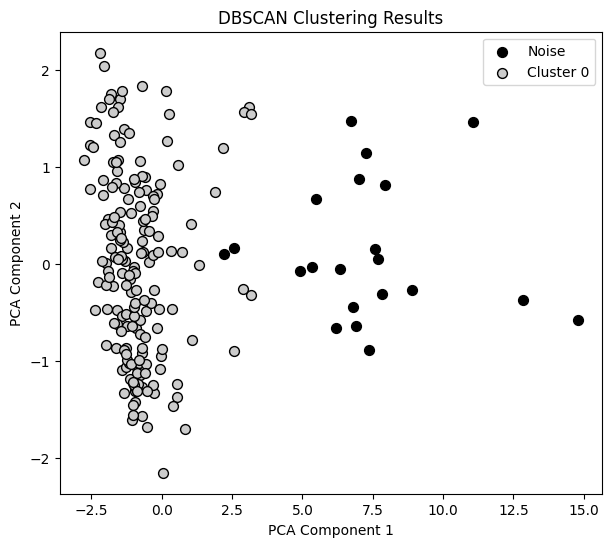

eps:  3
mins:  18


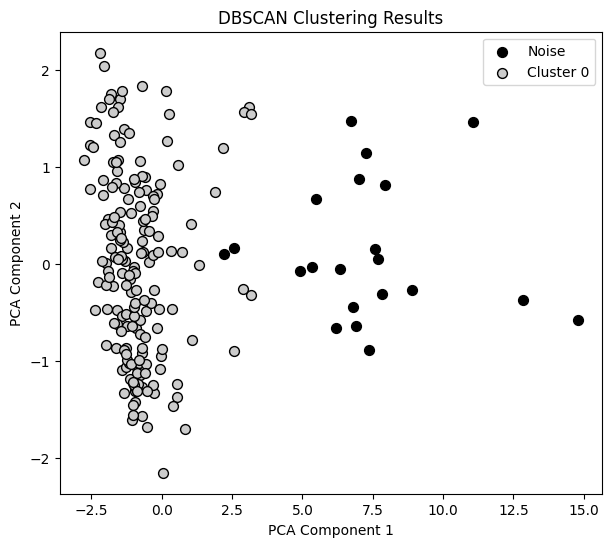

eps:  3
mins:  19


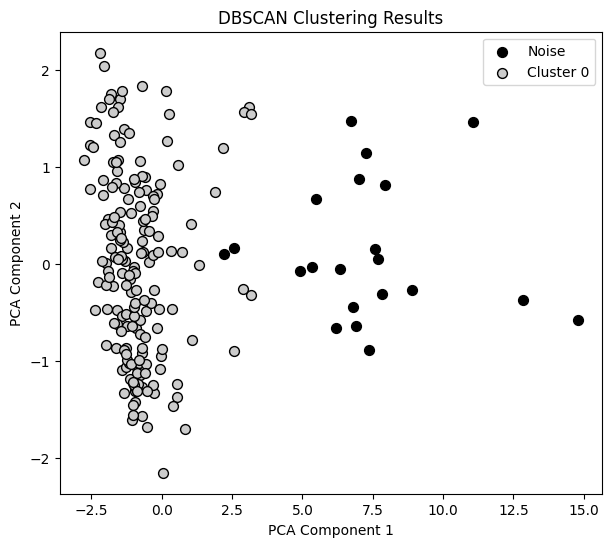

eps:  3
mins:  20


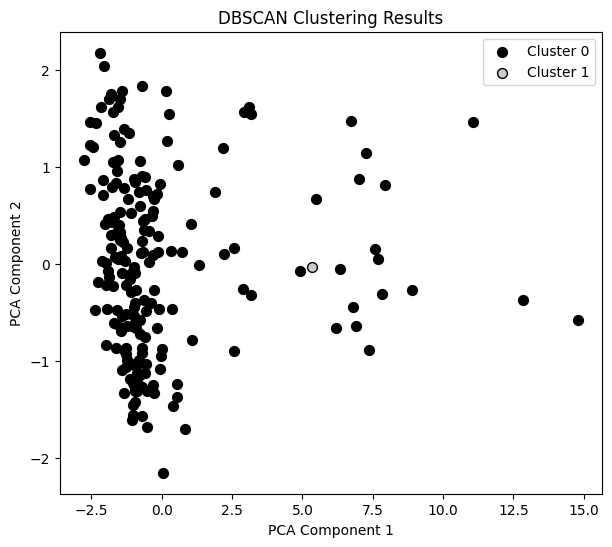

eps:  4
mins:  1


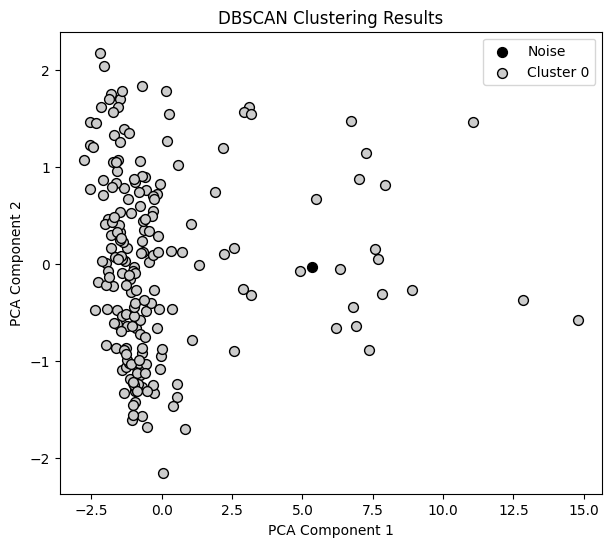

eps:  4
mins:  2


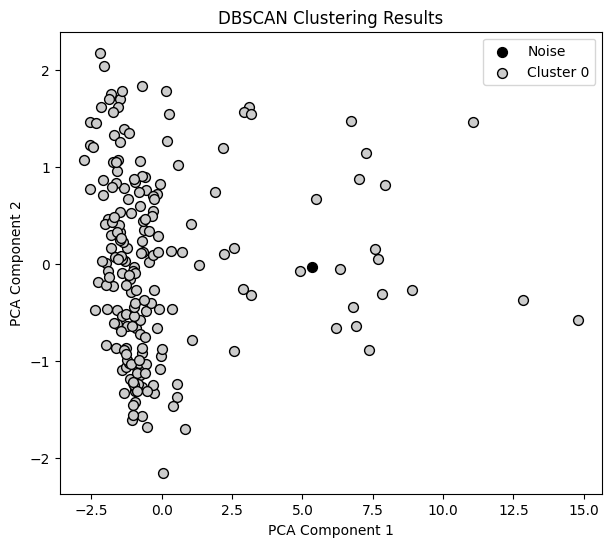

eps:  4
mins:  3


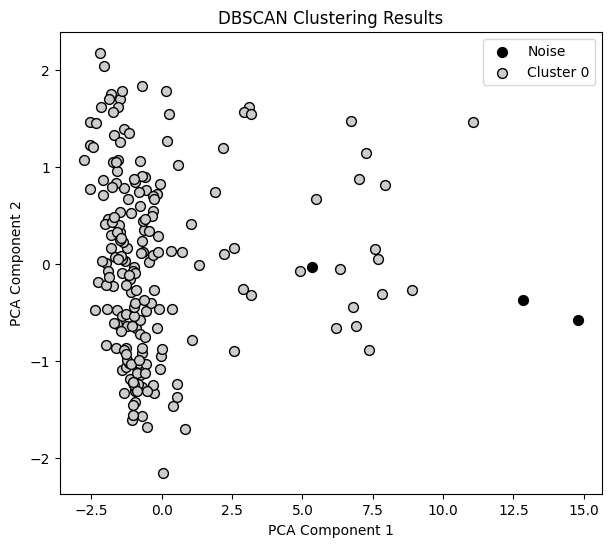

eps:  4
mins:  4


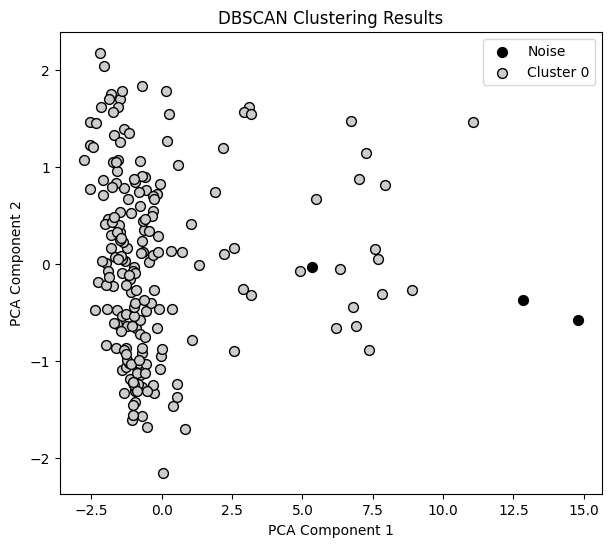

eps:  4
mins:  5


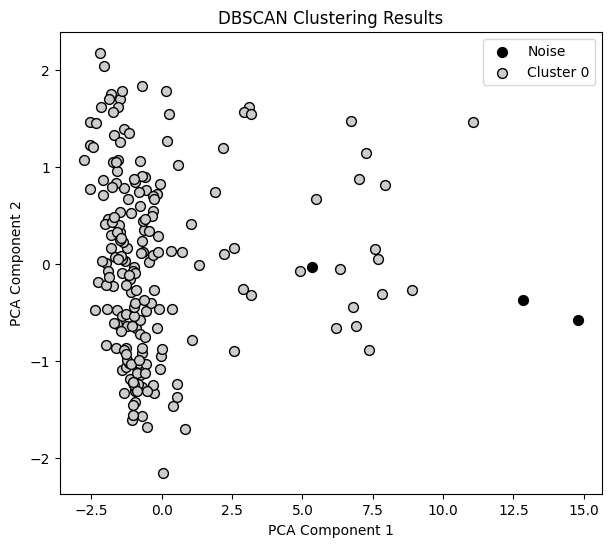

eps:  4
mins:  6


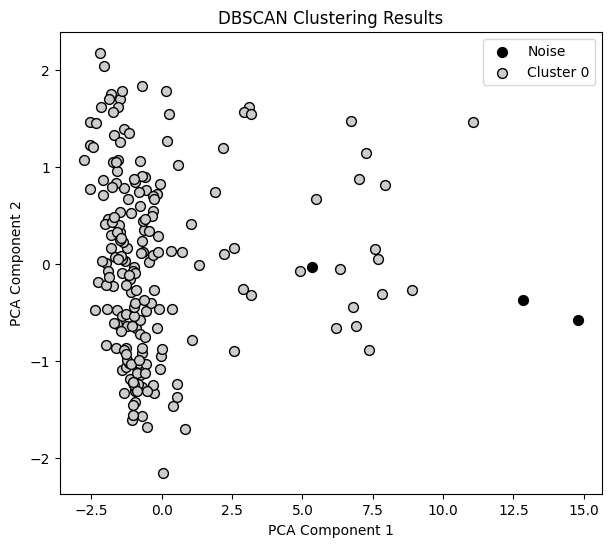

eps:  4
mins:  7


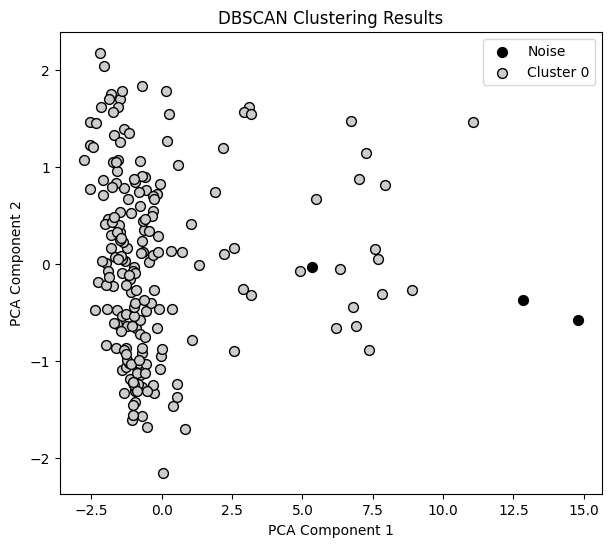

eps:  4
mins:  8


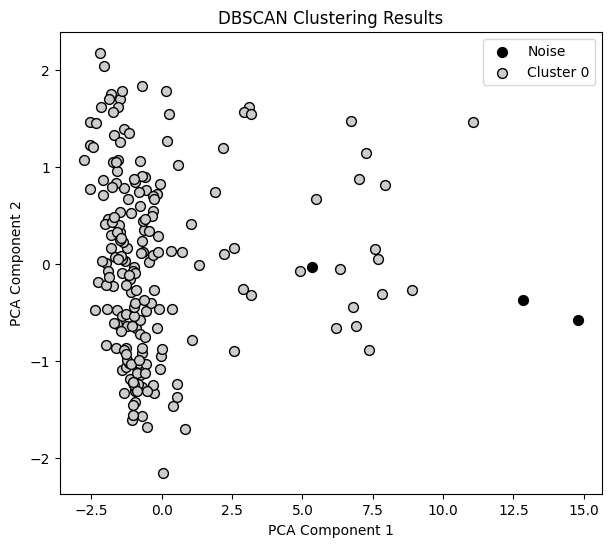

eps:  4
mins:  9


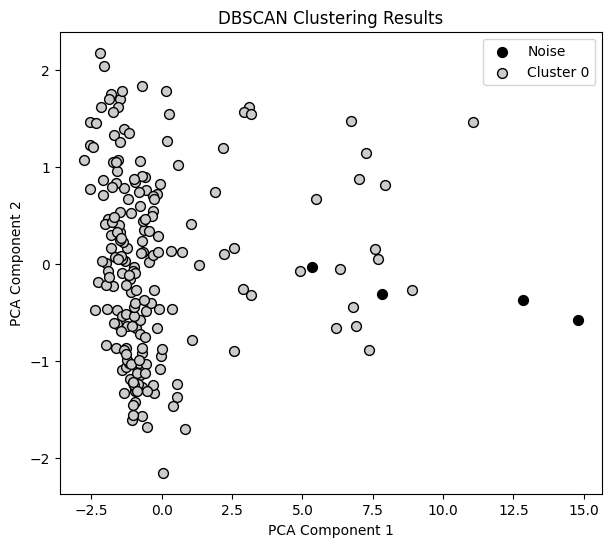

eps:  4
mins:  10


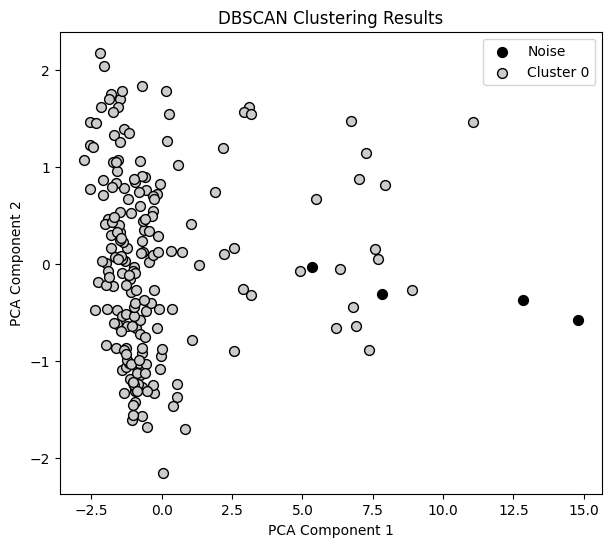

eps:  4
mins:  11


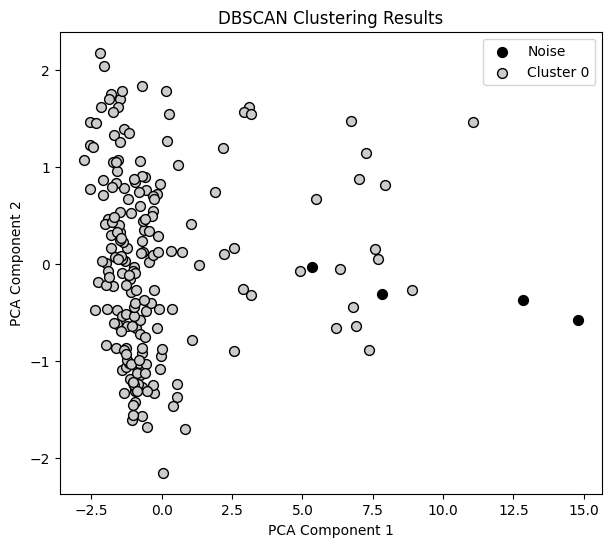

eps:  4
mins:  12


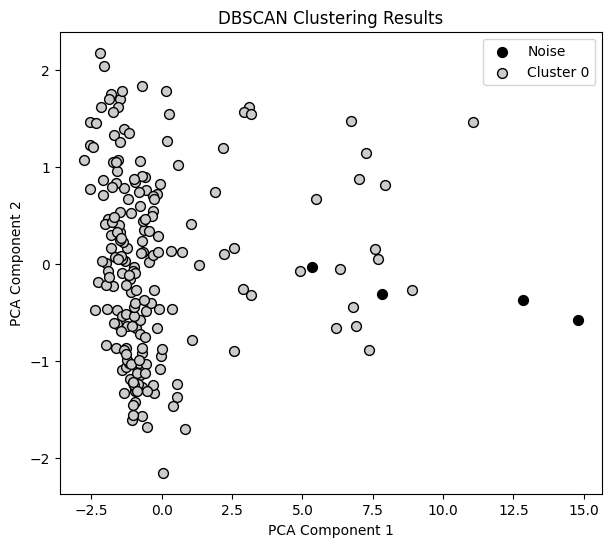

eps:  4
mins:  13


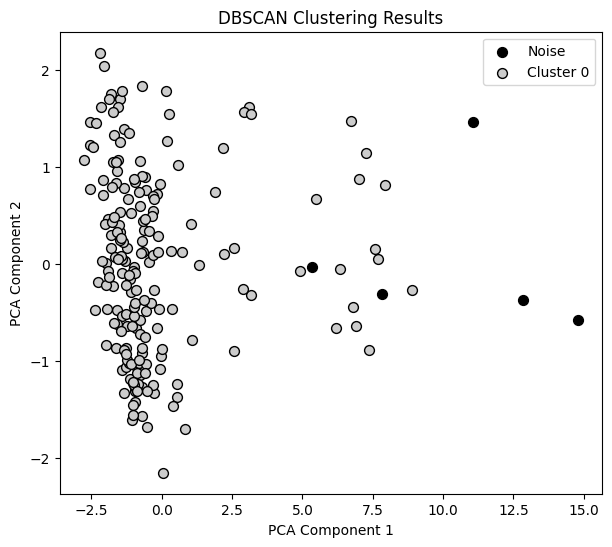

eps:  4
mins:  14


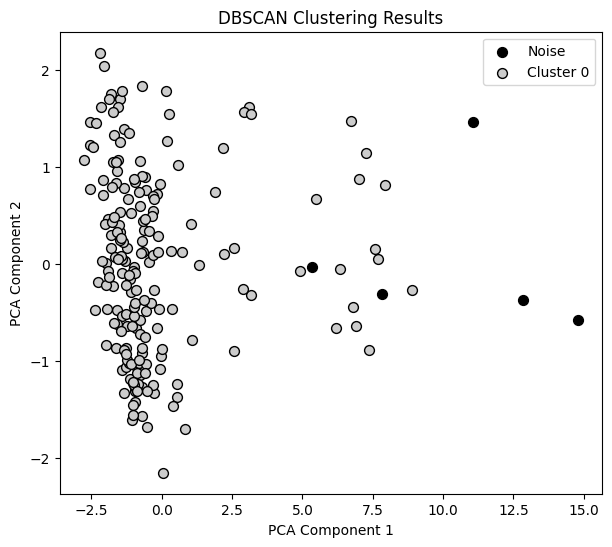

eps:  4
mins:  15


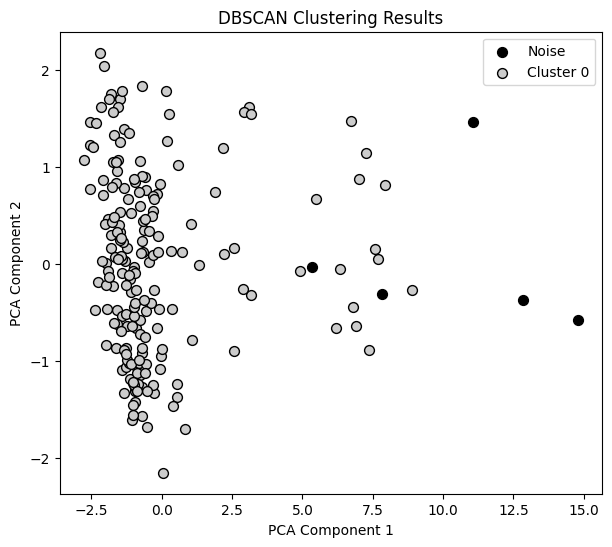

eps:  4
mins:  16


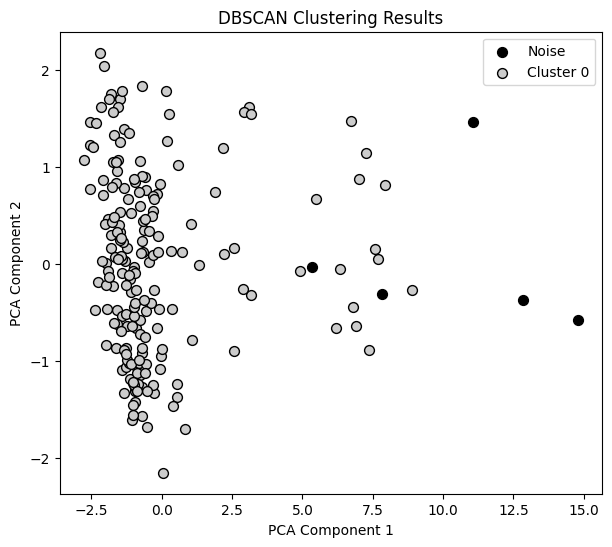

eps:  4
mins:  17


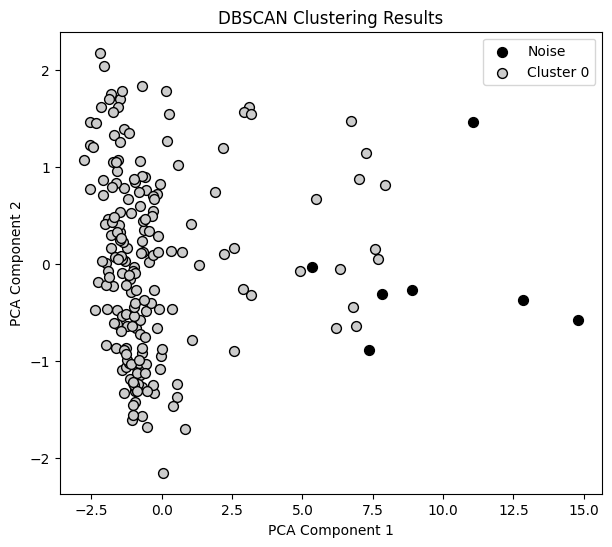

eps:  4
mins:  18


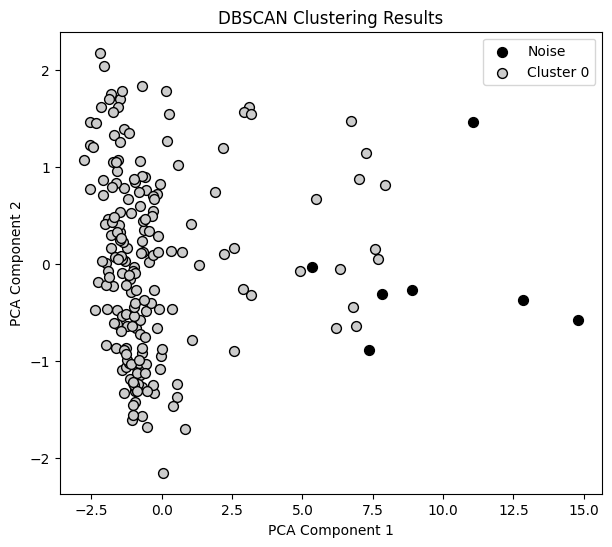

eps:  4
mins:  19


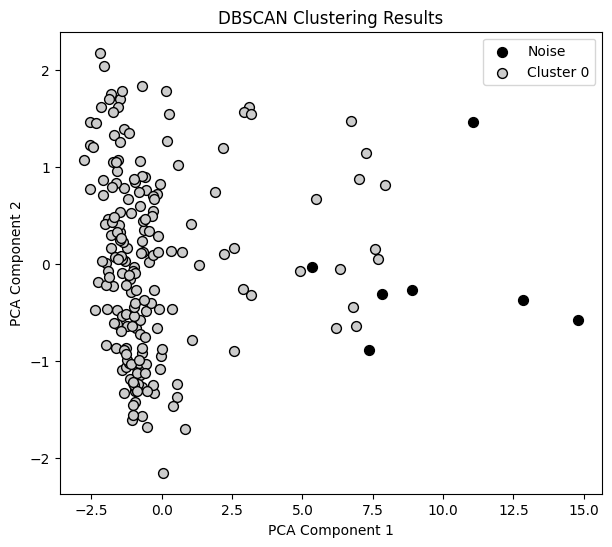

eps:  4
mins:  20


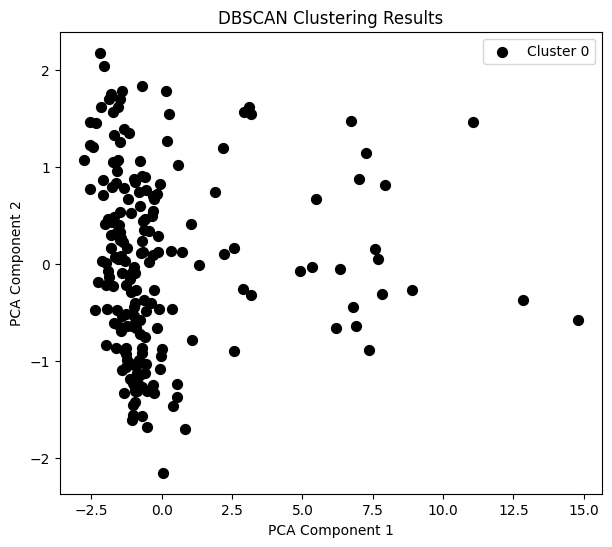

eps:  5
mins:  1


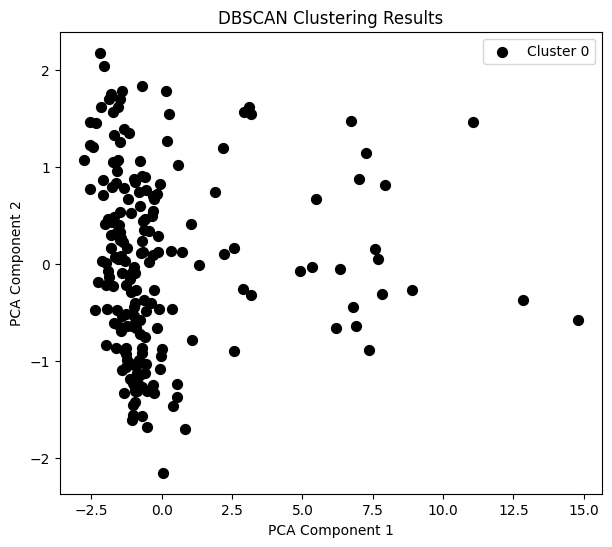

eps:  5
mins:  2


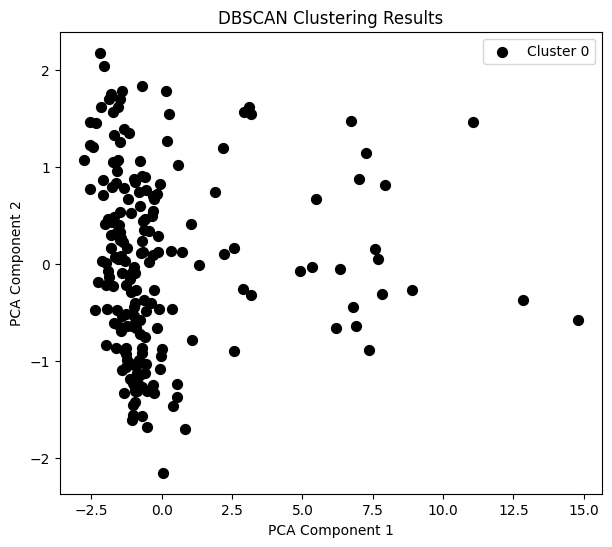

eps:  5
mins:  3


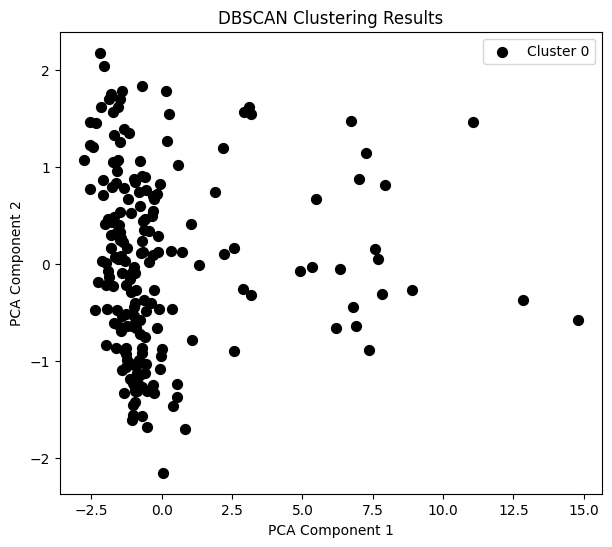

eps:  5
mins:  4


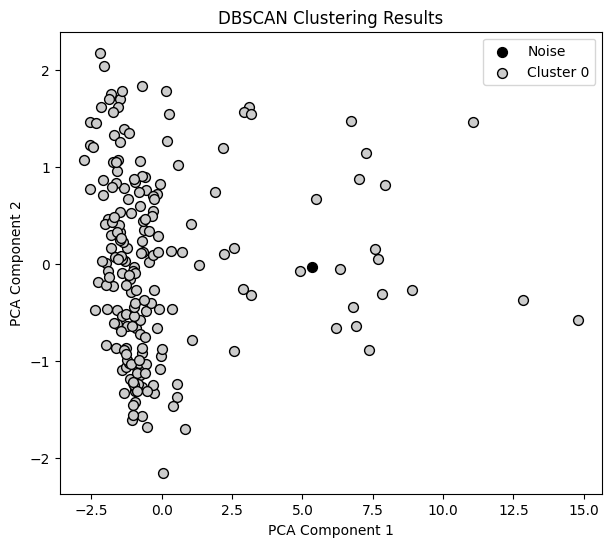

eps:  5
mins:  5


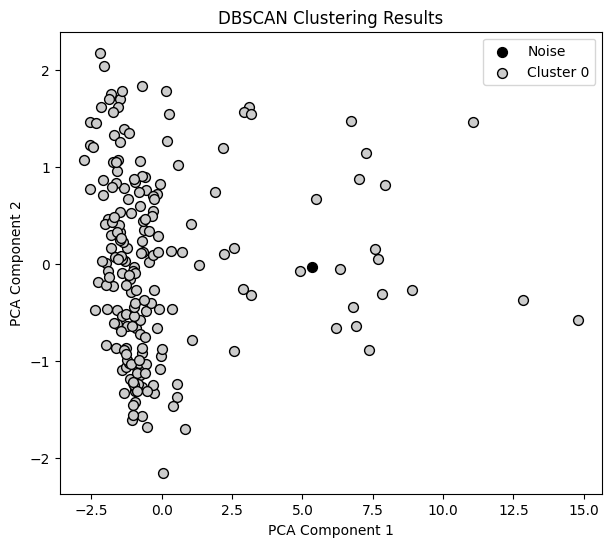

eps:  5
mins:  6


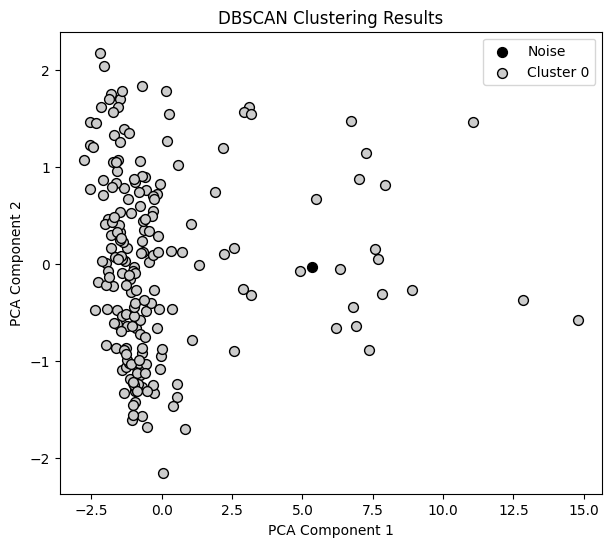

eps:  5
mins:  7


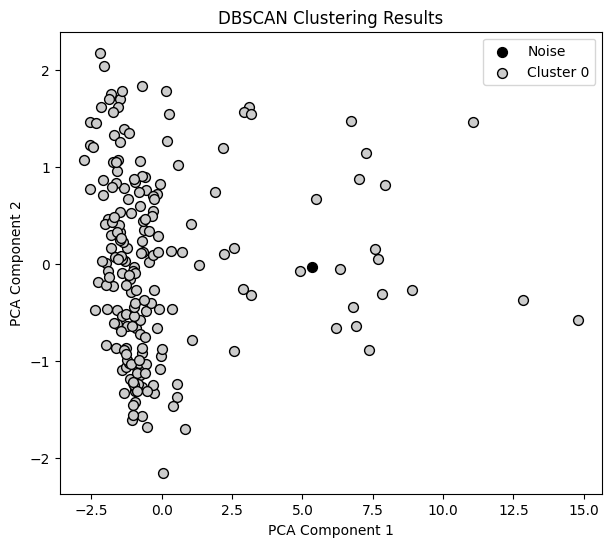

eps:  5
mins:  8


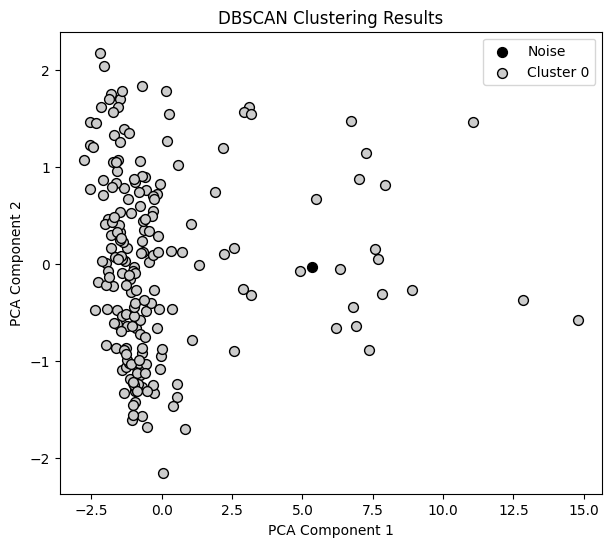

eps:  5
mins:  9


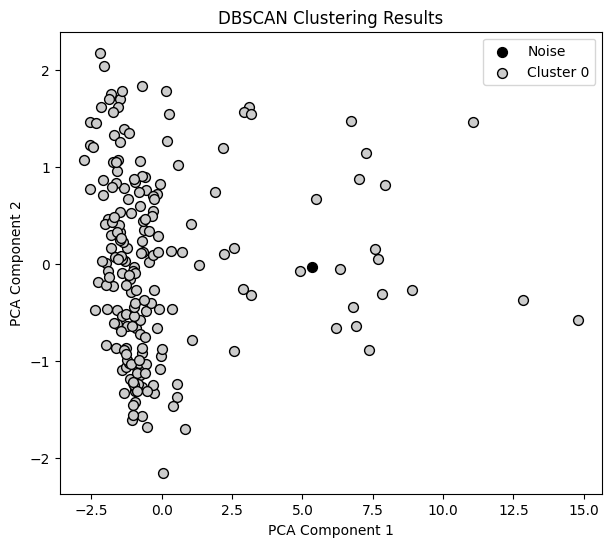

eps:  5
mins:  10


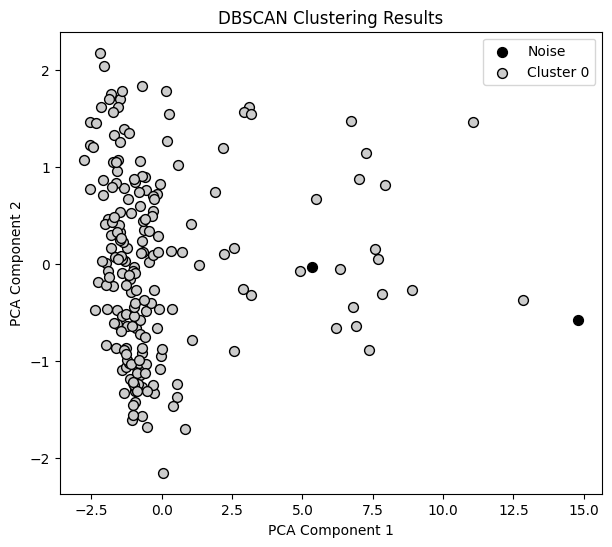

eps:  5
mins:  11


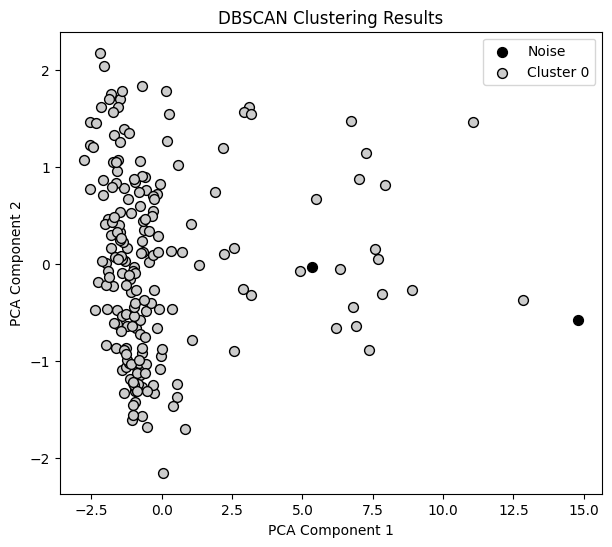

eps:  5
mins:  12


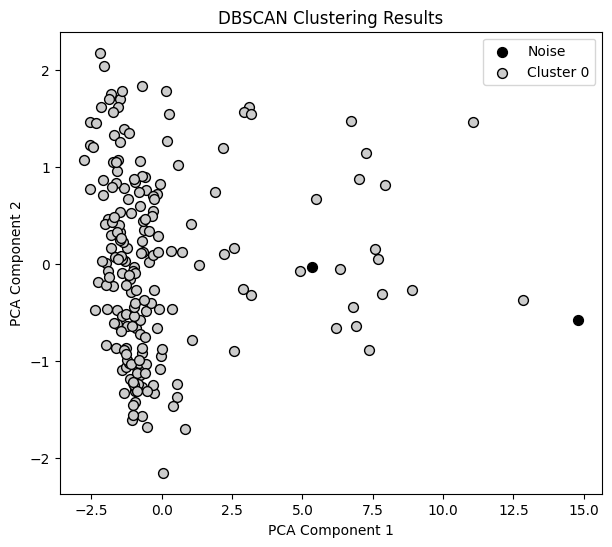

eps:  5
mins:  13


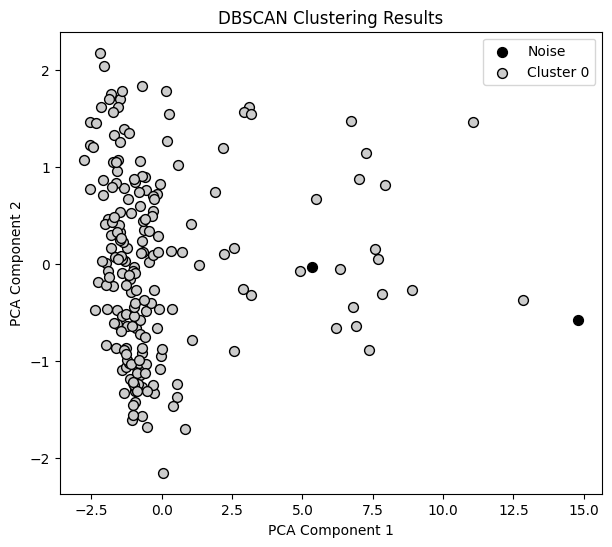

eps:  5
mins:  14


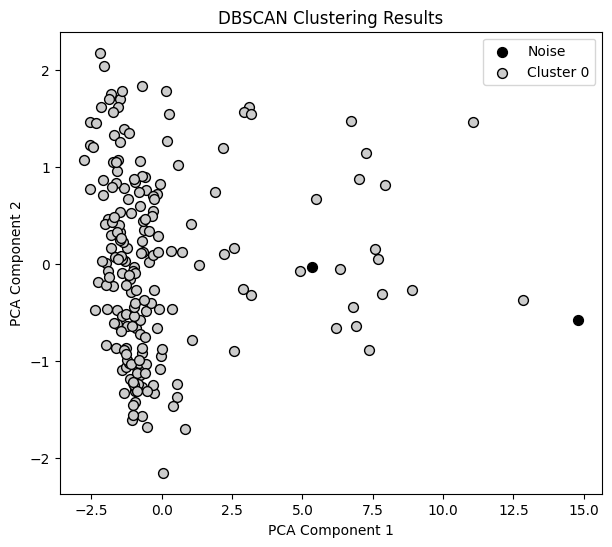

eps:  5
mins:  15


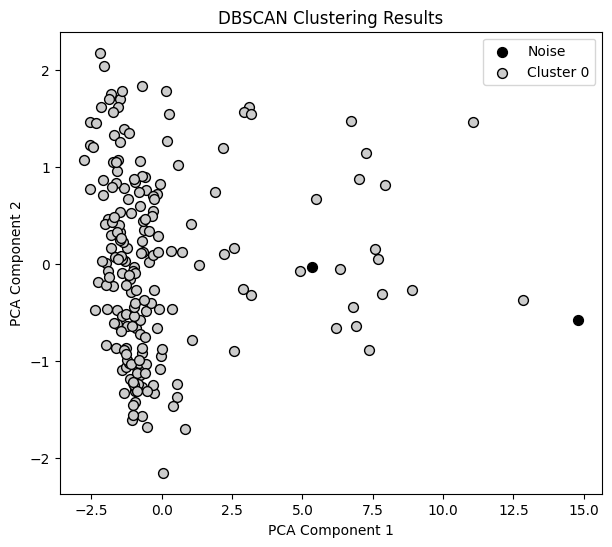

eps:  5
mins:  16


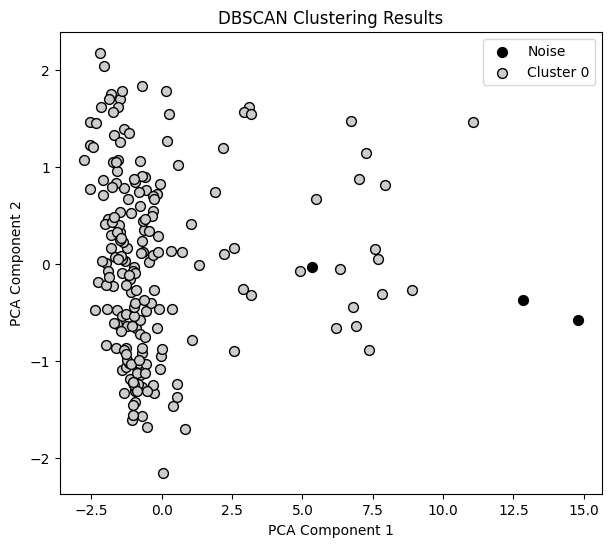

eps:  5
mins:  17


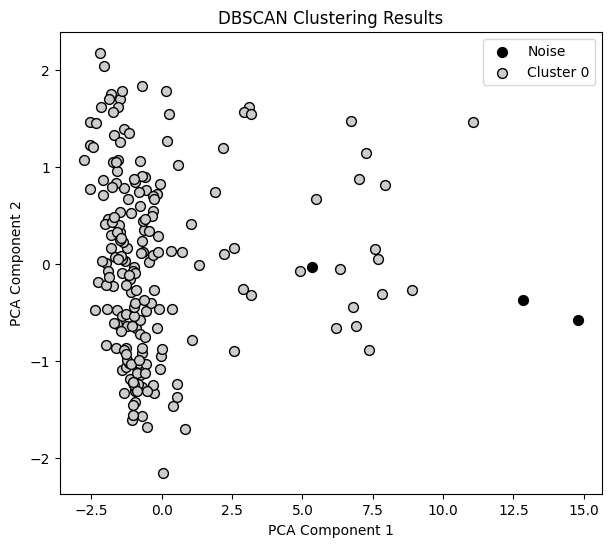

eps:  5
mins:  18


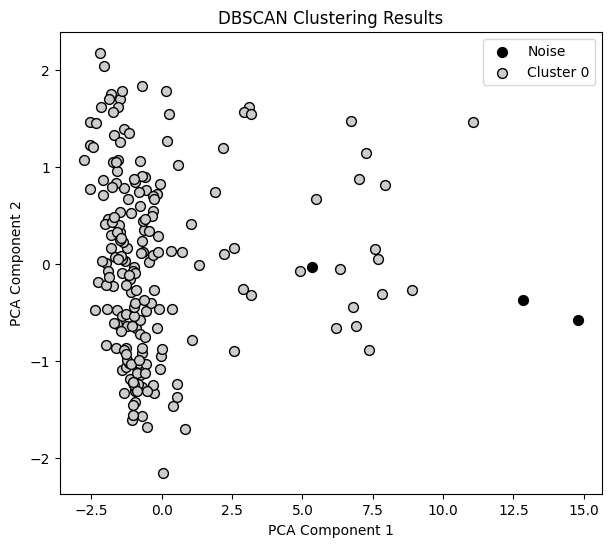

eps:  5
mins:  19


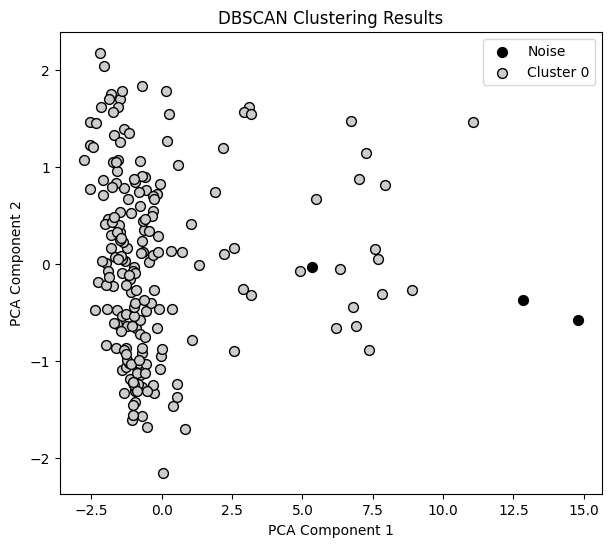

eps:  5
mins:  20


In [ ]:
epss = [1.3,1.4,1.5,1.6,1.7,1.8,1.9,2,3,4,5]
mins = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
for i in range(11):
  for j in range(20):
    cluster_labels = apply_dbscan(EEG_3D_mu_beta_car_T_csp58, epss[i], mins[j])
    plot_dbscan_clusters(EEG_3D_mu_beta_car_T_csp58, cluster_labels)
    print("eps: ", epss[i])
    print("mins: ", mins[j])



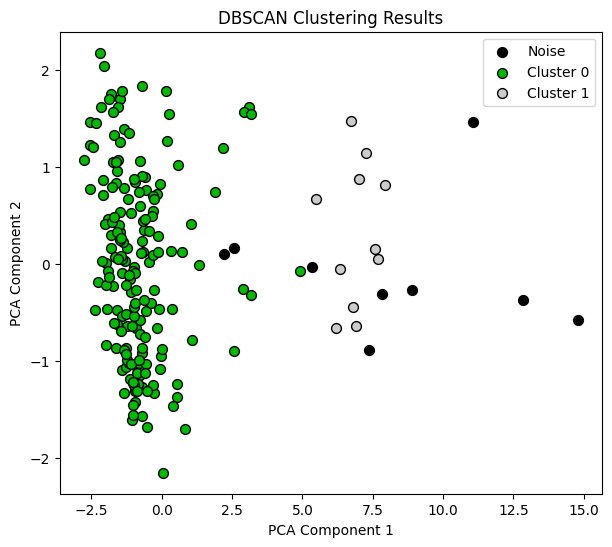

In [ ]:
eps = 3
min_samples = 12
cluster_labels = apply_dbscan(EEG_3D_mu_beta_car_T_csp58, eps, min_samples)

plot_dbscan_clusters(EEG_3D_mu_beta_car_T_csp58, cluster_labels)

#### Clustering Using CSP Method 2 (without transpose):

For n_clusters = 2, the average silhouette_score is : 0.6054149364721152


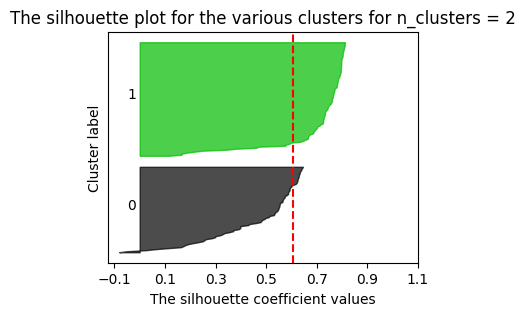

For n_clusters = 3, the average silhouette_score is : 0.5024693066232301


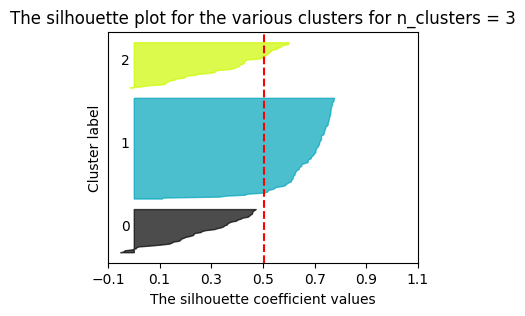

For n_clusters = 4, the average silhouette_score is : 0.49914582094963594


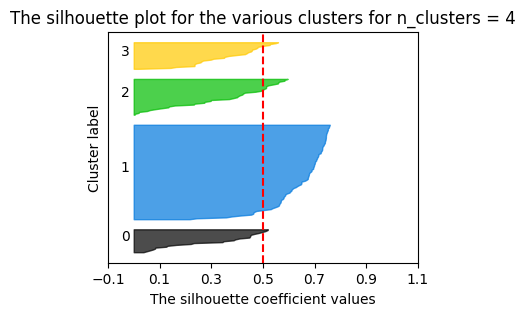

For n_clusters = 5, the average silhouette_score is : 0.4870133970138839


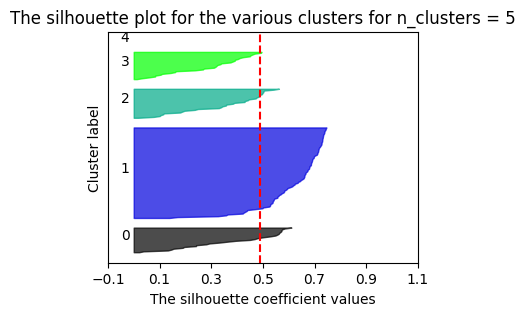

For n_clusters = 6, the average silhouette_score is : 0.5000347654781243


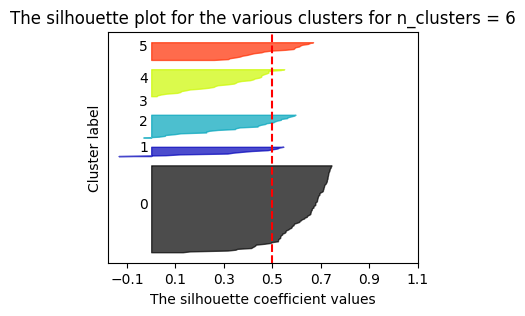

For n_clusters = 7, the average silhouette_score is : 0.3508236455077079


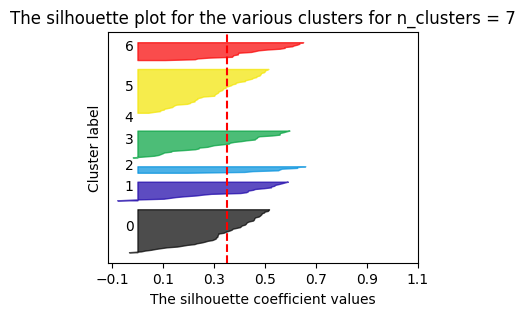

For n_clusters = 8, the average silhouette_score is : 0.3509018563966411


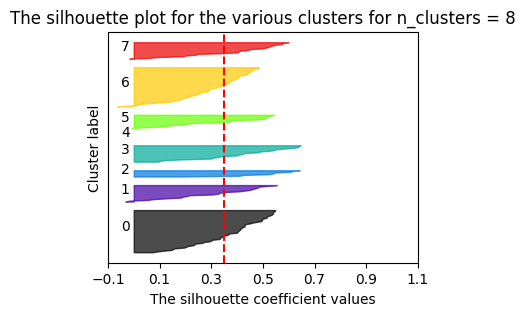

For n_clusters = 9, the average silhouette_score is : 0.3555255889198655


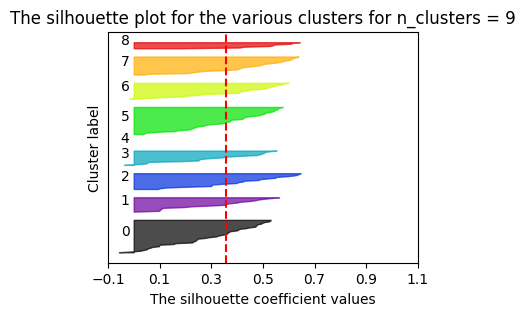

For n_clusters = 10, the average silhouette_score is : 0.3618269976902599


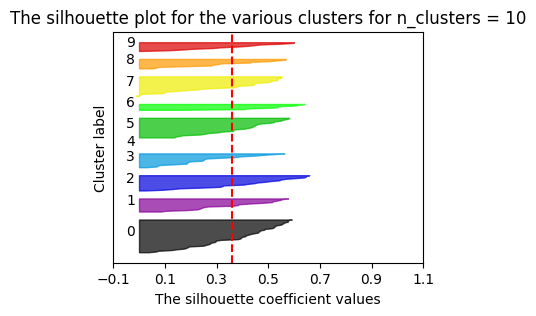

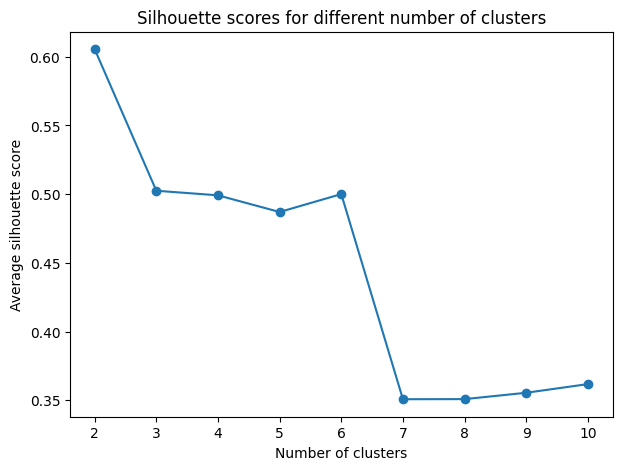

In [ ]:
plot_silhouette(EEG_3D_mu_beta_car_csp2)

In [ ]:

def plot_clusters1(data, cluster_labels, cluster_centers, n_clusters):

    transformed_data = data

    plt.figure(figsize=(6, 4))

    unique_labels = np.unique(cluster_labels)
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    for k, col in zip(unique_labels, colors):
        class_member_mask = (cluster_labels == k)
        xy = transformed_data[class_member_mask]
        plt.scatter(xy[:, 0], xy[:, 1], label=f'Cluster {k}', edgecolor='k', s=50)

    plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], marker='x', s=200, c='red', label='Centroids')

    plt.title("K-means Clustering Results (CSP)")
    plt.xlabel("CSP Component 1")
    plt.ylabel("CSP Component 2")
    plt.legend()
    plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


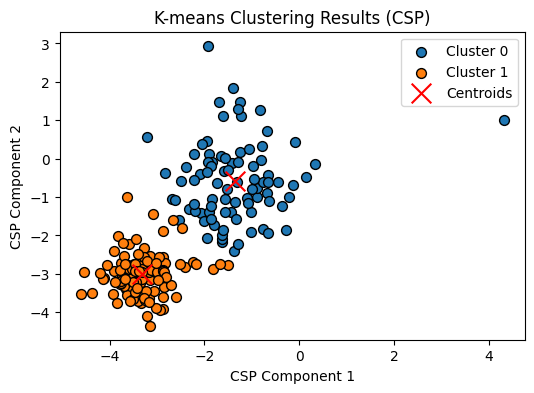

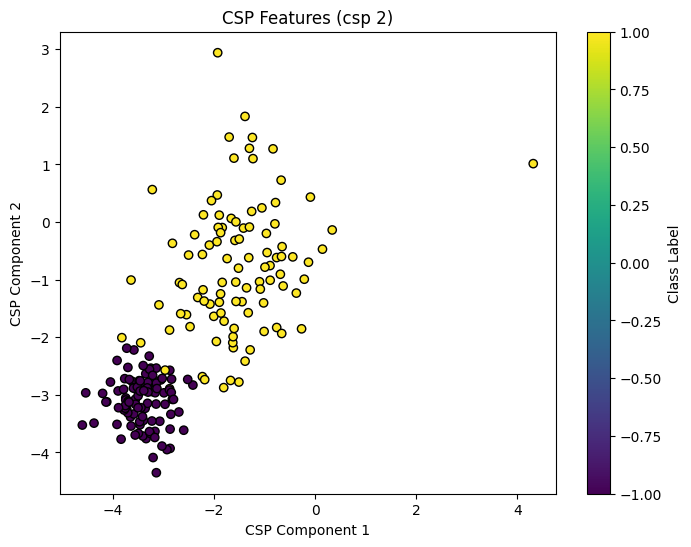

In [ ]:
n_clusters = 2
cluster_labels, cluster_centers = apply_kmeans(EEG_3D_mu_beta_car_csp2, n_clusters)

plot_clusters1(EEG_3D_mu_beta_car_csp2, cluster_labels, cluster_centers,n_clusters )
plot_csp(EEG_3D_mu_beta_car_csp2 ,window_label, "(csp 2)")